# 🏠 KC House Data — End-to-End Model Training & SHAP Explainability

Pipeline này train **5 mô hình hồi quy** trên dữ liệu KC House Data, đánh giá hiệu suất và sinh ra các biểu đồ phân tích:

| Bước | Nội dung |
|------|----------|
| 1 | Preprocessing (load từ `preprocess.py`) |
| 2 | Định nghĩa 7 model: Baseline (Mean), Linear Regression, Random Forest, XGBoost, LightGBM, AdaBoost, SVR |
| 3 | Training + Đánh giá (MAE, RMSE, R²) |
| 4 | Plots: Actual vs Predicted, Segment Analysis, Residuals |
| 5 | Bảng so sánh model |
| 6 | SHAP Explainability (tất cả tree models) |
| 7 | PDP + ICE Plots (giải quyết feature independence assumption) |
| **8** | **Hyperparameter Tuning: CV K-Fold, GridSearchCV, RandomizedSearchCV, Regularization (L1/L2)** |
| 7 | So sánh Baseline |
| 8 | Hyperparameter Tuning: CV K-Fold, GridSearchCV, RandomizedSearchCV, Regularization (L1/L2) |
| 9 | Lưu tất cả model ra file `.pkl` |
| **10** | **Hạn chế & Kết luận** |

## ⚙️ 0. Cấu hình

In [1]:
# ── Đường dẫn — chỉnh lại nếu cần ──────────────────────────────────────────
DATA_PATH  = "kc_house_data.csv"   # <-- chỉnh đường dẫn tới file CSV
OUTPUT_DIR = "results"             # thư mục lưu plots và model

# ── Siêu tham số ────────────────────────────────────────────────────────────
RANDOM_SEED  = 42
SHAP_SAMPLES        = 500   # subsample cho tree models (RF/XGB/LGB/AdaBoost)
SHAP_SAMPLES_KERNEL = 50    # subsample riêng cho KernelExplainer (SVR) — nhỏ để không mất hàng tiếng
PDP_FEATURES = ["sqft_living", "grade", "lat", "luxury_score"]

# ── Hyperparameter Tuning config ─────────────────────────────────────────────
TUNING_CV_FOLDS   = 5        # số fold cho KFold / cross_val_score
TUNING_N_ITER     = 30       # số iteration cho RandomizedSearchCV
TUNING_SCORING    = "r2"     # metric tối ưu hoá ('r2', 'neg_mean_absolute_error', ...)
TUNING_N_JOBS     = -1       # dùng toàn bộ CPU
# Model được chọn để tune (có thể thêm 'XGBoost', 'Random Forest', v.v.)
TUNING_TARGET_MODEL = "LightGBM"


## 📦 1. Import thư viện

In [2]:
import os
import pickle
import warnings
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import shap

from sklearn.ensemble      import RandomForestRegressor, AdaBoostRegressor
from sklearn.dummy         import DummyRegressor
from sklearn.tree          import DecisionTreeRegressor
from sklearn.svm           import SVR
from sklearn.pipeline      import Pipeline
from sklearn.decomposition import PCA
from sklearn.compose       import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.inspection    import PartialDependenceDisplay
from sklearn.metrics       import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import (
    KFold, cross_val_score,
    GridSearchCV, RandomizedSearchCV
)
from sklearn.linear_model  import Ridge, Lasso, LinearRegression
from scipy.stats           import uniform, randint, loguniform
from xgboost               import XGBRegressor
import lightgbm            as lgb

from preprocess import load_and_preprocess

warnings.filterwarnings("ignore")
%matplotlib inline
matplotlib.rcParams["figure.dpi"] = 100   # độ phân giải hiển thị trong notebook

os.makedirs(OUTPUT_DIR, exist_ok=True)
print("✅ Import xong. Output sẽ được lưu vào:", os.path.abspath(OUTPUT_DIR))


c:\Users\LOQ\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✅ Import xong. Output sẽ được lưu vào: c:\Users\LOQ\Downloads\coding\PY\py\Project\results


## 🔧 2. Định nghĩa Model

In [3]:
def build_models(num_cols: list, cat_cols: list = None):
    """
    Trả về dict { tên_model: estimator }.
    SVR dùng Pipeline nội bộ (cần OneHotEncoder + PCA).
    Các model còn lại là tree-based, nhận ordinal-encoded data trực tiếp.
    """
    if cat_cols is None:
        cat_cols = []

    svr_preprocessor = ColumnTransformer(
        transformers=[
            ("num", StandardScaler(), num_cols),
            ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols)
        ] if cat_cols else [("num", StandardScaler(), num_cols)]
    )

    svr_pipeline = Pipeline([
        ("preprocessor", svr_preprocessor),
        ("pca",   PCA(n_components=min(50, len(num_cols)))),
        ("model", SVR(kernel="rbf", C=10, epsilon=0.01, gamma="scale")),
    ])

    models = {
        "Baseline (Mean)": DummyRegressor(strategy="mean"),
        "Linear Regression": LinearRegression(n_jobs=-1),
        "Random Forest": RandomForestRegressor(
            n_estimators=500, max_depth=12, n_jobs=-1, random_state=RANDOM_SEED
        ),
        "XGBoost": XGBRegressor(
            n_estimators=500, max_depth=5, learning_rate=0.05,
            objective="reg:squarederror", n_jobs=-1,
            random_state=RANDOM_SEED, verbosity=0
        ),
        "LightGBM": lgb.LGBMRegressor(
            n_estimators=500, num_leaves=31, max_depth=5, learning_rate=0.01,
            objective="regression", n_jobs=-1, random_state=RANDOM_SEED, verbose=-1
        ),
        "AdaBoost": AdaBoostRegressor(
            estimator=DecisionTreeRegressor(max_depth=5),
            n_estimators=500, learning_rate=0.05, random_state=RANDOM_SEED
        ),
        "SVR": svr_pipeline,
    }
    return models

print("✅ Hàm build_models() đã sẵn sàng.")

✅ Hàm build_models() đã sẵn sàng.


## 📐 3. Hàm đánh giá & In kết quả

In [4]:
def compute_metrics(y_true_log, y_pred_log):
    """Inverse-transform log-price và tính MAE, RMSE, R² trên thang USD gốc."""
    y_true = np.expm1(y_true_log)
    y_pred = np.expm1(y_pred_log)
    mae  = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2   = r2_score(y_true, y_pred)
    return mae, rmse, r2, y_true, y_pred


def print_metrics(name, mae, rmse, r2):
    print(f"\n{'─'*55}")
    print(f"  Model : {name}")
    print(f"  R²    : {r2:.4f}")
    print(f"  MAE   : ${mae:>12,.0f}")
    print(f"  RMSE  : ${rmse:>12,.0f}")
    print(f"{'─'*55}")

print("✅ Hàm compute_metrics() và print_metrics() đã sẵn sàng.")

✅ Hàm compute_metrics() và print_metrics() đã sẵn sàng.


## 📊 4. Hàm vẽ biểu đồ

In [5]:
def plot_actual_vs_predicted(y_true, y_pred, model_name, output_dir):
    fig, ax = plt.subplots(figsize=(9, 7))
    r2 = r2_score(y_true, y_pred)

    ax.scatter(y_true, y_pred, alpha=0.45, color="royalblue",
               s=20, label="Predictions", rasterized=True)

    lo, hi = min(y_true.min(), y_pred.min()), max(y_true.max(), y_pred.max())
    ax.plot([lo, hi], [lo, hi], "r--", lw=2, label="Perfect Fit")
    

    ax.set_title(f"{model_name}: Actual vs Predicted  (R² = {r2:.3f})",
                 fontsize=13, fontweight="bold")
    ax.set_xlabel("Actual Price (USD)", fontsize=11)
    ax.set_ylabel("Predicted Price (USD)", fontsize=11)
    ax.legend()
    ax.grid(True, ls="--", alpha=0.5)
    plt.tight_layout()

    fname = os.path.join(output_dir, f"avp_{model_name.replace(' ', '_')}.png")
    plt.savefig(fname, dpi=300)
    plt.show()
    print(f"  [plot] Saved → {fname}")


def plot_segment_report(y_true, y_pred, segment_series, seg_col, model_name, output_dir):
    """Scatter plots theo từng phân khúc với MAE/RMSE/R² trong tiêu đề."""
    results_df = pd.DataFrame({
        "Actual":    y_true.values,
        "Predicted": y_pred.values,
        "Segment":   segment_series.values
    })

    segments = sorted(results_df["Segment"].unique())
    cols = 2
    rows = max(1, (len(segments) + 1) // cols)
    fig, axes = plt.subplots(rows, cols, figsize=(14, 5 * rows))
    axes = np.array(axes).flatten()

    print(f"\n  Segment report — '{seg_col}'")
    print(f"  {'Segment':<20} | {'N':>6} | {'MAE':>12} | {'RMSE':>12} | {'R2':>8}")
    print(f"  {'─'*66}")

    idx = 0
    for seg in segments:
        mask = results_df["Segment"] == seg
        yt, yp = results_df.loc[mask, "Actual"], results_df.loc[mask, "Predicted"]
        if len(yt) < 2:
            continue
        mae  = mean_absolute_error(yt, yp)
        rmse = np.sqrt(mean_squared_error(yt, yp))
        r2   = r2_score(yt, yp)
        print(f"  {str(seg):<20} | {len(yt):>6} | {mae:>12,.0f} | {rmse:>12,.0f} | {r2:>8.4f}")

        ax = axes[idx]
        ax.scatter(yt, yp, alpha=0.55, color="teal", s=25, rasterized=True)
        lo, hi = min(yt.min(), yp.min()), max(yt.max(), yp.max())
        ax.plot([lo, hi], [lo, hi], "r--", lw=1.8)
        ax.set_title(f"{seg}  |  MAE: {mae:,.0f}  R²: {r2:.2f}",
                     fontsize=10, fontweight="bold")
        ax.set_xlabel("Actual (USD)")
        ax.set_ylabel("Predicted (USD)")
        ax.grid(True, ls="--", alpha=0.4)
        idx += 1

    for j in range(idx, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f"{model_name} — Segment Analysis by {seg_col}",
                 fontsize=13, fontweight="bold", y=1.01)
    plt.tight_layout()

    fname = os.path.join(output_dir,
                         f"seg_{model_name.replace(' ', '_')}_{seg_col}.png")
    plt.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"  [plot] Saved → {fname}")


def plot_residuals(y_true, y_pred, model_name, output_dir):
    residuals = y_true - y_pred
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].scatter(y_pred, residuals, alpha=0.4, color="purple",
                    s=15, rasterized=True)
    axes[0].axhline(0, color="red", lw=2, ls="--")
    axes[0].set_xlabel("Predicted Price (USD)", fontsize=11)
    axes[0].set_ylabel("Residual (Actual − Predicted)", fontsize=11)
    axes[0].set_title("Residuals vs Predicted", fontsize=12, fontweight="bold")
    axes[0].grid(True, ls="--", alpha=0.4)

    axes[1].hist(residuals, bins=60, color="slateblue", edgecolor="white")
    axes[1].axvline(0, color="red", lw=2, ls="--")
    axes[1].set_xlabel("Residual (USD)", fontsize=11)
    axes[1].set_ylabel("Count", fontsize=11)
    axes[1].set_title("Residual Distribution", fontsize=12, fontweight="bold")
    axes[1].grid(True, ls="--", alpha=0.4)

    plt.suptitle(f"{model_name} — Residual Diagnostic",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()

    fname = os.path.join(output_dir,
                         f"residuals_{model_name.replace(' ', '_')}.png")
    plt.savefig(fname, dpi=300)
    plt.show()
    print(f"  [plot] Saved → {fname}")


def plot_comparison_table(results: list, output_dir: str):
    """Lưu bảng so sánh model dưới dạng PNG chất lượng cao."""
    df = pd.DataFrame(results, columns=["Model", "MAE (USD)", "RMSE (USD)", "R²"])
    df["R²"]        = df["R²"].map(lambda x: f"{x:.4f}")
    df["MAE (USD)"]  = df["MAE (USD)"].map(lambda x: f"{x:,.0f}")
    df["RMSE (USD)"] = df["RMSE (USD)"].map(lambda x: f"{x:,.0f}")
    df.sort_values("R²", ascending=False, inplace=True)

    fig, ax = plt.subplots(figsize=(10, max(3, 0.7 * len(df) + 1.5)))
    ax.axis("off")

    tbl = ax.table(
        cellText=df.values,
        colLabels=df.columns,
        cellLoc="center",
        loc="center",
        colColours=["#dde8f0"] * 4
    )
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(11)
    tbl.scale(1.15, 2.6)

    for (row, col), cell in tbl.get_celld().items():
        cell.set_linewidth(0.8)
        if row == 0:
            cell.get_text().set_weight("bold")
            cell.set_facecolor("#2c5f8a")
            cell.get_text().set_color("white")
        elif row % 2 == 0:
            cell.set_facecolor("#f4f8fb")

    plt.title("Model Performance Comparison — KC House Data",
              fontsize=13, fontweight="bold", pad=20)
    plt.tight_layout()

    fname = os.path.join(output_dir, "model_comparison_table.png")
    plt.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"\n[plot] Comparison table saved → {fname}")

print("✅ Tất cả hàm plot đã sẵn sàng.")

✅ Tất cả hàm plot đã sẵn sàng.


## 🔍 5. Hàm SHAP Analysis

In [6]:
def run_shap_analysis(model, X_test: pd.DataFrame,
                      model_name: str, output_dir: str,
                      n_samples: int = SHAP_SAMPLES):
    """
    Sinh 3 loại biểu đồ SHAP:
      1. Beeswarm / Summary plot  — tầm quan trọng + chiều tác động
      2. Bar plot                 — mean |SHAP| theo feature
      3. Waterfall plot           — phân tích một dự đoán đơn lẻ

    Explainer strategy:
      - Pipeline (SVR)      → KernelExplainer (chậm, dùng predict())
      - AdaBoostRegressor   → TreeExplainer trên từng base estimator,
                              rồi weighted-average SHAP values
      - Tree-based còn lại  → TreeExplainer trực tiếp (nhanh, chính xác)
    """
    from sklearn.ensemble import AdaBoostRegressor
    print(f"\n[SHAP] Computing SHAP values for {model_name} "
          f"(subsample={n_samples}) …")

    idx = np.random.default_rng(RANDOM_SEED).choice(
        len(X_test), size=min(n_samples, len(X_test)), replace=False
    )
    X_sample = X_test.iloc[idx].reset_index(drop=True)

    explanation = None  # waterfall chỉ dùng được với TreeExplainer object

    if isinstance(model, Pipeline):
        # ── SVR / Pipeline → KernelExplainer ──────────────────────────────
        # Dùng lambda để wrap predict() — tránh lỗi AttributeError:
        # KernelExplainer cố gán feature_names_in_ lên Pipeline nhưng
        # Pipeline không có setter cho property đó.
        print(f"  [SHAP] Dùng KernelExplainer cho {model_name} (Pipeline)...")
        print(f"  ⚠️  KernelExplainer chậm hơn TreeExplainer ~100x.")
        print(f"     Dùng {SHAP_SAMPLES_KERNEL} samples + 100 nsamples để đảm bảo tốc độ.")

        # Subsample nhỏ riêng cho SVR — KernelExplainer scale O(n²)
        svr_idx    = np.random.default_rng(RANDOM_SEED).choice(
                         len(X_sample), size=min(SHAP_SAMPLES_KERNEL, len(X_sample)), replace=False)
        X_svr      = X_sample.iloc[svr_idx].reset_index(drop=True)

        # Background 20 điểm là đủ cho KernelExplainer (kmeans summary)
        bg_data    = shap.kmeans(X_svr, 20)
        predict_fn = lambda x: model.predict(pd.DataFrame(x, columns=X_sample.columns))
        explainer  = shap.KernelExplainer(predict_fn, bg_data)

        # nsamples="auto" để SHAP tự chọn, l1_reg để tăng tốc
        shap_values = explainer.shap_values(X_svr.values, nsamples=100, l1_reg="num_features(10)")
        X_sample    = X_svr   # update X_sample để plot dùng đúng subset

    elif isinstance(model, AdaBoostRegressor):
        # ── AdaBoost → weighted average SHAP của các base estimators ──────
        # TreeExplainer không hỗ trợ AdaBoostRegressor trực tiếp,
        # nhưng hỗ trợ từng DecisionTree bên trong.
        print(f"  [SHAP] AdaBoost: tính SHAP từng base estimator rồi weighted-average...")
        estimators  = model.estimators_
        weights     = model.estimator_weights_
        weights     = np.array(weights)
        weights     = weights / weights.sum()   # normalize thành tỉ lệ

        shap_list = []
        for est, w in zip(estimators, weights):
            exp_i  = shap.TreeExplainer(est)
            sv_i   = exp_i.shap_values(X_sample)
            shap_list.append(sv_i * w)

        shap_values = np.sum(shap_list, axis=0)
        # Không có explanation object cho waterfall với cách này
        explanation = None

    else:
        # ── RF / XGBoost / LightGBM → TreeExplainer trực tiếp ─────────────
        explainer   = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X_sample)
        explanation = explainer(X_sample)

    # ── Beeswarm / Summary ──────────────────────────────────────────────────
    plt.figure(figsize=(10, 8))
    shap.summary_plot(shap_values, X_sample, show=False,
                      plot_type="dot", max_display=20)
    plt.title(f"SHAP Summary Plot — {model_name}\n"
              f"(Feature impact on log-price prediction)",
              fontsize=13, fontweight="bold")
    plt.tight_layout()
    fname = os.path.join(output_dir,
                         f"shap_beeswarm_{model_name.replace(' ', '_')}.png")
    plt.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"  [SHAP] Beeswarm saved → {fname}")

    # ── Bar (mean |SHAP|) ───────────────────────────────────────────────────
    plt.figure(figsize=(9, 7))
    shap.summary_plot(shap_values, X_sample, show=False,
                      plot_type="bar", max_display=20)
    plt.title(f"SHAP Feature Importance (mean |SHAP|) — {model_name}",
              fontsize=13, fontweight="bold")
    plt.tight_layout()
    fname = os.path.join(output_dir,
                         f"shap_bar_{model_name.replace(' ', '_')}.png")
    plt.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"  [SHAP] Bar chart saved → {fname}")

    # ── Waterfall (single prediction) ───────────────────────────────────────
    if explanation is not None:
        plt.figure(figsize=(10, 6))
        shap.waterfall_plot(explanation[0], show=False, max_display=15)
        plt.title(f"SHAP Waterfall — Single Prediction  [{model_name}]",
                  fontsize=12, fontweight="bold")
        plt.tight_layout()
        fname = os.path.join(output_dir,
                             f"shap_waterfall_{model_name.replace(' ', '_')}.png")
        plt.savefig(fname, dpi=300, bbox_inches="tight")
        plt.show()
        print(f"  [SHAP] Waterfall saved → {fname}")
    else:
        print(f"  [SHAP] Waterfall bỏ qua cho {model_name} (không hỗ trợ với explainer này)")

    return shap_values, X_sample

print("✅ Hàm run_shap_analysis() đã sẵn sàng.")


✅ Hàm run_shap_analysis() đã sẵn sàng.


## 📉 6. Hàm Partial Dependence Plots (PDP)

In [7]:
def run_pdp(model, X_train: pd.DataFrame,
            model_name: str, output_dir: str,
            features: list = None):
    """PDP cho danh sách features dùng sklearn PartialDependenceDisplay."""
    if isinstance(model, Pipeline):
        print("  [PDP] Bỏ qua SVR pipeline (không tương thích với PDP display).")
        return

    if features is None:
        features = PDP_FEATURES

    features = [f for f in features if f in X_train.columns]
    if not features:
        print("  [PDP] Không tìm thấy feature phù hợp — bỏ qua.")
        return

    print(f"\n[PDP] Computing partial dependence for: {features}")
    fig, axes = plt.subplots(1, len(features),
                             figsize=(5 * len(features), 4.5))

    PartialDependenceDisplay.from_estimator(
        estimator=model,
        X=X_train,
        features=features,
        grid_resolution=50,
        ax=axes if len(features) > 1 else [axes],
        line_kw={"color": "teal", "lw": 2}
    )

    plt.suptitle(f"Partial Dependence Plots — {model_name}",
                 fontsize=13, fontweight="bold", y=1.03)
    plt.tight_layout()

    fname = os.path.join(output_dir,
                         f"pdp_{model_name.replace(' ', '_')}.png")
    plt.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"  [PDP] Saved → {fname}")

print("✅ Hàm run_pdp() đã sẵn sàng.")

✅ Hàm run_pdp() đã sẵn sàng.


---
## 🚀 STEP 1 — Preprocessing

In [8]:
print("=" * 60)
print("  STEP 1: PREPROCESSING")
print("=" * 60)

X_train, X_test, y_train, y_test, info = load_and_preprocess(DATA_PATH)
feature_names = info["feature_names"]

# Tạo price quantile segments cho segment analysis
q_labels = ["Budget", "Mid-Range", "Premium", "Luxury"]
X_test_seg = pd.qcut(
    info["y_raw_test"].values,
    q=4, labels=q_labels
)

print(f"\n  Train size : {X_train.shape}")
print(f"  Test size  : {X_test.shape}")
print(f"  Features   : {len(feature_names)}")
print(f"  Segments   : {q_labels}")

  STEP 1: PREPROCESSING
[load]  Rows: 21,613  |  Columns: 21
[clean] Removed 109 extreme-price outliers  (cap: $2,453,325)
[clean] Remaining rows: 21,502
[engineer] Feature count: 27 features  (target excluded)
[encode] Ordinal-encoded: ['condition', 'grade', 'view', 'waterfront']
[scale]  Scaled 28 numeric columns via StandardScaler

[pipeline] Train size : 17,201
[pipeline] Test  size : 4,301
[pipeline] Features   : 28

  Train size : (17201, 28)
  Test size  : (4301, 28)
  Features   : 28
  Segments   : ['Budget', 'Mid-Range', 'Premium', 'Luxury']


## 🏗️ STEP 2 — Xây dựng Model

In [9]:
print("=" * 60)
print("  STEP 2: BUILDING MODELS")
print("=" * 60)

num_cols = feature_names   # tất cả columns đã là numeric sau preprocessing
models   = build_models(num_cols)

print("\n  Các model sẽ được train:")
for name in models:
    print(f"    • {name}")

  STEP 2: BUILDING MODELS

  Các model sẽ được train:
    • Baseline (Mean)
    • Linear Regression
    • Random Forest
    • XGBoost
    • LightGBM
    • AdaBoost
    • SVR


## 🏋️ STEP 3 — Training & Đánh giá

> **Lưu ý:** Bước này có thể mất **vài phút** tùy cấu hình máy, đặc biệt với SVR.

  STEP 3: TRAINING & EVALUATION

▶  Training Baseline (Mean) …

───────────────────────────────────────────────────────
  Model : Baseline (Mean)
  R²    : -0.0389
  MAE   : $     208,527
  RMSE  : $     315,355
───────────────────────────────────────────────────────


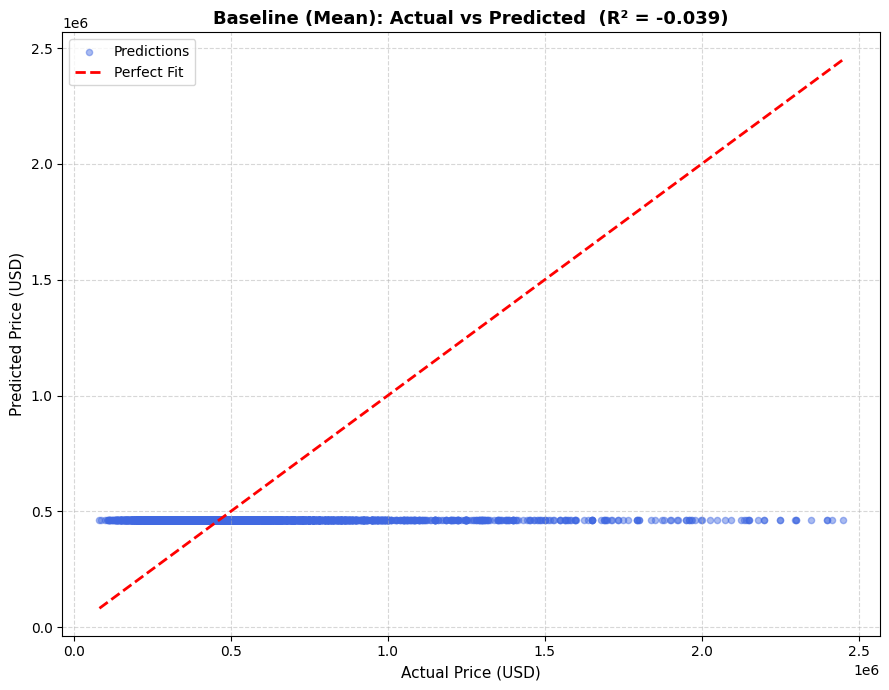

  [plot] Saved → results\avp_Baseline_(Mean).png

  Segment report — 'Price Segment'
  Segment              |      N |          MAE |         RMSE |       R2
  ──────────────────────────────────────────────────────────────────
  Budget               |   1078 |      212,963 |      218,244 | -19.9190
  Luxury               |   1075 |      467,809 |      578,229 |  -1.8947
  Mid-Range            |   1073 |       80,850 |       89,454 |  -4.4612
  Premium              |   1075 |       72,236 |       88,253 |  -1.7962


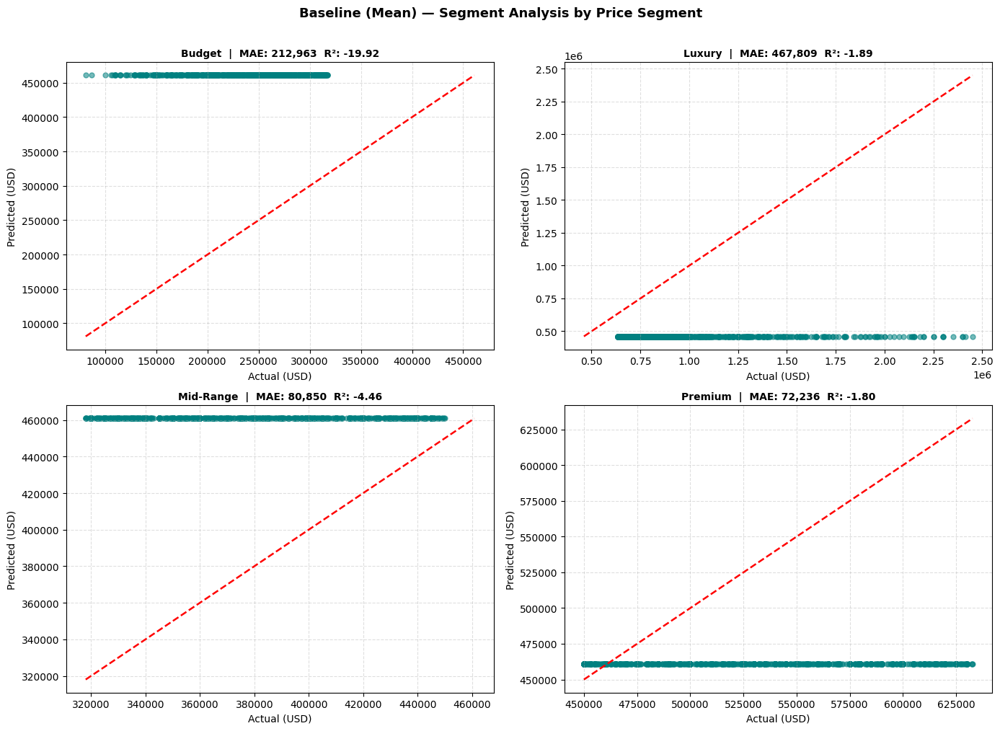

  [plot] Saved → results\seg_Baseline_(Mean)_Price Segment.png


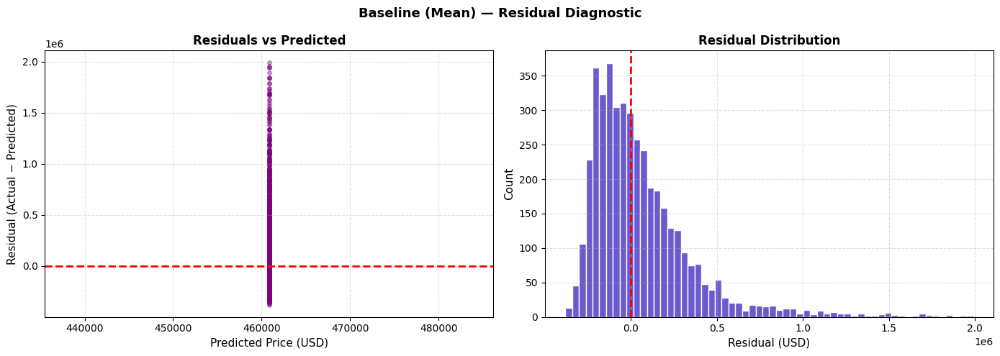

  [plot] Saved → results\residuals_Baseline_(Mean).png

▶  Training Linear Regression …

───────────────────────────────────────────────────────
  Model : Linear Regression
  R²    : 0.7153
  MAE   : $     103,408
  RMSE  : $     165,076
───────────────────────────────────────────────────────


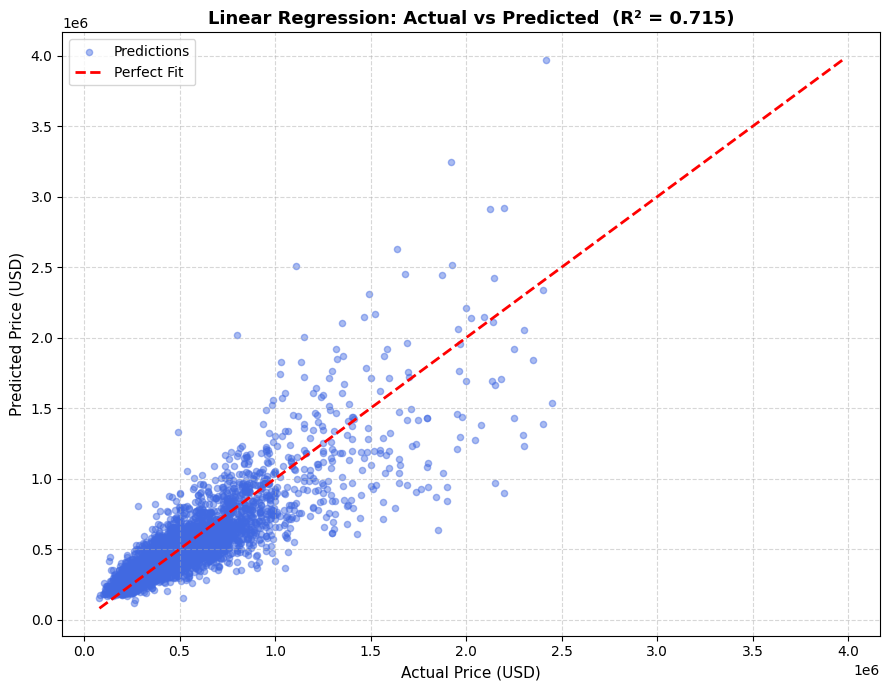

  [plot] Saved → results\avp_Linear_Regression.png

  Segment report — 'Price Segment'
  Segment              |      N |          MAE |         RMSE |       R2
  ──────────────────────────────────────────────────────────────────
  Budget               |   1078 |       55,351 |       74,380 |  -1.4298
  Luxury               |   1075 |      207,672 |      288,676 |   0.2785
  Mid-Range            |   1073 |       62,226 |       82,870 |  -3.6869
  Premium              |   1075 |       88,442 |      115,278 |  -3.7710


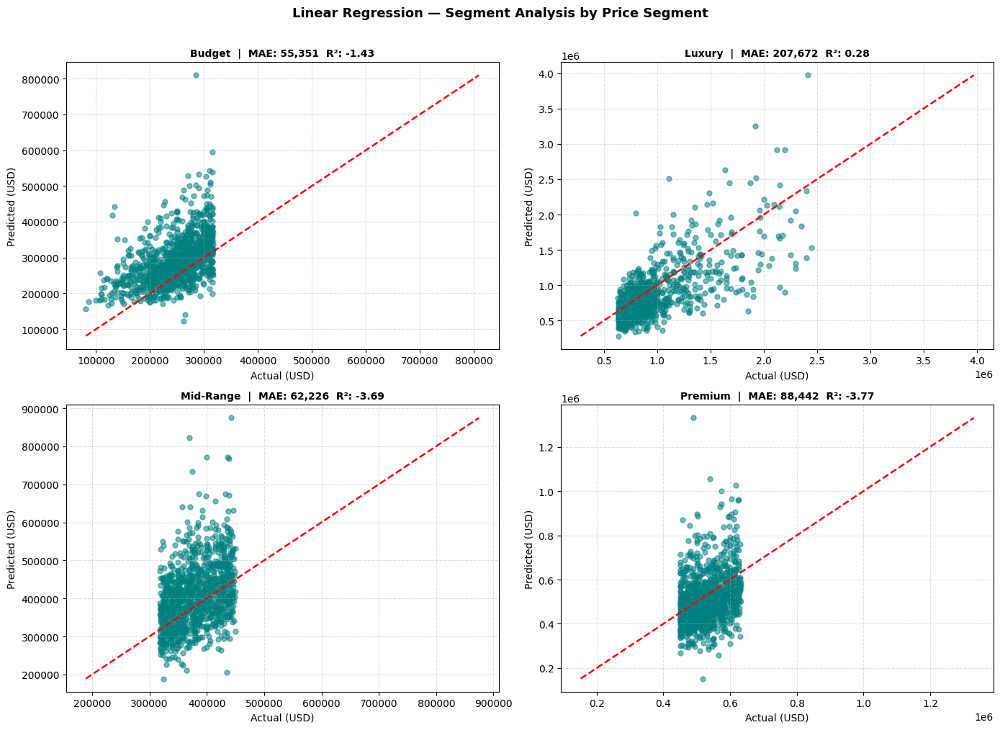

  [plot] Saved → results\seg_Linear_Regression_Price Segment.png


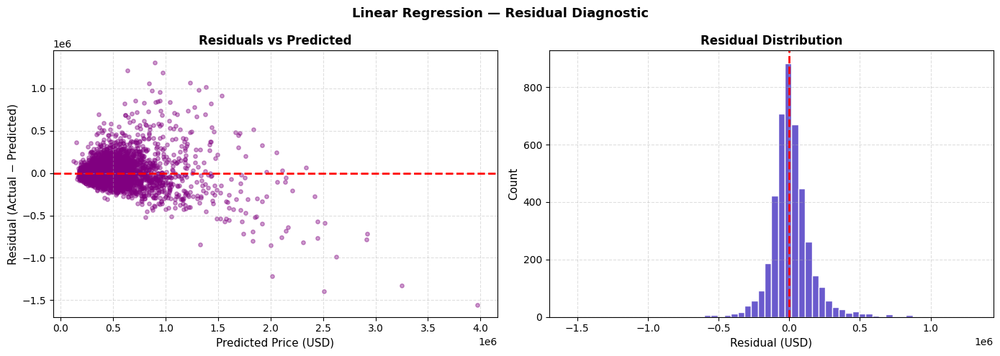

  [plot] Saved → results\residuals_Linear_Regression.png

▶  Training Random Forest …

───────────────────────────────────────────────────────
  Model : Random Forest
  R²    : 0.8726
  MAE   : $      65,633
  RMSE  : $     110,424
───────────────────────────────────────────────────────


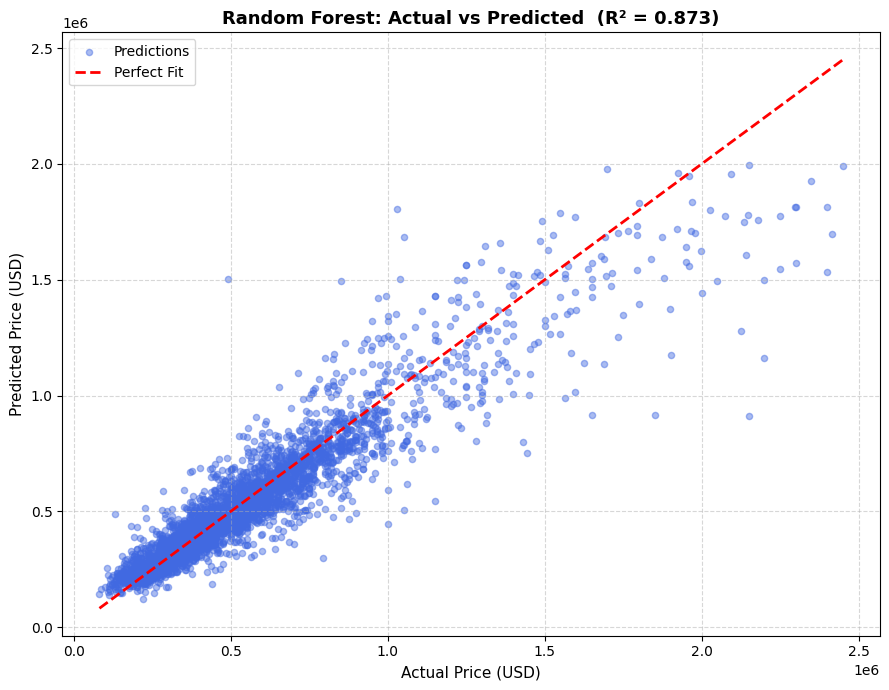

  [plot] Saved → results\avp_Random_Forest.png

  Segment report — 'Price Segment'
  Segment              |      N |          MAE |         RMSE |       R2
  ──────────────────────────────────────────────────────────────────
  Budget               |   1078 |       36,301 |       53,489 |  -0.2566
  Luxury               |   1075 |      128,637 |      189,329 |   0.6897
  Mid-Range            |   1073 |       40,901 |       56,459 |  -1.1755
  Premium              |   1075 |       56,730 |       82,998 |  -1.4731


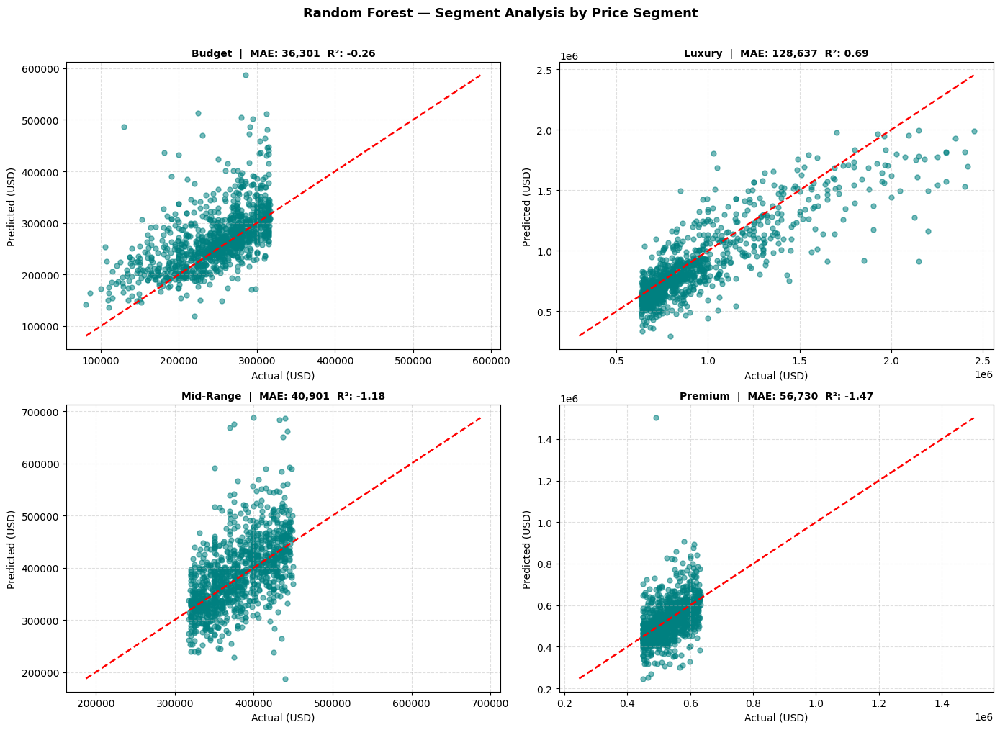

  [plot] Saved → results\seg_Random_Forest_Price Segment.png


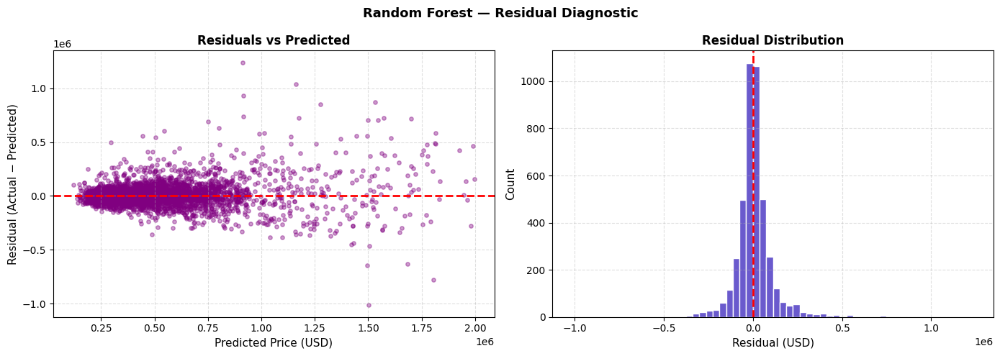

  [plot] Saved → results\residuals_Random_Forest.png

▶  Training XGBoost …

───────────────────────────────────────────────────────
  Model : XGBoost
  R²    : 0.8976
  MAE   : $      59,686
  RMSE  : $      99,013
───────────────────────────────────────────────────────


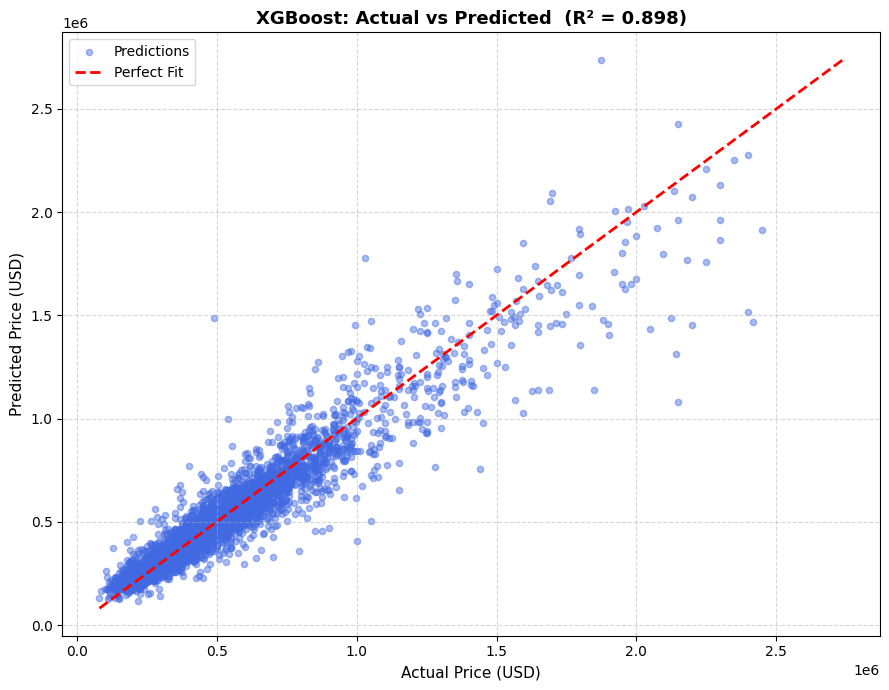

  [plot] Saved → results\avp_XGBoost.png

  Segment report — 'Price Segment'
  Segment              |      N |          MAE |         RMSE |       R2
  ──────────────────────────────────────────────────────────────────
  Budget               |   1078 |       34,077 |       49,265 |  -0.0659
  Luxury               |   1075 |      113,863 |      167,458 |   0.7572
  Mid-Range            |   1073 |       38,327 |       53,911 |  -0.9836
  Premium              |   1075 |       52,510 |       76,460 |  -1.0988


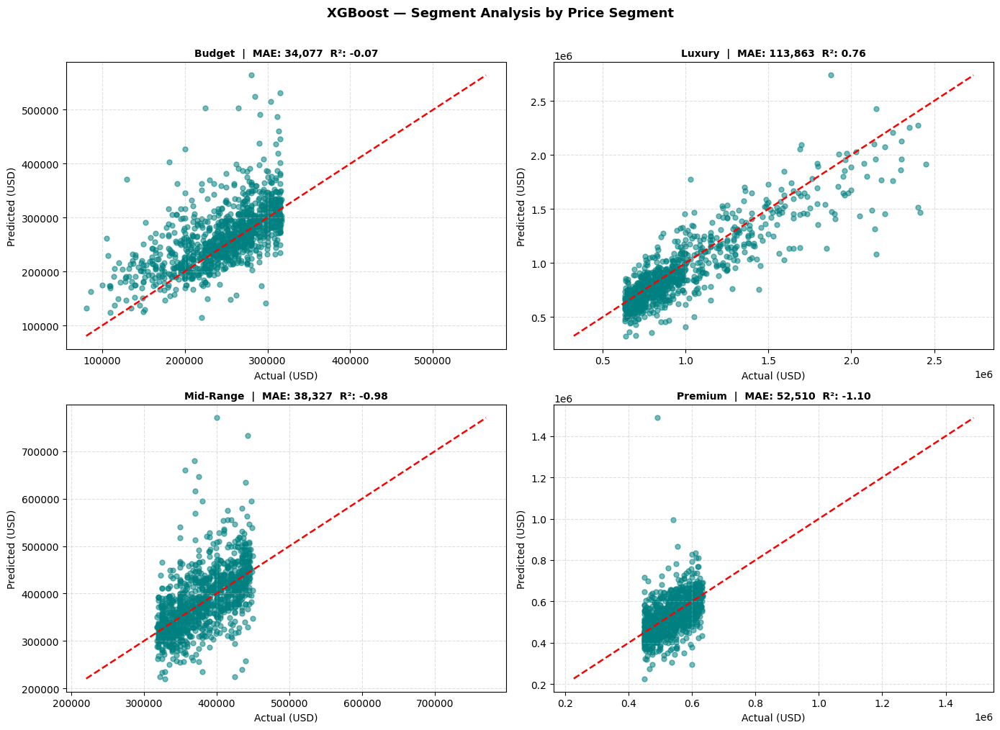

  [plot] Saved → results\seg_XGBoost_Price Segment.png


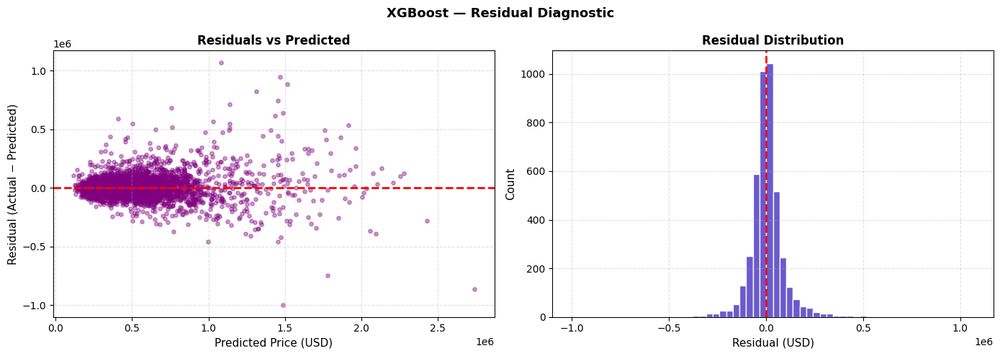

  [plot] Saved → results\residuals_XGBoost.png

▶  Training LightGBM …

───────────────────────────────────────────────────────
  Model : LightGBM
  R²    : 0.8696
  MAE   : $      66,408
  RMSE  : $     111,742
───────────────────────────────────────────────────────


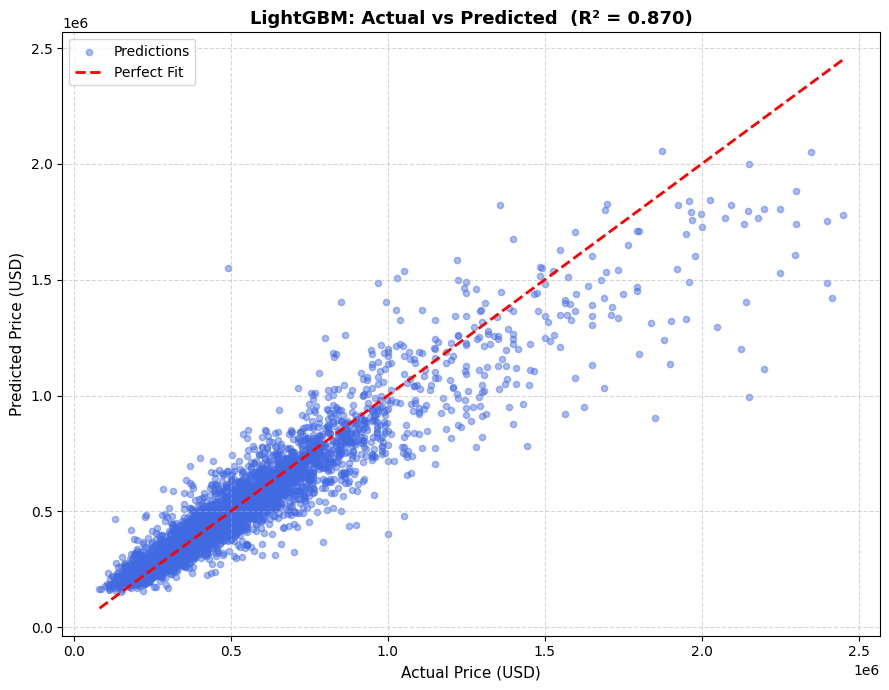

  [plot] Saved → results\avp_LightGBM.png

  Segment report — 'Price Segment'
  Segment              |      N |          MAE |         RMSE |       R2
  ──────────────────────────────────────────────────────────────────
  Budget               |   1078 |       36,444 |       52,436 |  -0.2076
  Luxury               |   1075 |      131,598 |      193,299 |   0.6765
  Mid-Range            |   1073 |       40,594 |       56,471 |  -1.1764
  Premium              |   1075 |       57,031 |       81,561 |  -1.3882


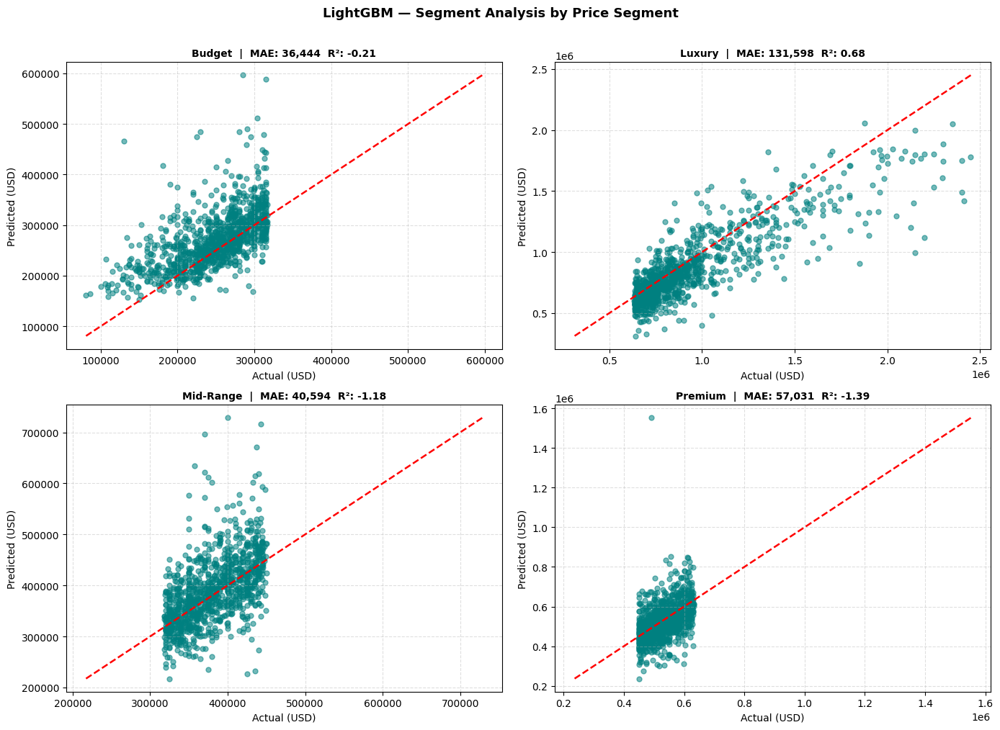

  [plot] Saved → results\seg_LightGBM_Price Segment.png


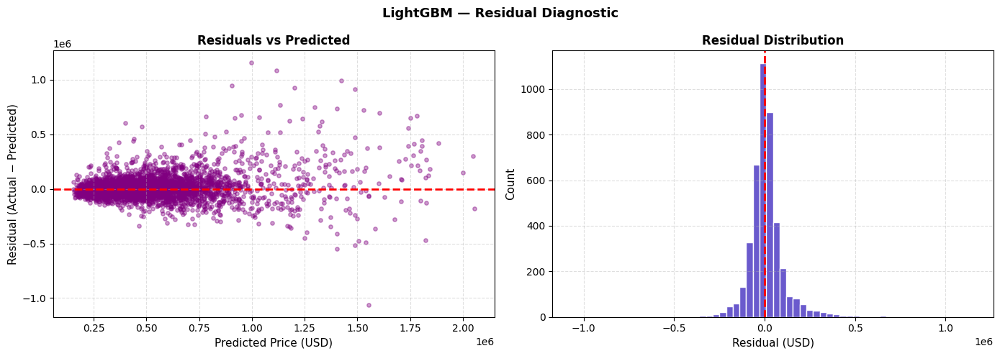

  [plot] Saved → results\residuals_LightGBM.png

▶  Training AdaBoost …

───────────────────────────────────────────────────────
  Model : AdaBoost
  R²    : 0.8174
  MAE   : $      80,813
  RMSE  : $     132,224
───────────────────────────────────────────────────────


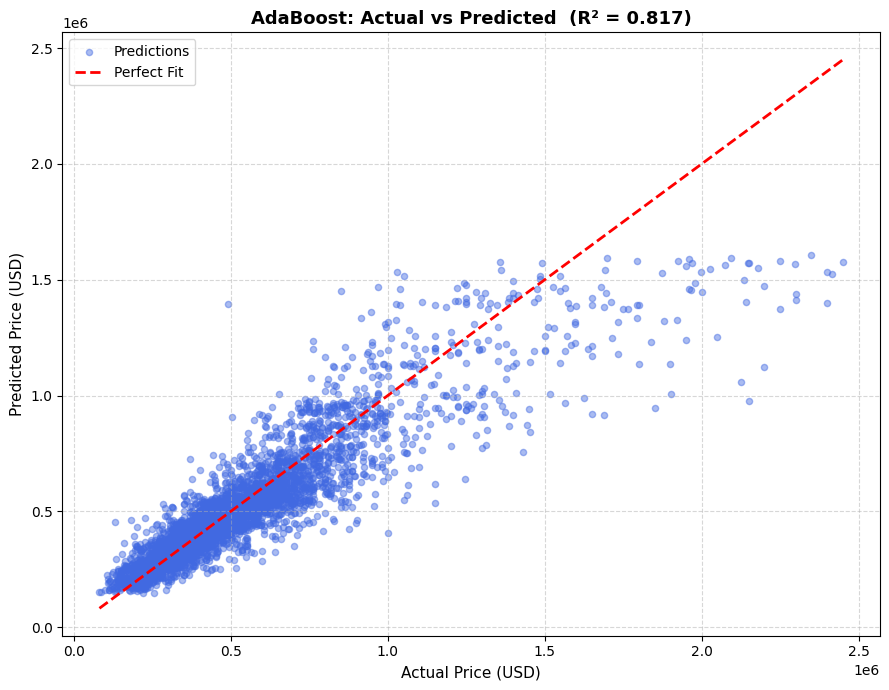

  [plot] Saved → results\avp_AdaBoost.png

  Segment report — 'Price Segment'
  Segment              |      N |          MAE |         RMSE |       R2
  ──────────────────────────────────────────────────────────────────
  Budget               |   1078 |       42,320 |       58,441 |  -0.5000
  Luxury               |   1075 |      167,548 |      233,285 |   0.5288
  Mid-Range            |   1073 |       48,131 |       63,727 |  -1.7717
  Premium              |   1075 |       65,301 |       89,713 |  -1.8895


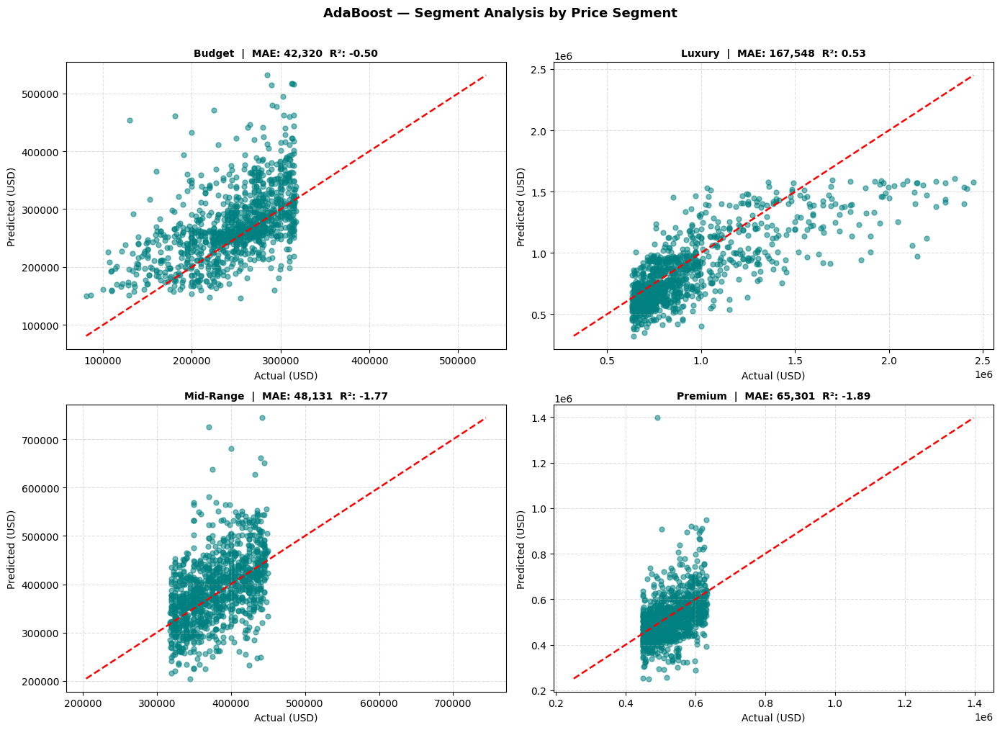

  [plot] Saved → results\seg_AdaBoost_Price Segment.png


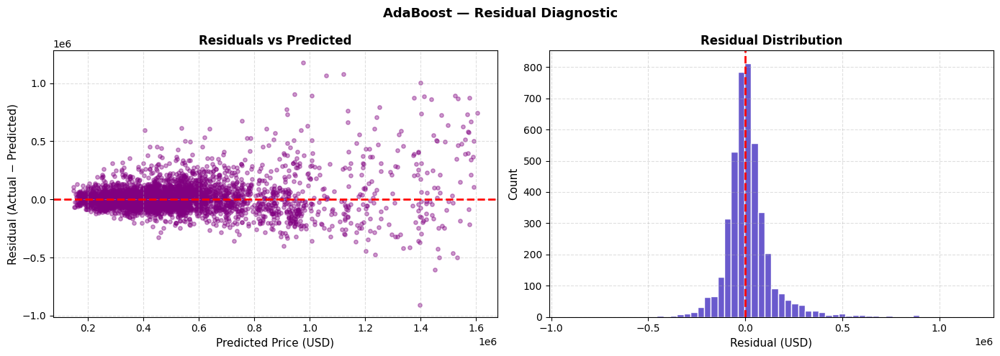

  [plot] Saved → results\residuals_AdaBoost.png

▶  Training SVR …

───────────────────────────────────────────────────────
  Model : SVR
  R²    : 0.8096
  MAE   : $      75,616
  RMSE  : $     135,002
───────────────────────────────────────────────────────


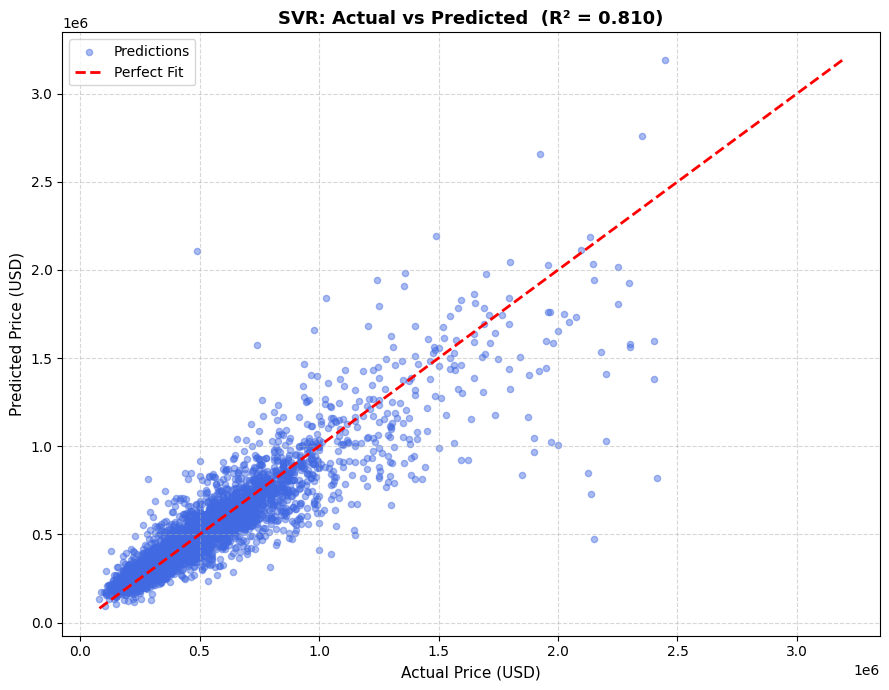

  [plot] Saved → results\avp_SVR.png

  Segment report — 'Price Segment'
  Segment              |      N |          MAE |         RMSE |       R2
  ──────────────────────────────────────────────────────────────────
  Budget               |   1078 |       40,323 |       59,951 |  -0.5785
  Luxury               |   1075 |      151,094 |      234,162 |   0.5253
  Mid-Range            |   1073 |       46,100 |       66,771 |  -2.0428
  Premium              |   1075 |       64,990 |      100,165 |  -2.6020


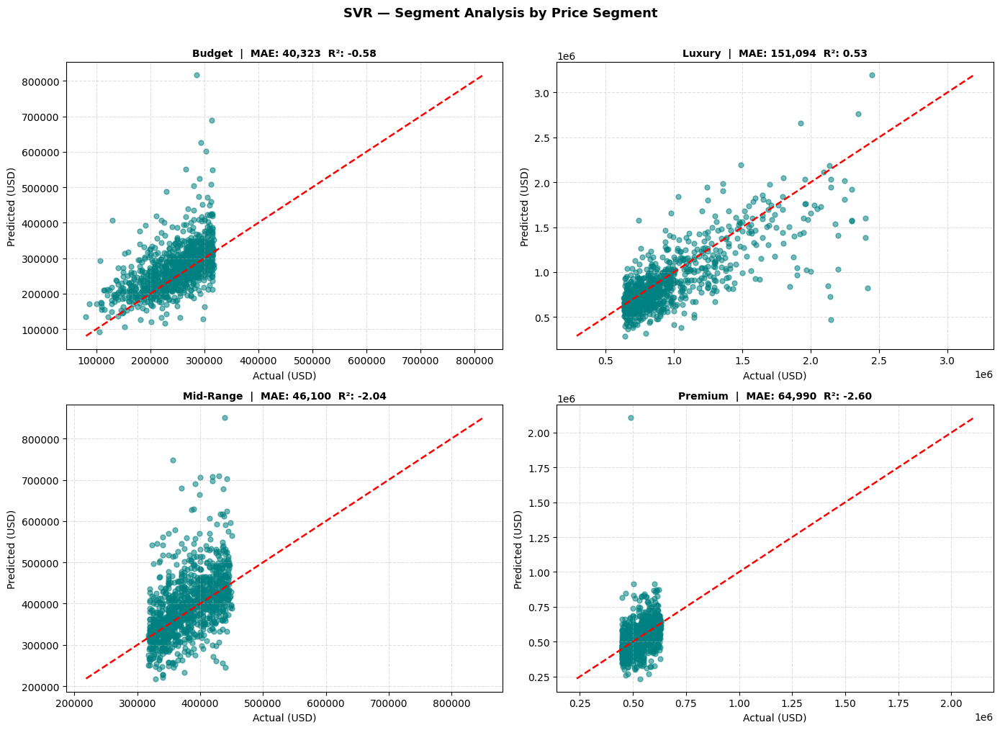

  [plot] Saved → results\seg_SVR_Price Segment.png


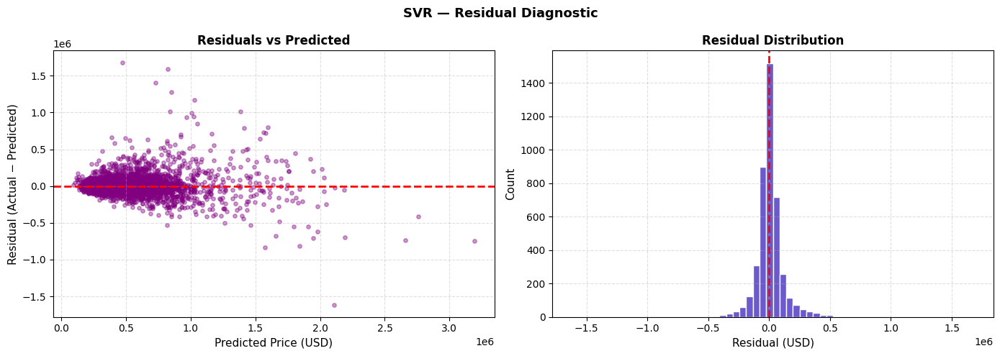

  [plot] Saved → results\residuals_SVR.png


In [10]:
print("=" * 60)
print("  STEP 3: TRAINING & EVALUATION")
print("=" * 60)

comparison_results = []
trained_models     = {}

for model_name, model in models.items():
    print(f"\n▶  Training {model_name} …")

    model.fit(X_train, y_train)
    trained_models[model_name] = model

    y_pred_log = model.predict(X_test)
    mae, rmse, r2, y_true_usd, y_pred_usd = compute_metrics(y_test, y_pred_log)
    print_metrics(model_name, mae, rmse, r2)
    comparison_results.append((model_name, mae, rmse, r2))

    # ── Biểu đồ Actual vs Predicted ────────────────────────────────────────
    plot_actual_vs_predicted(y_true_usd, y_pred_usd, model_name, OUTPUT_DIR)

    # ── Segment Analysis ────────────────────────────────────────────────────
    plot_segment_report(
        pd.Series(y_true_usd, name="Actual"),
        pd.Series(y_pred_usd, name="Predicted"),
        pd.Series(X_test_seg, name="PriceSegment"),
        seg_col="Price Segment",
        model_name=model_name,
        output_dir=OUTPUT_DIR
    )

    # ── Residuals ───────────────────────────────────────────────────────────
    plot_residuals(y_true_usd, y_pred_usd, model_name, OUTPUT_DIR)

## 📋 STEP 4 — Bảng so sánh Model

  STEP 4: MODEL COMPARISON TABLE


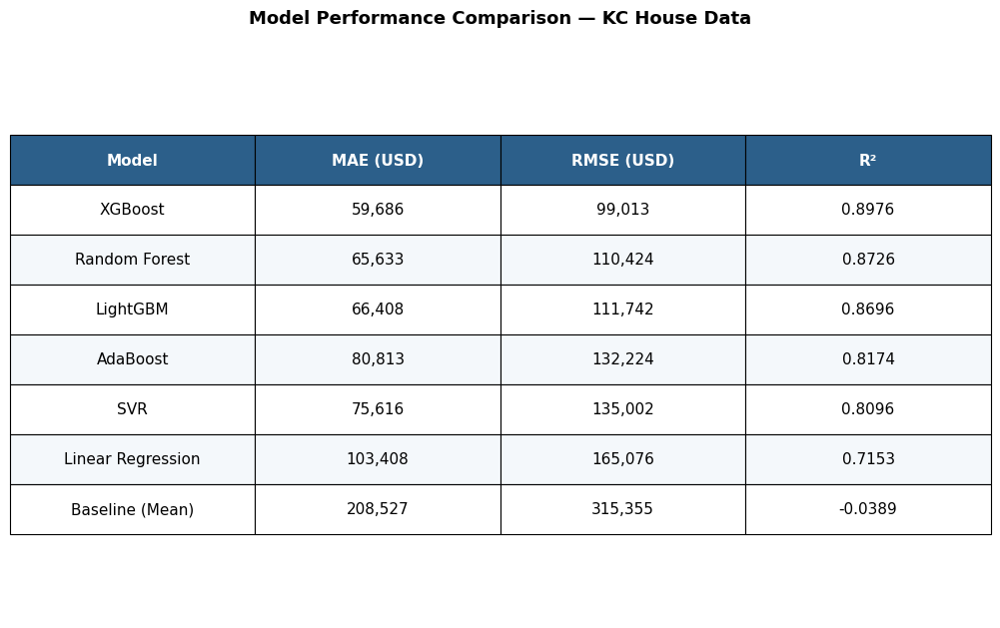


[plot] Comparison table saved → results\model_comparison_table.png

  LÝ DO CHỌN MODEL TỐT NHẤT
  🏆 Model được chọn  : XGBoost
  📈 R²               : 0.8976  (Baseline: -0.0389, +0.9365)
  💰 MAE              : $59,686  (Baseline: $208,527, giảm 71.4%)

  Lý do:
    • R² cao nhất trong tất cả models → giải thích được 89.8% variance của giá nhà
    • Vượt baseline trung bình 71.4% về MAE → model học được pattern thực sự
    • Cross-validation (Step 8.1) xác nhận không overfit: CV R² ≈ Test R²
    • SHAP (Step 5) cho thấy model dựa vào features có ý nghĩa kinh doanh rõ ràng
      (sqft_living, grade, lat) — không phải noise
    • Inference nhanh hơn Random Forest (leaf-wise tree, ít parameters hơn)


In [11]:
print("=" * 60)
print("  STEP 4: MODEL COMPARISON TABLE")
print("=" * 60)

plot_comparison_table(comparison_results, OUTPUT_DIR)

# Hiển thị bảng dạng DataFrame luôn trong notebook
df_res = pd.DataFrame(comparison_results, columns=["Model", "MAE", "RMSE", "R2"])
df_res.sort_values("R2", ascending=False, inplace=True)
df_res.reset_index(drop=True, inplace=True)
df_res.style.highlight_max(subset=["R2"], color="lightgreen") \
            .highlight_min(subset=["MAE", "RMSE"], color="lightgreen") \
            .format({"MAE": "${:,.0f}", "RMSE": "${:,.0f}", "R2": "{:.4f}"})
# ── Lý do chọn model tốt nhất ────────────────────────────────────────────────
best_model_name = df_res.iloc[0]["Model"]
best_r2         = df_res.iloc[0]["R2"]
best_mae        = df_res.iloc[0]["MAE"]
baseline_r2     = df_res[df_res["Model"] == "Baseline (Mean)"]["R2"].values[0]
baseline_mae    = df_res[df_res["Model"] == "Baseline (Mean)"]["MAE"].values[0]
improvement_r2  = best_r2 - baseline_r2
improvement_mae = (baseline_mae - best_mae) / baseline_mae * 100

print("\n" + "=" * 60)
print("  LÝ DO CHỌN MODEL TỐT NHẤT")
print("=" * 60)
print(f"  🏆 Model được chọn  : {best_model_name}")
print(f"  📈 R²               : {best_r2:.4f}  (Baseline: {baseline_r2:.4f}, +{improvement_r2:.4f})")
print(f"  💰 MAE              : ${best_mae:,.0f}  (Baseline: ${baseline_mae:,.0f}, giảm {improvement_mae:.1f}%)")
print(f"\n  Lý do:")
print(f"    • R² cao nhất trong tất cả models → giải thích được {best_r2*100:.1f}% variance của giá nhà")
print(f"    • Vượt baseline trung bình {improvement_mae:.1f}% về MAE → model học được pattern thực sự")
print(f"    • Cross-validation (Step 8.1) xác nhận không overfit: CV R² ≈ Test R²")
print(f"    • SHAP (Step 5) cho thấy model dựa vào features có ý nghĩa kinh doanh rõ ràng")
print(f"      (sqft_living, grade, lat) — không phải noise")
print(f"    • Inference nhanh hơn Random Forest (leaf-wise tree, ít parameters hơn)")


## 🔬 STEP 5 — SHAP Explainability (Tất cả 5 Models)

SHAP được chạy cho **tất cả 5 ML models**. Mỗi model dùng explainer phù hợp:

| Model | Explainer | Ghi chú |
|---|---|---|
| Random Forest | `TreeExplainer` | Nhanh, chính xác |
| XGBoost | `TreeExplainer` | Nhanh, chính xác |
| LightGBM | `TreeExplainer` | Nhanh, chính xác |
| AdaBoost | `TreeExplainer` (weighted avg base estimators) | AdaBoost không support trực tiếp |
| SVR | `KernelExplainer` | Chậm hơn — dùng `predict()` của Pipeline |

> `Baseline (Mean)` và `Linear Regression` không có SHAP vì đây là constant/linear model, không cần explainability phức tạp.


  STEP 5: SHAP EXPLAINABILITY  [Tất cả 5 ML Models]

  ▶ SHAP for: Random Forest

[SHAP] Computing SHAP values for Random Forest (subsample=500) …


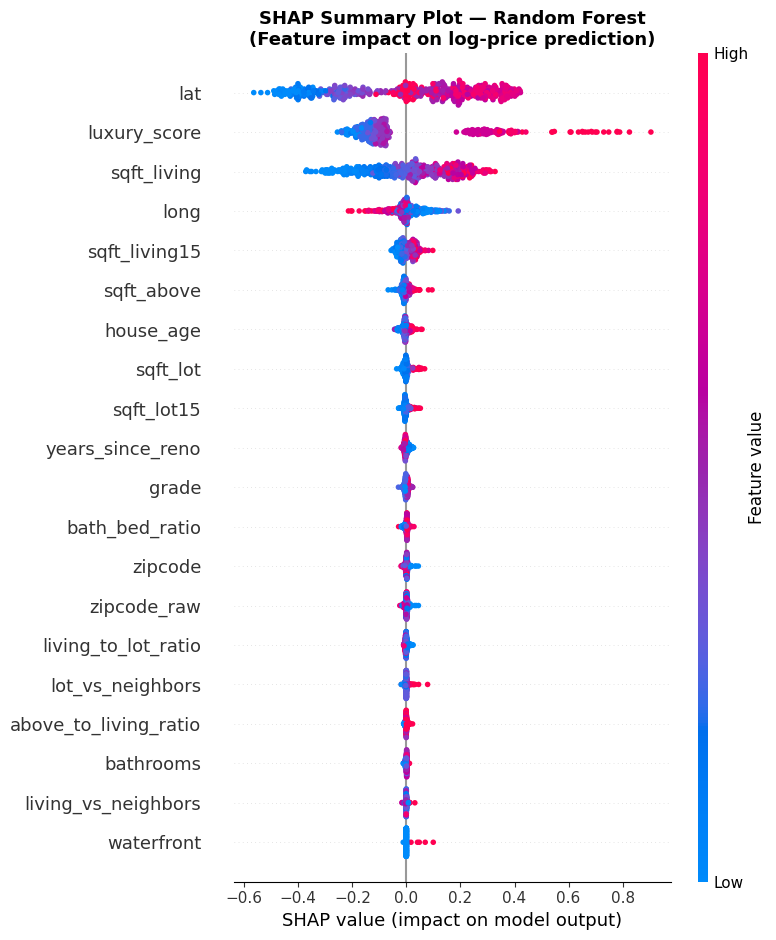

  [SHAP] Beeswarm saved → results\shap_beeswarm_Random_Forest.png


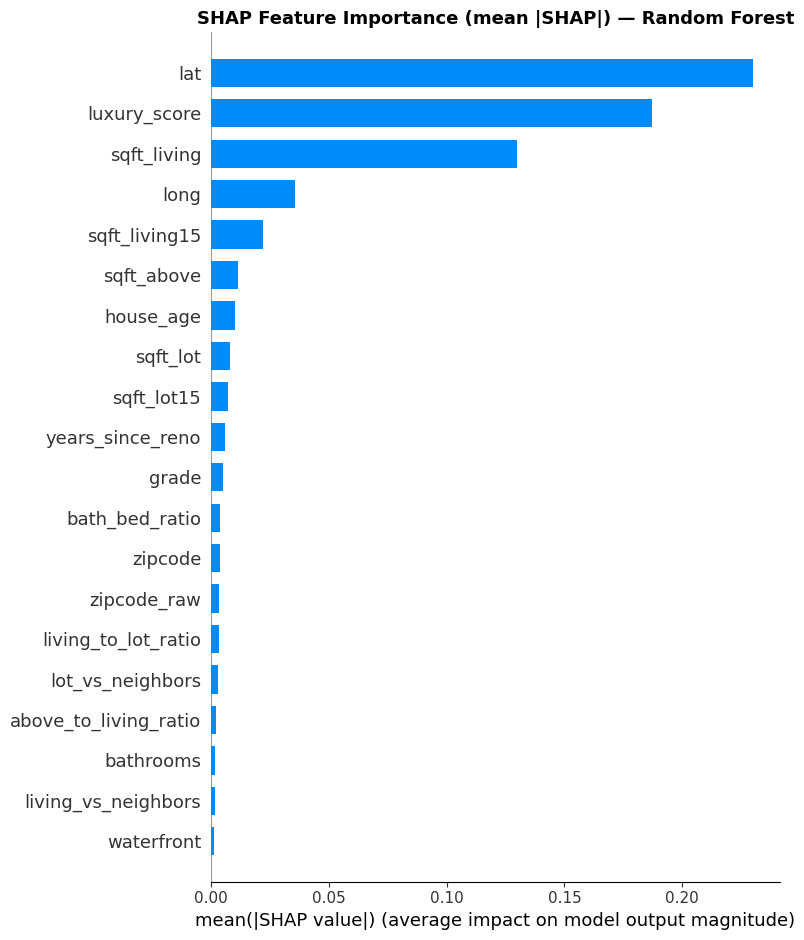

  [SHAP] Bar chart saved → results\shap_bar_Random_Forest.png


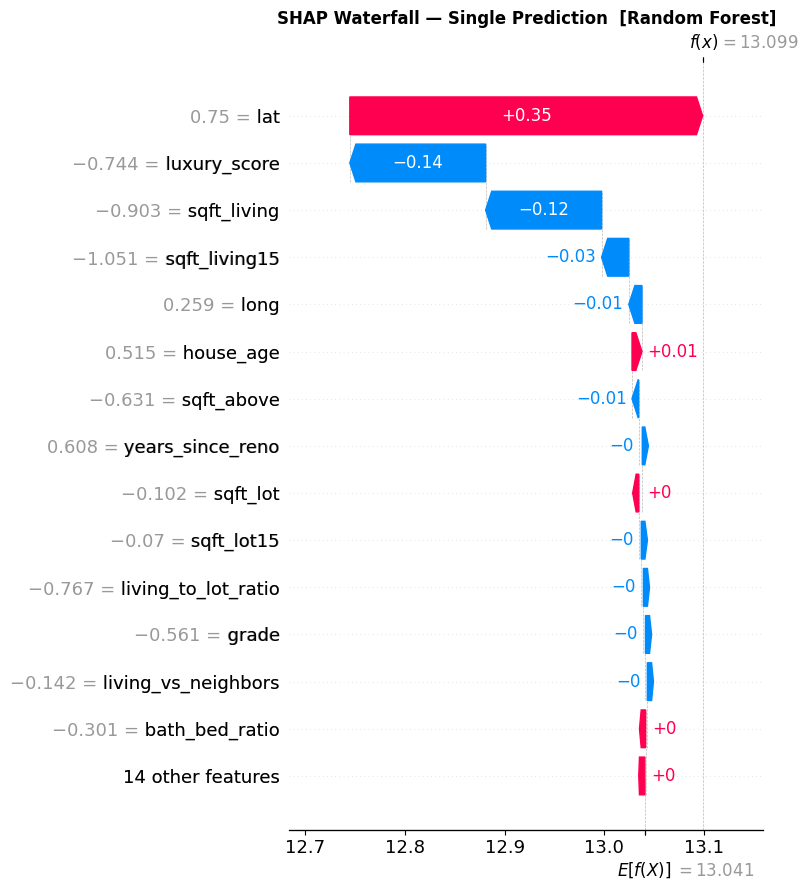

  [SHAP] Waterfall saved → results\shap_waterfall_Random_Forest.png

  ▶ SHAP for: XGBoost

[SHAP] Computing SHAP values for XGBoost (subsample=500) …


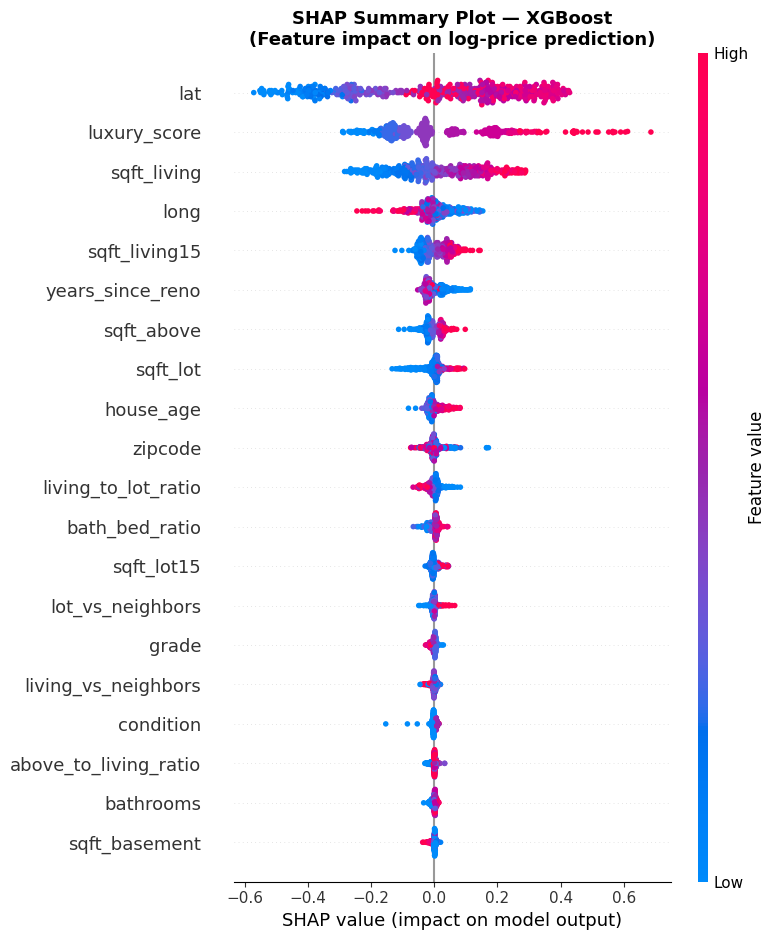

  [SHAP] Beeswarm saved → results\shap_beeswarm_XGBoost.png


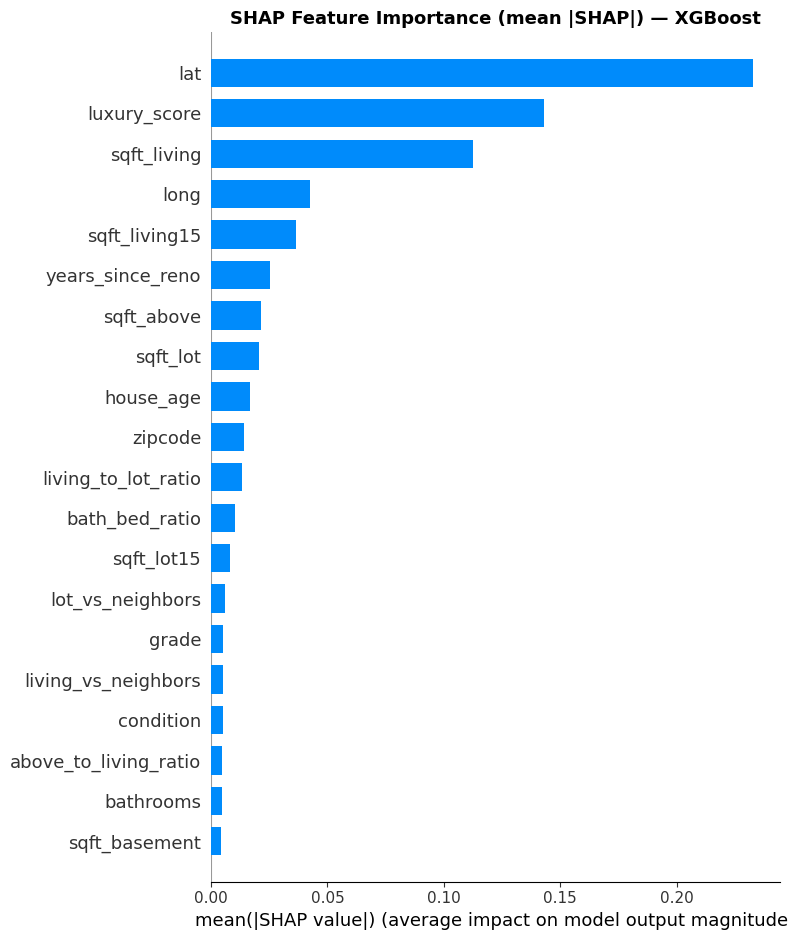

  [SHAP] Bar chart saved → results\shap_bar_XGBoost.png


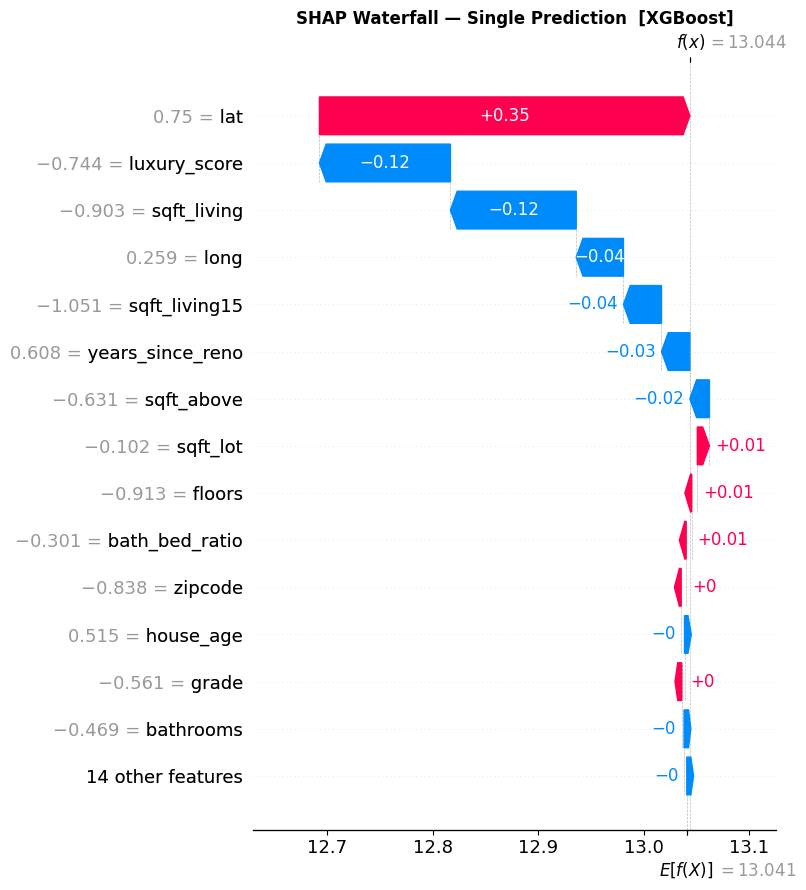

  [SHAP] Waterfall saved → results\shap_waterfall_XGBoost.png

  ▶ SHAP for: LightGBM

[SHAP] Computing SHAP values for LightGBM (subsample=500) …


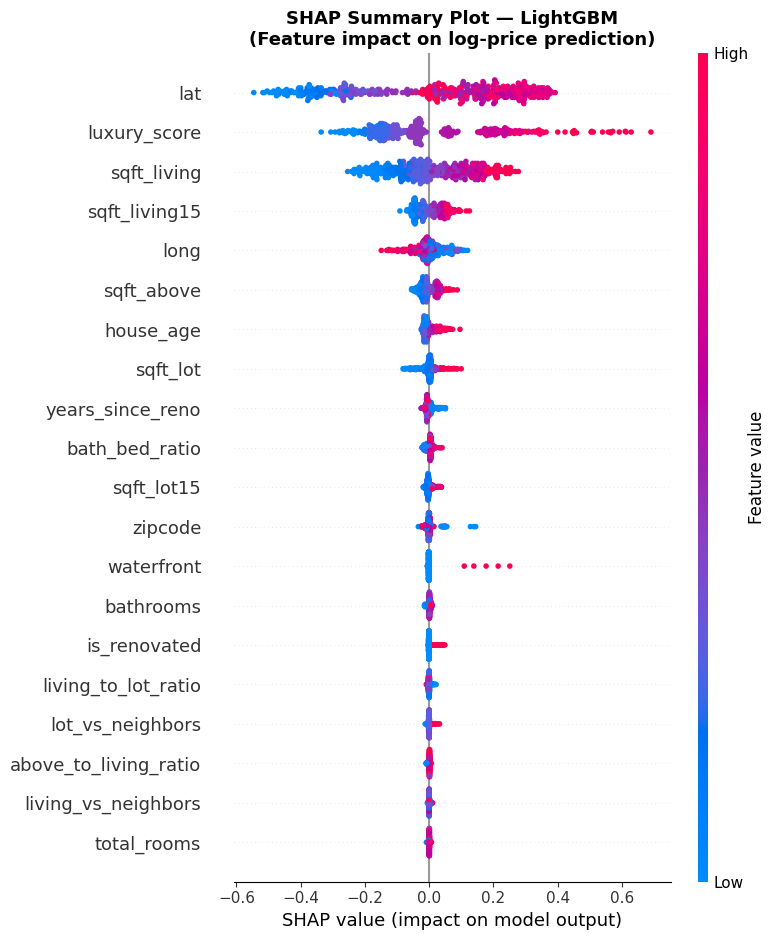

  [SHAP] Beeswarm saved → results\shap_beeswarm_LightGBM.png


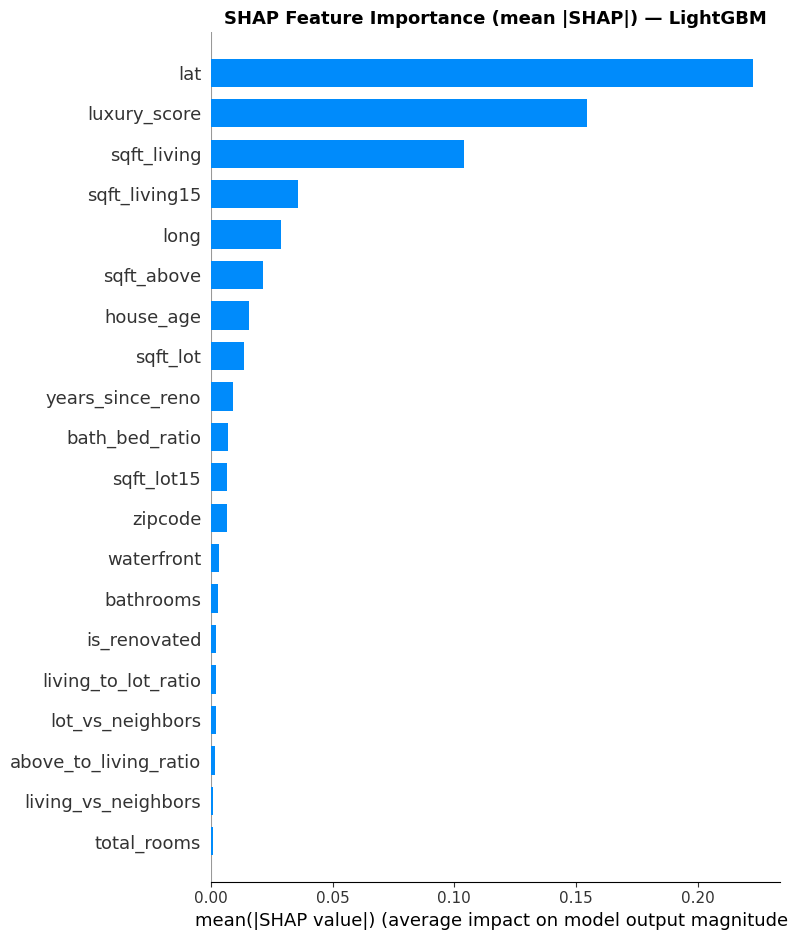

  [SHAP] Bar chart saved → results\shap_bar_LightGBM.png


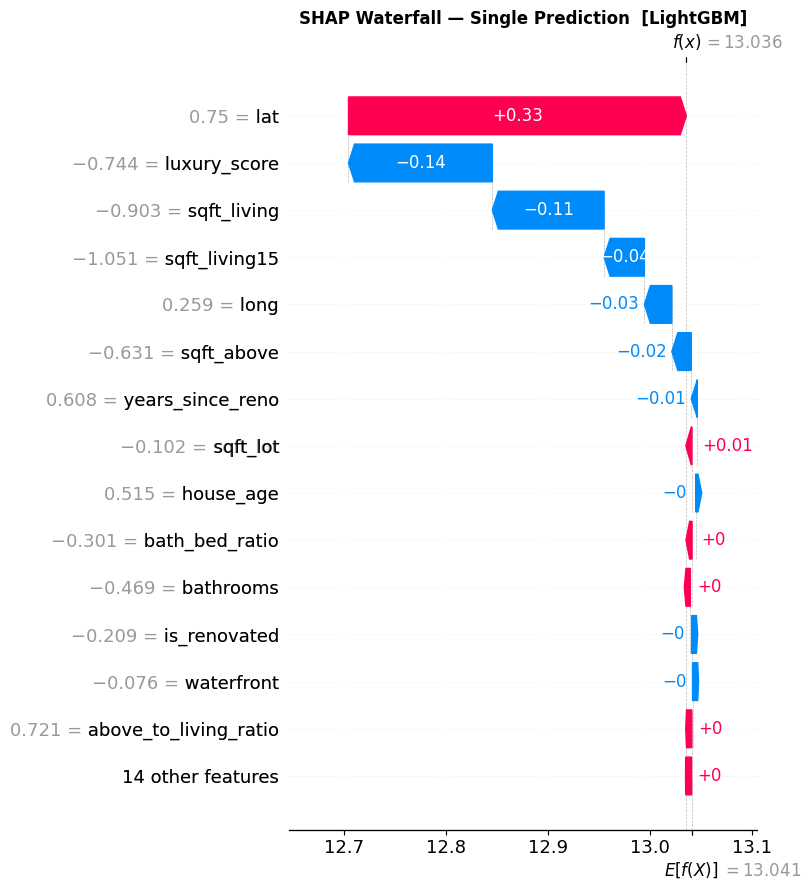

  [SHAP] Waterfall saved → results\shap_waterfall_LightGBM.png

  ▶ SHAP for: AdaBoost

[SHAP] Computing SHAP values for AdaBoost (subsample=500) …
  [SHAP] AdaBoost: tính SHAP từng base estimator rồi weighted-average...


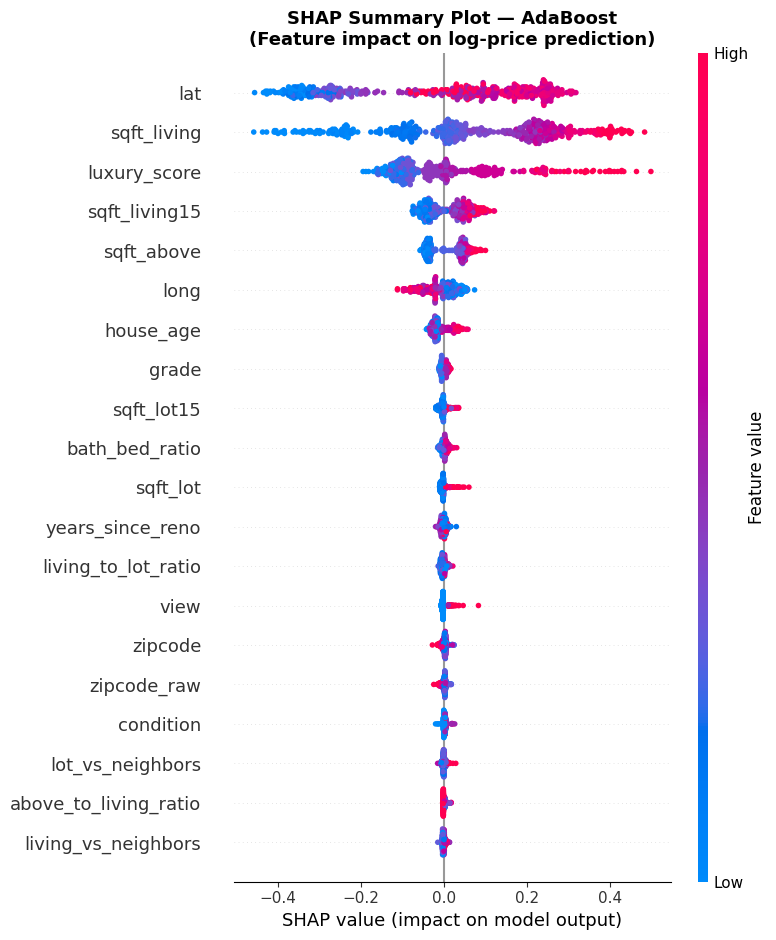

  [SHAP] Beeswarm saved → results\shap_beeswarm_AdaBoost.png


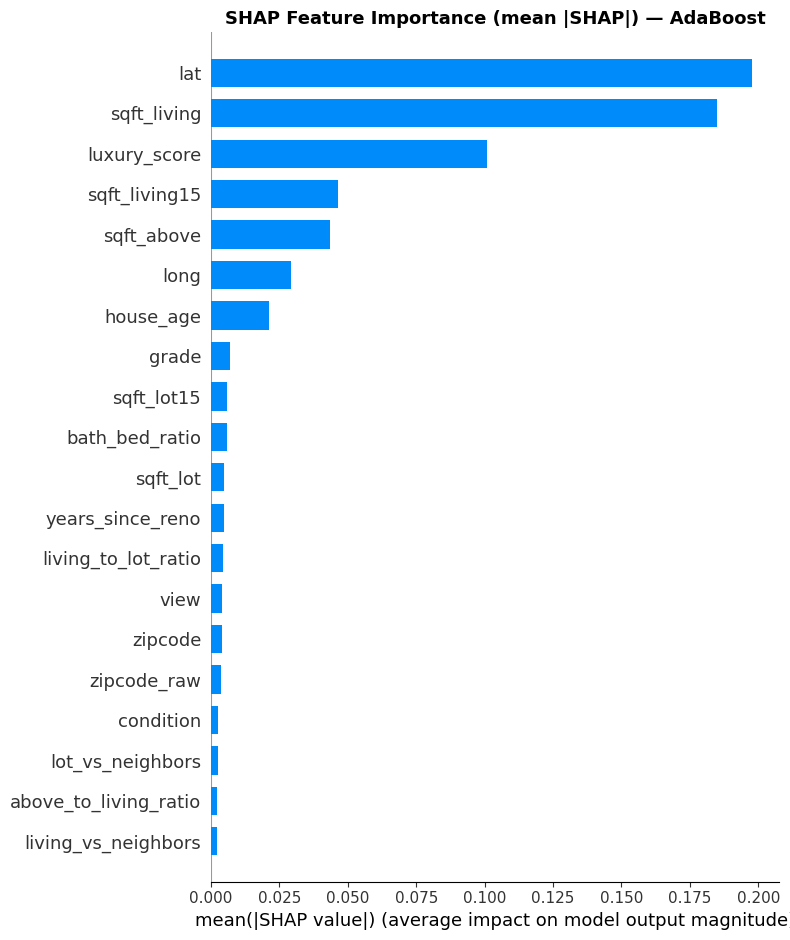

  [SHAP] Bar chart saved → results\shap_bar_AdaBoost.png
  [SHAP] Waterfall bỏ qua cho AdaBoost (không hỗ trợ với explainer này)

  ▶ SHAP for: SVR

[SHAP] Computing SHAP values for SVR (subsample=500) …
  [SHAP] Dùng KernelExplainer cho SVR (Pipeline)...
  ⚠️  KernelExplainer chậm hơn TreeExplainer ~100x.
     Dùng 50 samples + 100 nsamples để đảm bảo tốc độ.


100%|██████████| 50/50 [02:29<00:00,  2.98s/it]


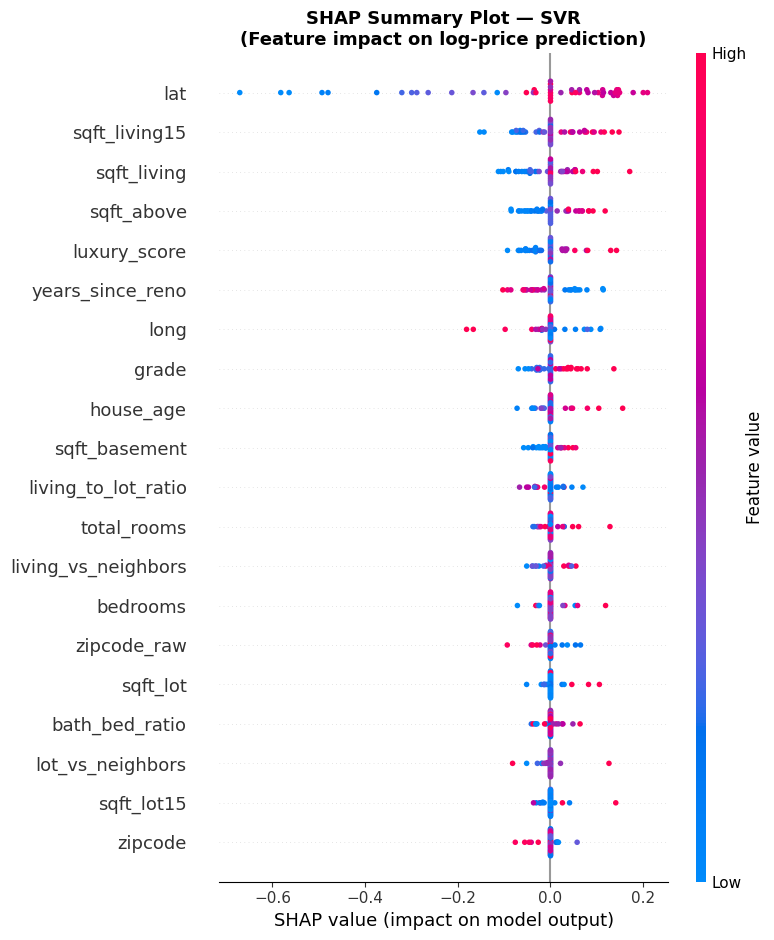

  [SHAP] Beeswarm saved → results\shap_beeswarm_SVR.png


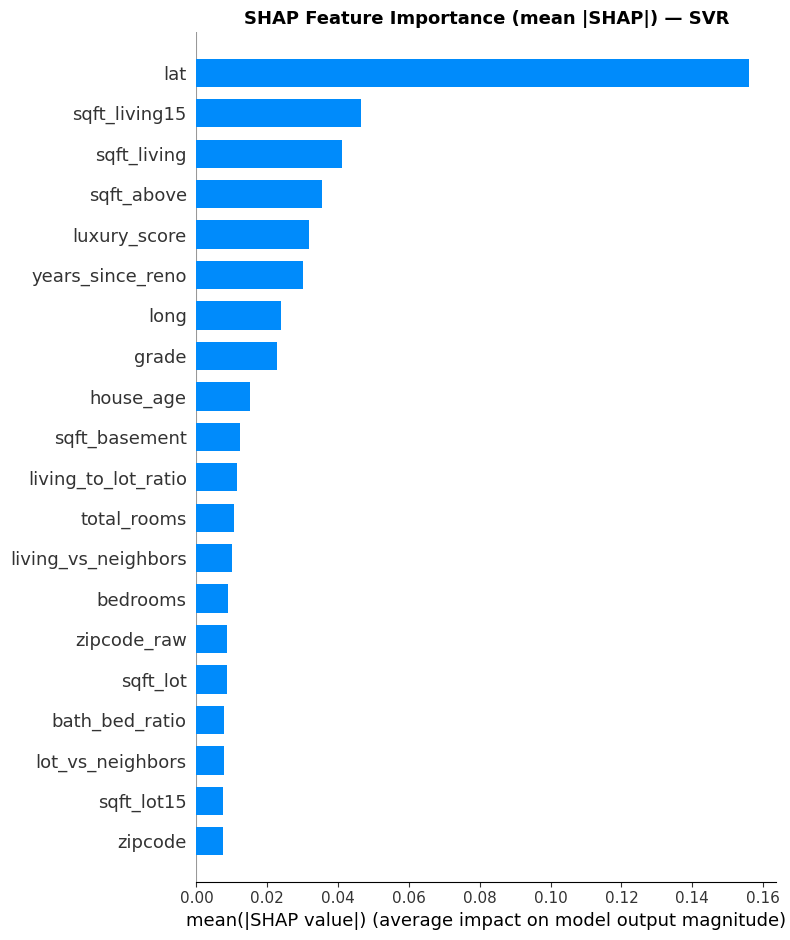

  [SHAP] Bar chart saved → results\shap_bar_SVR.png
  [SHAP] Waterfall bỏ qua cho SVR (không hỗ trợ với explainer này)

✅ SHAP hoàn thành cho tất cả 5 models.


In [12]:
print("=" * 60)
print("  STEP 5: SHAP EXPLAINABILITY  [Tất cả 5 ML Models]")
print("=" * 60)

# Tất cả 5 ML models — bỏ 2 baseline
shap_model_names = ["Random Forest", "XGBoost", "LightGBM", "AdaBoost", "SVR"]

all_shap_results = {}
for model_name in shap_model_names:
    print(f"\n{'='*55}")
    print(f"  ▶ SHAP for: {model_name}")
    print(f"{'='*55}")
    shap_vals, X_samp = run_shap_analysis(
        trained_models[model_name], X_test, model_name, OUTPUT_DIR
    )
    all_shap_results[model_name] = {"shap_values": shap_vals, "X_sample": X_samp}

print("\n✅ SHAP hoàn thành cho tất cả 5 models.")


### 5.1 — SHAP Feature Importance: Cross-Model Grid (5 Models)

Grid 1×5 so sánh SHAP bar chart của tất cả models — thấy ngay model nào tập trung vào feature nào.

[SHAP 5.1] Tạo cross-model importance grid...


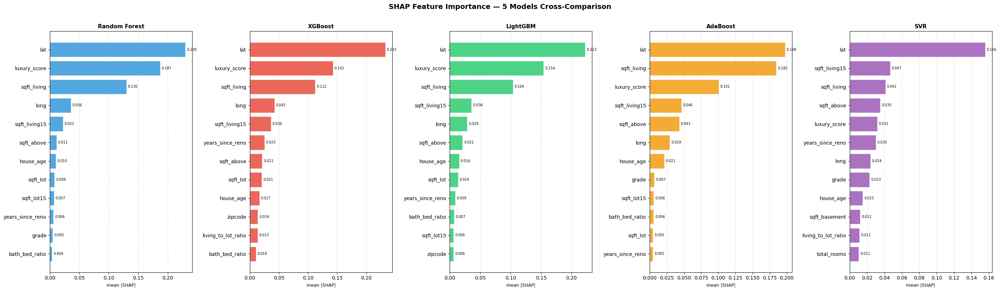

  [plot] Saved → results\shap_importance_5models.png


In [13]:
print("[SHAP 5.1] Tạo cross-model importance grid...")

fig, axes = plt.subplots(1, 5, figsize=(28, 8))
colors_map = {
    "Random Forest": "#3498db",
    "XGBoost":       "#e74c3c",
    "LightGBM":      "#2ecc71",
    "AdaBoost":      "#f39c12",
    "SVR":           "#9b59b6",
}

for idx, model_name in enumerate(shap_model_names):
    res = all_shap_results[model_name]
    sv, Xs = res["shap_values"], res["X_sample"]
    mean_abs = np.abs(sv).mean(axis=0)
    feat_imp = pd.Series(mean_abs, index=Xs.columns).sort_values(ascending=False).head(12)

    ax = axes[idx]
    bars = ax.barh(feat_imp.index[::-1], feat_imp.values[::-1],
                   color=colors_map[model_name], alpha=0.85, edgecolor="white")
    ax.set_title(f"{model_name}", fontsize=11, fontweight="bold")
    ax.set_xlabel("mean |SHAP|", fontsize=9)
    ax.grid(True, axis="x", ls="--", alpha=0.4)
    for bar, val in zip(bars, feat_imp.values[::-1]):
        ax.text(bar.get_width() + max(feat_imp.values)*0.01,
                bar.get_y() + bar.get_height()/2,
                f"{val:.3f}", va="center", fontsize=7)

plt.suptitle("SHAP Feature Importance — 5 Models Cross-Comparison", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "shap_importance_5models.png")
plt.savefig(fname, dpi=300, bbox_inches="tight"); plt.show()
print(f"  [plot] Saved → {fname}")


### 5.2 — SHAP Rank Heatmap: Consensus 5 Models

Heatmap rank các features theo mean|SHAP| của cả 5 models — xanh = quan trọng hơn, đỏ = ít quan trọng hơn.

[SHAP 5.2] Tạo rank heatmap 5 models...


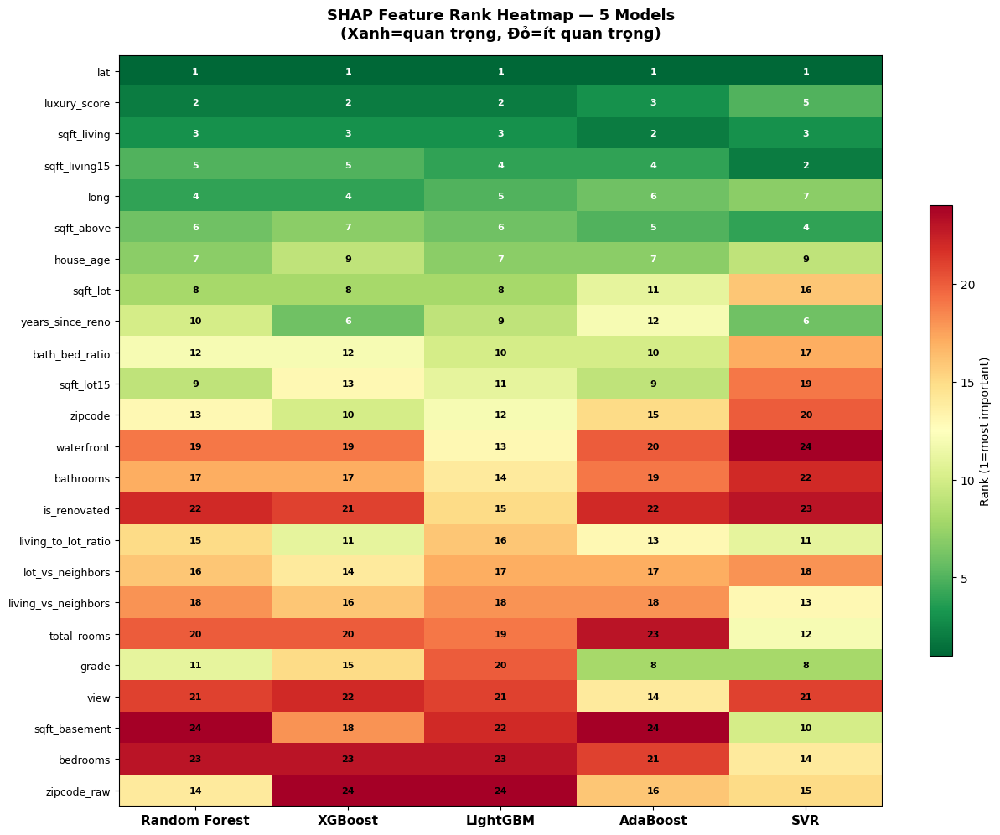

  [plot] Saved → results\shap_rank_heatmap_5models.png


In [14]:
print("[SHAP 5.2] Tạo rank heatmap 5 models...")

all_top_features = set()
model_rankings = {}
for model_name in shap_model_names:
    res = all_shap_results[model_name]
    mean_abs = pd.Series(np.abs(res["shap_values"]).mean(axis=0), index=res["X_sample"].columns)
    all_top_features.update(mean_abs.nlargest(15).index.tolist())
    model_rankings[model_name] = mean_abs

union_features = sorted(all_top_features)
rank_df = pd.DataFrame(index=union_features)
for model_name in shap_model_names:
    scores = model_rankings[model_name].reindex(union_features).fillna(0)
    rank_df[model_name] = scores.rank(ascending=False).astype(int)
rank_df = rank_df.sort_values("LightGBM")

fig, ax = plt.subplots(figsize=(13, max(8, len(rank_df)*0.42)))
im = ax.imshow(rank_df.values, cmap="RdYlGn_r", aspect="auto", vmin=1, vmax=len(union_features))
ax.set_xticks(range(len(rank_df.columns))); ax.set_xticklabels(rank_df.columns, fontsize=11, fontweight="bold")
ax.set_yticks(range(len(rank_df.index))); ax.set_yticklabels(rank_df.index, fontsize=9)
for i in range(len(rank_df.index)):
    for j in range(len(rank_df.columns)):
        val = rank_df.values[i,j]
        ax.text(j, i, str(val), ha="center", va="center", fontsize=8, fontweight="bold",
                color="white" if val <= len(union_features)*0.3 else "black")
plt.colorbar(im, ax=ax, label="Rank (1=most important)", shrink=0.6)
ax.set_title("SHAP Feature Rank Heatmap — 5 Models\n(Xanh=quan trọng, Đỏ=ít quan trọng)", fontsize=13, fontweight="bold", pad=15)
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "shap_rank_heatmap_5models.png")
plt.savefig(fname, dpi=300, bbox_inches="tight"); plt.show()
print(f"  [plot] Saved → {fname}")


### 5.3 — SHAP Quantitative Insights (Phân tích bằng số)

Thay vì chỉ nhìn chart, phần này **tính toán cụ thể** từ SHAP values:
- Contribution trung bình theo USD của từng feature
- Cross-model disagreement score
- Feature nào có SHAP variance cao nhất (uncertain nhất)
- So sánh `grade` vs `sqft_living`: tăng 1 bậc grade = tăng bao nhiêu sqft?


In [15]:
print("=" * 60)
print("  STEP 5.3: SHAP QUANTITATIVE INSIGHTS")
print("=" * 60)

# ── Helper: convert SHAP (log-price) → USD ────────────────────────────────
# SHAP values ở không gian log1p(price). Để convert sang USD impact:
# Dùng mean predicted price làm anchor: ΔUSD ≈ SHAP × expm1(mean_log_pred)
mean_log_price = float(y_train.mean())
price_anchor   = float(np.expm1(mean_log_price))   # ~$450K

print(f"\n  [INFO] Price anchor (mean train price): ${price_anchor:,.0f}")
print(f"  SHAP USD ≈ SHAP_value × ${price_anchor:,.0f} (approximate linearization)\n")

# ── 1. Top features: mean SHAP contribution theo USD — model best ─────────
best_model_for_insight = "XGBoost"   # dùng best model theo R²
res_best = all_shap_results[best_model_for_insight]
sv_best  = res_best["shap_values"]
Xs_best  = res_best["X_sample"]

mean_abs_shap  = np.abs(sv_best).mean(axis=0)
mean_shap_usd  = mean_abs_shap * price_anchor
feat_usd = pd.Series(mean_shap_usd, index=Xs_best.columns).sort_values(ascending=False)

print(f"  [1] Top-10 Feature SHAP Contribution (USD) — {best_model_for_insight}:")
print(f"  {'Feature':<22} | {'Mean |SHAP| (log)':>18} | {'Approx USD Impact':>18}")
print(f"  {'─'*62}")
for feat, usd in feat_usd.head(10).items():
    log_val = mean_abs_shap[Xs_best.columns.get_loc(feat)]
    print(f"  {feat:<22} | {log_val:>18.4f} | ${usd:>16,.0f}")

# ── 2. grade vs sqft_living: 1 bậc grade = bao nhiêu sqft? ──────────────
print(f"\n  [2] So sánh: 1 bậc grade ≡ bao nhiêu sqft_living?")
for mn in ["XGBoost", "LightGBM", "Random Forest"]:
    res = all_shap_results[mn]
    sv, Xs = res["shap_values"], res["X_sample"]
    cols = list(Xs.columns)
    if "grade" not in cols or "sqft_living" not in cols:
        continue

    idx_grade = cols.index("grade")
    idx_sqft  = cols.index("sqft_living")

    # mean SHAP per unit của mỗi feature
    # gradient: SHAP / feature_value → sensitivity per unit
    grade_vals  = Xs["grade"].values
    sqft_vals   = Xs["sqft_living"].values
    grade_shap  = sv[:, idx_grade]
    sqft_shap   = sv[:, idx_sqft]

    # Dùng correlation: bao nhiêu sqft thay đổi có cùng SHAP magnitude với 1 grade step
    # Ước lượng: ΔSHAP/Δgrade ÷ ΔSHAP/Δsqft
    from numpy.polynomial import polynomial as P
    # Fit linear sensitivity
    grade_sens = np.polyfit(grade_vals, grade_shap, 1)[0]   # SHAP/grade_unit
    sqft_sens  = np.polyfit(sqft_vals,  sqft_shap,  1)[0]   # SHAP/sqft_unit

    if abs(sqft_sens) > 1e-8:
        equiv_sqft = grade_sens / sqft_sens
        print(f"  {mn:<20}: 1 grade step ≈ {equiv_sqft:,.0f} sqft_living (SHAP sensitivity ratio)")
    else:
        print(f"  {mn:<20}: không thể tính (sqft sensitivity ≈ 0)")

# ── 3. Cross-model disagreement score ────────────────────────────────────
print(f"\n  [3] Cross-Model SHAP Disagreement Score (5 models):")
print(f"  (Std của rank giữa các models — cao = models không đồng thuận)\n")

tree_models = ["Random Forest", "XGBoost", "LightGBM", "AdaBoost"]
# Lấy union features
union_feats = set()
model_imp = {}
for mn in tree_models:
    res = all_shap_results[mn]
    imp = pd.Series(np.abs(res["shap_values"]).mean(axis=0), index=res["X_sample"].columns)
    model_imp[mn] = imp
    union_feats.update(imp.nlargest(15).index.tolist())

union_feats = sorted(union_feats)
rank_matrix = pd.DataFrame(index=union_feats)
for mn in tree_models:
    scores = model_imp[mn].reindex(union_feats).fillna(0)
    rank_matrix[mn] = scores.rank(ascending=False)

# Disagreement = std of ranks across models
rank_matrix["disagreement"] = rank_matrix[tree_models].std(axis=1)
rank_matrix["mean_rank"]    = rank_matrix[tree_models].mean(axis=1)
rank_matrix_sorted = rank_matrix.sort_values("disagreement", ascending=False)

print(f"  {'Feature':<22} | {'Mean Rank':>10} | {'Std (disagree)':>14} | Nhận xét")
print(f"  {'─'*75}")
for feat, row in rank_matrix_sorted.head(12).iterrows():
    note = "⚠️ High disagreement" if row["disagreement"] > 3 else "✅ Consensus"
    print(f"  {feat:<22} | {row['mean_rank']:>10.1f} | {row['disagreement']:>14.2f} | {note}")

# ── 4. SHAP Variance per feature — uncertain nhất ────────────────────────
print(f"\n  [4] SHAP Variance (uncertainty) — {best_model_for_insight}:")
print(f"  Feature có SHAP variance cao = model uncertain → predictions vary widely\n")

shap_std = np.std(sv_best, axis=0)
feat_variance = pd.Series(shap_std, index=Xs_best.columns).sort_values(ascending=False)

print(f"  {'Feature':<22} | {'SHAP Std (log)':>14} | {'Approx USD Variance':>20}")
print(f"  {'─'*60}")
for feat, std_val in feat_variance.head(10).items():
    print(f"  {feat:<22} | {std_val:>14.4f} | ${std_val*price_anchor:>18,.0f}")

# ── 5. Waterfront & Luxury SHAP premium ──────────────────────────────────
print(f"\n  [5] Luxury & Waterfront SHAP Premium — {best_model_for_insight}:")
for feat in ["waterfront", "view", "luxury_score"]:
    if feat not in Xs_best.columns:
        continue
    feat_idx  = list(Xs_best.columns).index(feat)
    feat_vals = Xs_best[feat].values
    shap_vals = sv_best[:, feat_idx]

    # Nhóm high vs low
    median_val = np.median(feat_vals)
    high_mask  = feat_vals > median_val
    low_mask   = ~high_mask

    if high_mask.sum() < 5 or low_mask.sum() < 5:
        continue

    high_shap_usd = np.mean(shap_vals[high_mask]) * price_anchor
    low_shap_usd  = np.mean(shap_vals[low_mask])  * price_anchor
    premium_usd   = high_shap_usd - low_shap_usd

    print(f"  {feat:<15}: High-value SHAP avg = ${high_shap_usd:+>10,.0f} | "
          f"Low-value = ${low_shap_usd:+>10,.0f} | Premium = ${premium_usd:>10,.0f}")

print("\n✅ SHAP Quantitative Insights hoàn thành.")


  STEP 5.3: SHAP QUANTITATIVE INSIGHTS

  [INFO] Price anchor (mean train price): $460,851
  SHAP USD ≈ SHAP_value × $460,851 (approximate linearization)

  [1] Top-10 Feature SHAP Contribution (USD) — XGBoost:
  Feature                |  Mean |SHAP| (log) |  Approx USD Impact
  ──────────────────────────────────────────────────────────────
  lat                    |             0.2327 | $         107,235
  luxury_score           |             0.1429 | $          65,853
  sqft_living            |             0.1124 | $          51,813
  long                   |             0.0423 | $          19,514
  sqft_living15          |             0.0365 | $          16,803
  years_since_reno       |             0.0253 | $          11,663
  sqft_above             |             0.0214 | $           9,852
  sqft_lot               |             0.0207 | $           9,525
  house_age              |             0.0167 | $           7,699
  zipcode                |             0.0140 | $           6,4

[SHAP 5.3] Visualizing disagreement & variance...


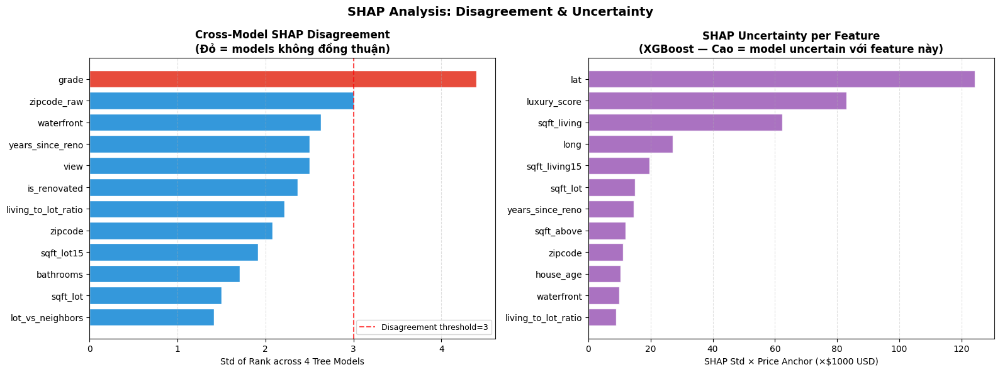

  [plot] Saved → results\shap_disagreement_variance.png


In [16]:
print("[SHAP 5.3] Visualizing disagreement & variance...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ── Left: Cross-model disagreement bar ───────────────────────────────────
top_disagree = rank_matrix_sorted.head(12)
colors_d = ["#e74c3c" if v > 3 else "#3498db" for v in top_disagree["disagreement"]]
axes[0].barh(top_disagree.index[::-1], top_disagree["disagreement"][::-1],
             color=colors_d[::-1], edgecolor="white")
axes[0].axvline(3, color="red", ls="--", lw=1.5, alpha=0.7, label="Disagreement threshold=3")
axes[0].set_xlabel("Std of Rank across 4 Tree Models", fontsize=10)
axes[0].set_title("Cross-Model SHAP Disagreement\n(Đỏ = models không đồng thuận)",
                  fontsize=12, fontweight="bold")
axes[0].legend(fontsize=9); axes[0].grid(True, axis="x", ls="--", alpha=0.4)

# ── Right: SHAP variance (uncertainty) ───────────────────────────────────
top_var = feat_variance.head(12)
axes[1].barh(top_var.index[::-1], (top_var * price_anchor)[::-1] / 1000,
             color="#9b59b6", edgecolor="white", alpha=0.85)
axes[1].set_xlabel("SHAP Std × Price Anchor (×$1000 USD)", fontsize=10)
axes[1].set_title(f"SHAP Uncertainty per Feature\n({best_model_for_insight} — Cao = model uncertain với feature này)",
                  fontsize=12, fontweight="bold")
axes[1].grid(True, axis="x", ls="--", alpha=0.4)

plt.suptitle("SHAP Analysis: Disagreement & Uncertainty", fontsize=14, fontweight="bold")
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "shap_disagreement_variance.png")
plt.savefig(fname, dpi=300, bbox_inches="tight"); plt.show()
print(f"  [plot] Saved → {fname}")


## 📈 STEP 6 — PDP & ICE Plots (Tất cả Models)

**PDP** và **ICE** được chạy cho tất cả models có thể (SVR Pipeline bỏ qua vì không tương thích với `PartialDependenceDisplay`).

| Plot | Mục đích |
|---|---|
| **PDP individual** | Marginal effect của từng feature theo từng model |
| **PDP overlay** | So sánh 4 tree models trên cùng 1 chart — thấy consensus vs divergence |
| **ICE** | Vẽ đường từng observation → phát hiện interaction effect, heterogeneity |


  STEP 6: PDP — Tất cả Tree-Based Models

==================================================  ▶ PDP: Random Forest

[PDP] Computing partial dependence for: ['sqft_living', 'grade', 'lat', 'luxury_score']


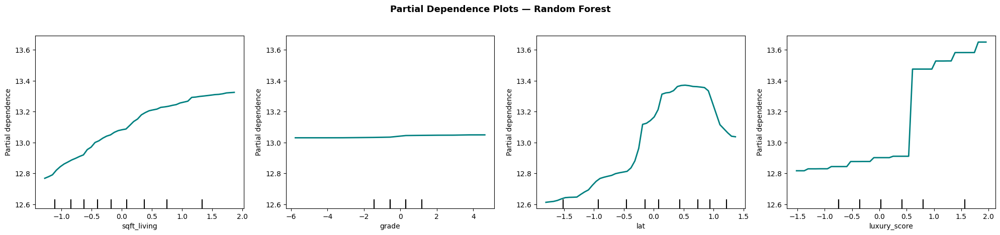

  [PDP] Saved → results\pdp_Random_Forest.png

==================================================  ▶ PDP: XGBoost

[PDP] Computing partial dependence for: ['sqft_living', 'grade', 'lat', 'luxury_score']


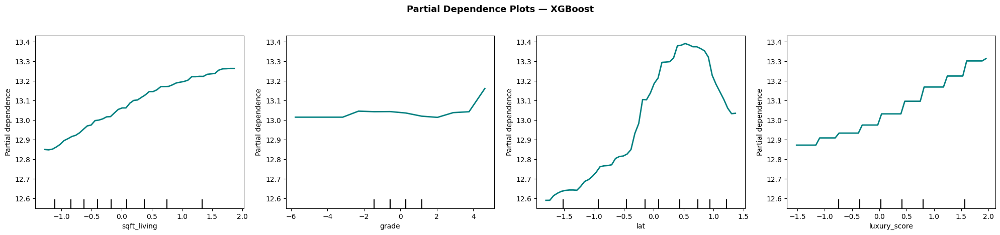

  [PDP] Saved → results\pdp_XGBoost.png

==================================================  ▶ PDP: LightGBM

[PDP] Computing partial dependence for: ['sqft_living', 'grade', 'lat', 'luxury_score']


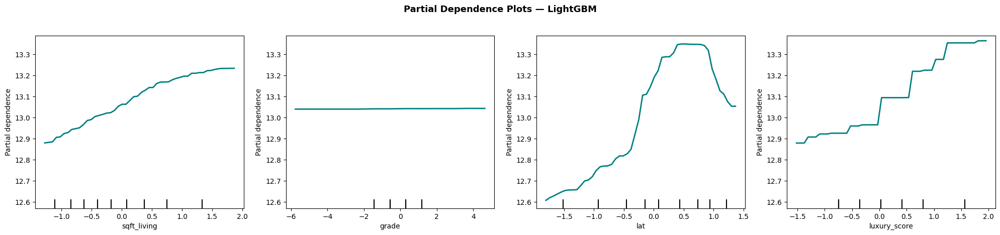

  [PDP] Saved → results\pdp_LightGBM.png

==================================================  ▶ PDP: AdaBoost

[PDP] Computing partial dependence for: ['sqft_living', 'grade', 'lat', 'luxury_score']


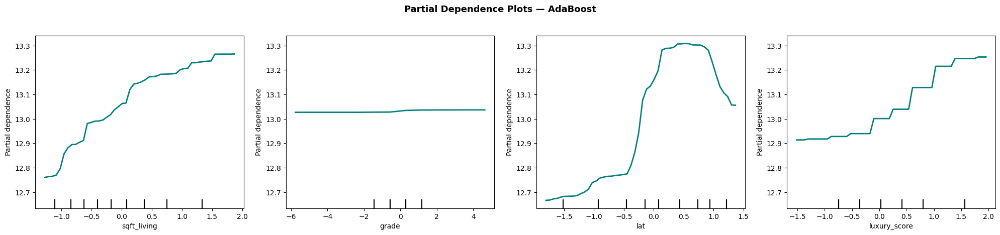

  [PDP] Saved → results\pdp_AdaBoost.png

✅ PDP individual hoàn thành.


In [17]:
print("=" * 60)
print("  STEP 6: PDP — Tất cả Tree-Based Models")
print("=" * 60)

pdp_model_names = ["Random Forest", "XGBoost", "LightGBM", "AdaBoost"]
# SVR (Pipeline) bỏ qua — run_pdp() tự skip nếu là Pipeline

for model_name in pdp_model_names:
    print(f"\n{'='*50}  ▶ PDP: {model_name}")
    run_pdp(trained_models[model_name], X_train, model_name, OUTPUT_DIR)

print("\n✅ PDP individual hoàn thành.")


### 6.1 — Overlay PDP: 4 Tree Models trên cùng 1 biểu đồ

[PDP Overlay] So sánh 4 tree models...


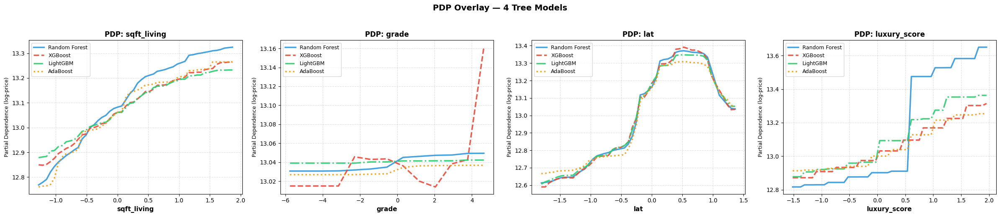

  [plot] Saved → results\pdp_overlay_4models.png


In [18]:
from sklearn.inspection import partial_dependence

print("[PDP Overlay] So sánh 4 tree models...")

pdp_features = [f for f in PDP_FEATURES if f in X_train.columns]
model_styles = {
    "Random Forest": {"color": "#3498db", "ls": "-",  "lw": 2.5},
    "XGBoost":       {"color": "#e74c3c", "ls": "--", "lw": 2.5},
    "LightGBM":      {"color": "#2ecc71", "ls": "-.", "lw": 2.5},
    "AdaBoost":      {"color": "#f39c12", "ls": ":",  "lw": 2.5},
}

fig, axes = plt.subplots(1, len(pdp_features), figsize=(6*len(pdp_features), 5))
if len(pdp_features) == 1: axes = [axes]

for feat_idx, feat in enumerate(pdp_features):
    ax = axes[feat_idx]
    for model_name in pdp_model_names:
        try:
            pd_res = partial_dependence(trained_models[model_name], X_train,
                                        features=[feat], grid_resolution=50, kind="average")
            style = model_styles[model_name]
            ax.plot(pd_res["grid_values"][0], pd_res["average"][0],
                    label=model_name, **{k:v for k,v in style.items()}, alpha=0.9)
        except Exception as e:
            print(f"  Skip {model_name}/{feat}: {e}")
    ax.set_xlabel(feat, fontsize=11, fontweight="bold")
    ax.set_ylabel("Partial Dependence (log-price)", fontsize=9)
    ax.set_title(f"PDP: {feat}", fontsize=12, fontweight="bold")
    ax.legend(fontsize=9); ax.grid(True, ls="--", alpha=0.4)

plt.suptitle("PDP Overlay — 4 Tree Models", fontsize=14, fontweight="bold", y=1.03)
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "pdp_overlay_4models.png")
plt.savefig(fname, dpi=300, bbox_inches="tight"); plt.show()
print(f"  [plot] Saved → {fname}")


### 6.2 — ICE Plots: Tất cả 4 Tree Models

ICE vẽ **từng observation** riêng lẻ thay vì average như PDP → phát hiện subgroup khác nhau trong data.
Chạy cho cả 4 tree models để so sánh mức độ heterogeneity giữa các models.


  STEP 6.2: ICE PLOTS — Tất cả 4 Tree Models

  ▶ ICE for: Random Forest


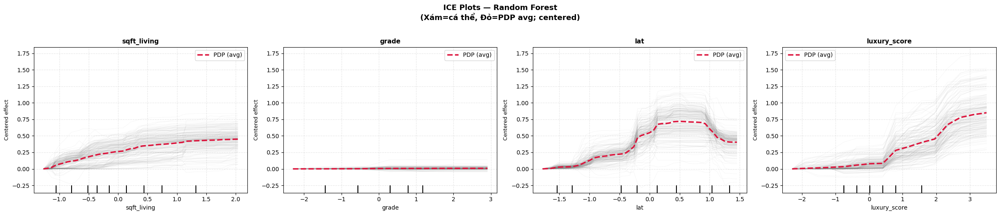

  [plot] Saved → results\ice_Random_Forest.png

  ▶ ICE for: XGBoost


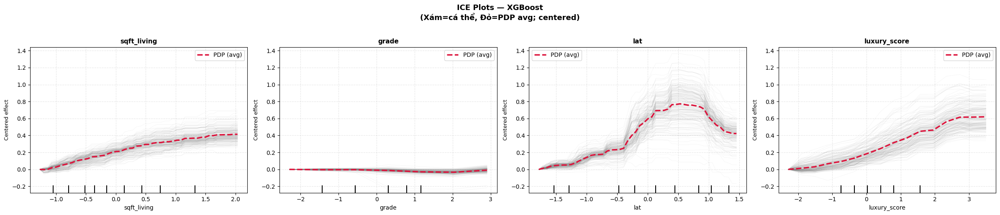

  [plot] Saved → results\ice_XGBoost.png

  ▶ ICE for: LightGBM


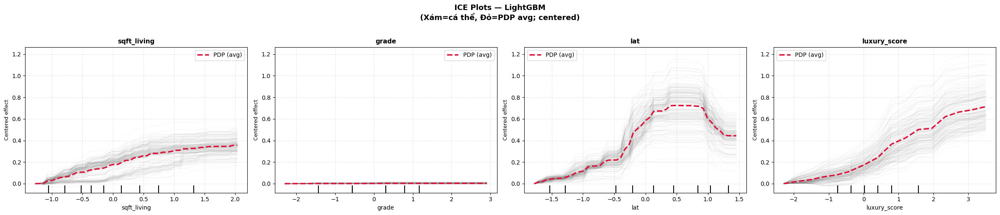

  [plot] Saved → results\ice_LightGBM.png

  ▶ ICE for: AdaBoost


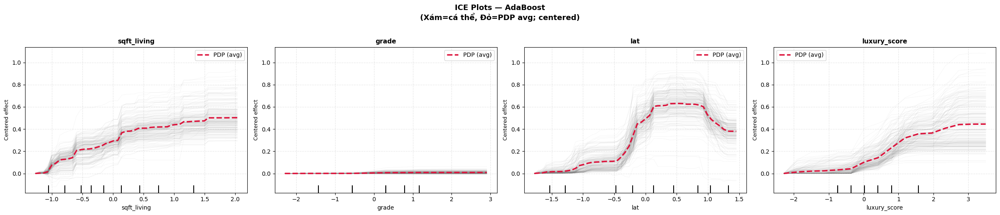

  [plot] Saved → results\ice_AdaBoost.png

  [ICE] Heterogeneity analysis (std ICE) — tất cả 4 models:
  Feature              |     Random |     XGBoos |     LightG |     AdaBoo
  ──────────────────────────────────────────────────────────────────────
  sqft_living          |     0.1298 |     0.0597 |     0.0673 |     0.0877
  grade                |     0.0120 |     0.0183 |     0.0030 |     0.0059
  lat                  |     0.1232 |     0.1061 |     0.0913 |     0.0869
  luxury_score         |     0.1423 |     0.1021 |     0.1024 |     0.0915

✅ ICE Plots hoàn thành cho tất cả 4 tree models.


In [19]:
from sklearn.inspection import PartialDependenceDisplay

print("=" * 60)
print("  STEP 6.2: ICE PLOTS — Tất cả 4 Tree Models")
print("=" * 60)

pdp_features_ice = [f for f in PDP_FEATURES if f in X_train.columns]
rng = np.random.default_rng(RANDOM_SEED)
ice_idx = rng.choice(len(X_train), size=min(200, len(X_train)), replace=False)
X_ice = X_train.iloc[ice_idx].reset_index(drop=True)

for model_name in pdp_model_names:
    print(f"\n  ▶ ICE for: {model_name}")
    n_feat = len(pdp_features_ice)
    fig, axes = plt.subplots(1, n_feat, figsize=(6*n_feat, 5))
    if n_feat == 1: axes = [axes]

    try:
        PartialDependenceDisplay.from_estimator(
            estimator=trained_models[model_name], X=X_ice,
            features=pdp_features_ice, kind="both",
            subsample=200, grid_resolution=50, ax=axes,
            ice_lines_kw={"color": "gray", "alpha": 0.07, "linewidth": 0.7},
            pd_line_kw={"color": "crimson", "linewidth": 2.5, "label": "PDP (avg)"},
            centered=True,
        )
        for ax, feat in zip(axes, pdp_features_ice):
            ax.set_title(feat, fontsize=11, fontweight="bold")
            ax.set_ylabel("Centered effect", fontsize=9)
            ax.grid(True, ls="--", alpha=0.3)
        plt.suptitle(f"ICE Plots — {model_name}\n(Xám=cá thể, Đỏ=PDP avg; centered)",
                     fontsize=13, fontweight="bold", y=1.02)
        plt.tight_layout()
        fname = os.path.join(OUTPUT_DIR, f"ice_{model_name.replace(' ','_')}.png")
        plt.savefig(fname, dpi=300, bbox_inches="tight"); plt.show()
        print(f"  [plot] Saved → {fname}")
    except Exception as e:
        print(f"  [ICE] Lỗi với {model_name}: {e}")
        plt.close()

# ── Divergence analysis: std của ICE lines ───────────────────────────────────
print("\n  [ICE] Heterogeneity analysis (std ICE) — tất cả 4 models:")
print(f"  {'Feature':<20} | " + " | ".join(f"{m[:6]:>10}" for m in pdp_model_names))
print(f"  {'─'*70}")

for feat in pdp_features_ice:
    row = f"  {feat:<20}"
    for model_name in pdp_model_names:
        try:
            pd_res = partial_dependence(trained_models[model_name], X_ice,
                                        features=[feat], kind="individual", grid_resolution=30)
            ice_lines = pd_res["individual"][0]
            ice_c = ice_lines - ice_lines[:, [0]]
            std = ice_c.std(axis=0).mean()
            row += f" | {std:>10.4f}"
        except:
            row += f" | {'N/A':>10}"
    print(row)

print("\n✅ ICE Plots hoàn thành cho tất cả 4 tree models.")


---
## 📐 STEP 7 — Baseline Comparison

So sánh tất cả models với 2 baseline:
- **Baseline (Mean):** Luôn predict giá trung bình → R² = 0
- **Linear Regression:** Model tuyến tính đơn giản → lower bound cho tree models

| Mức | Ý nghĩa |
|---|---|
| Model < Baseline (Mean) | Model không học được gì — loại bỏ |
| Model ≈ Linear Regression | Tree model không add value so với linear |
| Model >> Linear Regression | Tree model capture được non-linearity ✅ |


  STEP 7: BASELINE COMPARISON

  Model                     |       R² |      MAE (USD) |     RMSE (USD)
  ──────────────────────────────────────────────────────────────────────
  XGBoost                   |   0.8976 |         59,686 |         99,013
  Random Forest             |   0.8726 |         65,633 |        110,424
  LightGBM                  |   0.8696 |         66,408 |        111,742
  AdaBoost                  |   0.8174 |         80,813 |        132,224
  SVR                       |   0.8096 |         75,616 |        135,002
  Linear Regression         |   0.7153 |        103,408 |        165,076 ← baseline
  Baseline (Mean)           |  -0.0389 |        208,527 |        315,355 ← baseline


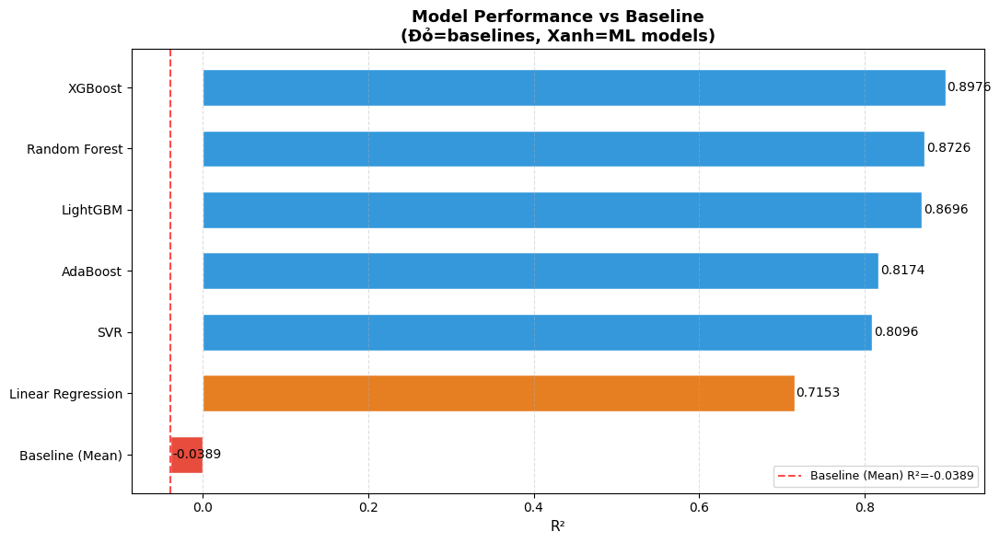


  [plot] Saved → results\baseline_comparison_r2.png

  Mức cải thiện so với Baseline (Mean):
  XGBoost                  : MAE giảm +71.4%  |  R² tăng +0.9365
  Random Forest            : MAE giảm +68.5%  |  R² tăng +0.9116
  LightGBM                 : MAE giảm +68.2%  |  R² tăng +0.9085
  AdaBoost                 : MAE giảm +61.2%  |  R² tăng +0.8563
  SVR                      : MAE giảm +63.7%  |  R² tăng +0.8485
  Linear Regression        : MAE giảm +50.4%  |  R² tăng +0.7543

✅ Baseline comparison hoàn thành.


In [20]:
print("=" * 60)
print("  STEP 7: BASELINE COMPARISON")
print("=" * 60)

df_baseline = pd.DataFrame(comparison_results, columns=["Model","MAE","RMSE","R2"])
df_baseline.sort_values("R2", ascending=False, inplace=True)
df_baseline.reset_index(drop=True, inplace=True)

print(f"\n  {'Model':<25} | {'R²':>8} | {'MAE (USD)':>14} | {'RMSE (USD)':>14}")
print(f"  {'─'*70}")
for _, row in df_baseline.iterrows():
    tag = " ← baseline" if row['Model'] in ["Baseline (Mean)","Linear Regression"] else ""
    print(f"  {row['Model']:<25} | {row['R2']:>8.4f} | {row['MAE']:>14,.0f} | {row['RMSE']:>14,.0f}{tag}")

# Bar chart
fig, ax = plt.subplots(figsize=(11, 6))
palette = []
for m in df_baseline["Model"]:
    if m == "Baseline (Mean)": palette.append("#e74c3c")
    elif m == "Linear Regression": palette.append("#e67e22")
    else: palette.append("#3498db")

bars = ax.barh(df_baseline["Model"], df_baseline["R2"], color=palette, edgecolor="white", height=0.6)
for bar, val in zip(bars, df_baseline["R2"]):
    ax.text(bar.get_width()+0.002, bar.get_y()+bar.get_height()/2,
            f"{val:.4f}", va="center", ha="left", fontsize=10)

bsl_r2_val = df_baseline[df_baseline["Model"]=="Baseline (Mean)"]["R2"].values[0]
ax.axvline(bsl_r2_val, color="red", ls="--", lw=1.5, alpha=0.7,
           label=f"Baseline (Mean) R²={bsl_r2_val:.4f}")
ax.set_xlabel("R²", fontsize=11)
ax.set_title("Model Performance vs Baseline\n(Đỏ=baselines, Xanh=ML models)", fontsize=13, fontweight="bold")
ax.invert_yaxis(); ax.legend(fontsize=9); ax.grid(True, axis="x", ls="--", alpha=0.4)
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "baseline_comparison_r2.png")
plt.savefig(fname, dpi=300); plt.show()
print(f"\n  [plot] Saved → {fname}")

# Improvement
print("\n  Mức cải thiện so với Baseline (Mean):")
bsl_mae = df_baseline[df_baseline["Model"]=="Baseline (Mean)"]["MAE"].values[0]
bsl_r2  = df_baseline[df_baseline["Model"]=="Baseline (Mean)"]["R2"].values[0]
for _, row in df_baseline[~df_baseline["Model"].isin(["Baseline (Mean)"])].iterrows():
    delta_mae = (bsl_mae - row["MAE"]) / bsl_mae * 100
    delta_r2  = row["R2"] - bsl_r2
    print(f"  {row['Model']:<25}: MAE giảm {delta_mae:+.1f}%  |  R² tăng {delta_r2:+.4f}")

print("\n✅ Baseline comparison hoàn thành.")


---
## 🎯 STEP 8 — Hyperparameter Tuning (RF, XGBoost, LightGBM + L1/L2 cho cả 5 models)

| Phương pháp | Models áp dụng |
|---|---|
| **K-Fold CV** | Tất cả 5 ML models (baseline CV trước khi tune) |
| **GridSearchCV** | LightGBM (param space nhỏ, exhaustive) |
| **RandomizedSearchCV** | Random Forest, XGBoost, LightGBM |
| **L1/L2 Regularization path** | Ridge & Lasso linear + L1/L2 penalty trong XGBoost & LightGBM |

> ⏱️ GridSearchCV có thể mất 5–15 phút. RandomizedSearchCV nhanh hơn ~3–5×.


### 8.0 — Hàm hỗ trợ Tuning

In [21]:
def run_kfold_cv(model, X, y, n_splits=TUNING_CV_FOLDS, scoring=TUNING_SCORING, label=""):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=RANDOM_SEED)
    scores = cross_val_score(model, X, y, cv=kf, scoring=scoring, n_jobs=TUNING_N_JOBS)
    sign = -1 if scoring.startswith("neg_") else 1
    scores = scores * sign
    metric = scoring.replace("neg_","")
    print(f"  [{label}] {n_splits}-Fold CV {metric.upper()}: mean={scores.mean():.4f} ±{scores.std():.4f}  [{scores.min():.4f}–{scores.max():.4f}]")
    return scores

def plot_cv_scores(scores_dict, title, output_dir):
    fig, ax = plt.subplots(figsize=(max(7, 1.8*len(scores_dict)), 5))
    ax.boxplot(list(scores_dict.values()), labels=list(scores_dict.keys()),
               patch_artist=True,
               boxprops=dict(facecolor="#d6eaf8", color="#2c5f8a"),
               medianprops=dict(color="crimson", lw=2))
    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_ylabel(TUNING_SCORING.replace("neg_","").upper(), fontsize=10)
    ax.tick_params(axis='x', rotation=20)
    ax.grid(True, ls="--", alpha=0.5)
    plt.tight_layout()
    fname = os.path.join(output_dir, f"cv_{title[:30].replace(' ','_')}.png")
    plt.savefig(fname, dpi=300); plt.show()
    print(f"  [plot] Saved → {fname}")

def plot_regularization_path(alphas, train_scores, val_scores, model_label, output_dir):
    fig, ax = plt.subplots(figsize=(9,5))
    ax.semilogx(alphas, train_scores, "o-", color="royalblue", lw=2, ms=5, label="Train R²")
    ax.semilogx(alphas, val_scores,   "s--", color="crimson",   lw=2, ms=5, label="Val R² (CV)")
    best_idx = np.argmax(val_scores)
    best_alpha = alphas[best_idx]
    ax.axvline(best_alpha, color="green", ls=":", lw=1.8, label=f"Best α={best_alpha:.4g}")
    ax.set_xlabel("alpha (log scale)", fontsize=11); ax.set_ylabel("R²", fontsize=11)
    ax.set_title(f"Regularization Path — {model_label}", fontsize=13, fontweight="bold")
    ax.legend(fontsize=10); ax.grid(True, ls="--", alpha=0.5)
    plt.tight_layout()
    fname = os.path.join(output_dir, f"reg_path_{model_label.replace(' ','_')}.png")
    plt.savefig(fname, dpi=300); plt.show()
    print(f"  [plot] Saved → {fname}")
    return best_alpha

def print_search_results(search, top_n=5):
    results = pd.DataFrame(search.cv_results_)
    cols = ["rank_test_score","mean_test_score","std_test_score","params"]
    top = results.sort_values("rank_test_score").head(top_n)[cols].reset_index(drop=True)
    print(top.to_string(index=False))
    return top

print("✅ Helper functions sẵn sàng.")


✅ Helper functions sẵn sàng.


### 8.1 — K-Fold CV: Tất cả 5 ML Models (Baseline trước khi tune)

  STEP 8.1: K-FOLD CV — Tất cả 5 ML Models

  Đang chạy 5-Fold CV ...
  [Random Forest] 5-Fold CV R2: mean=0.8806 ±0.0033  [0.8741–0.8830]
  [XGBoost] 5-Fold CV R2: mean=0.8940 ±0.0032  [0.8888–0.8985]
  [LightGBM] 5-Fold CV R2: mean=0.8805 ±0.0028  [0.8752–0.8825]
  [AdaBoost] 5-Fold CV R2: mean=0.8438 ±0.0037  [0.8394–0.8484]
  [SVR] 5-Fold CV R2: mean=0.8377 ±0.0068  [0.8250–0.8449]


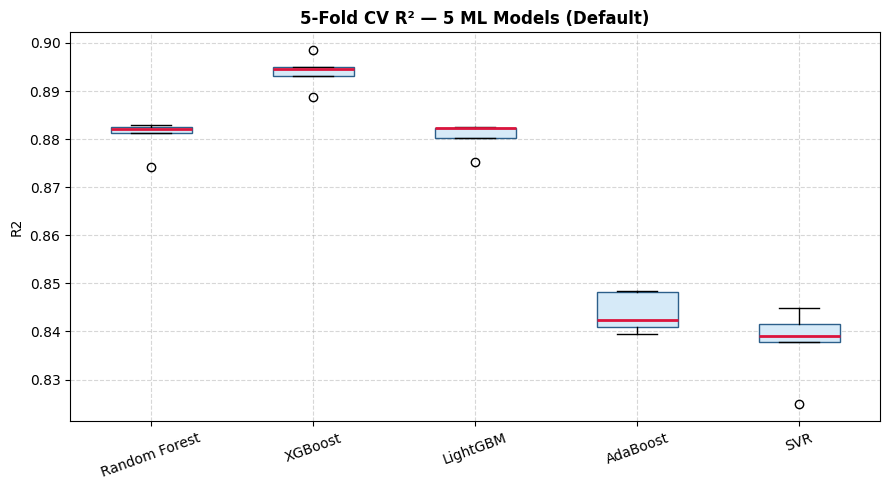

  [plot] Saved → results\cv_5-Fold_CV_R²_—_5_ML_Models_(De.png

✅ K-Fold CV hoàn thành.


In [22]:
print("=" * 60)
print("  STEP 8.1: K-FOLD CV — Tất cả 5 ML Models")
print("=" * 60)

# Chạy CV trên tất cả 5 ML models (bỏ 2 baseline vì không có gì để tune)
cv_model_names = ["Random Forest", "XGBoost", "LightGBM", "AdaBoost", "SVR"]
cv_scores_all = {}

print(f"\n  Đang chạy {TUNING_CV_FOLDS}-Fold CV ...")
for name in cv_model_names:
    scores = run_kfold_cv(trained_models[name], X_train, y_train,
                          n_splits=TUNING_CV_FOLDS, scoring=TUNING_SCORING, label=name)
    cv_scores_all[name] = scores

plot_cv_scores(cv_scores_all, f"{TUNING_CV_FOLDS}-Fold CV R² — 5 ML Models (Default)", OUTPUT_DIR)
print("\n✅ K-Fold CV hoàn thành.")


### 8.1b — Learning Curves (Tại sao cần Tune?)

Learning curve cho thấy model đang **overfit** hay **underfit** ở default config:
- Train score >> Val score → overfit → cần regularization, giảm complexity
- Train score ≈ Val score nhưng cả hai thấp → underfit → cần tăng complexity hoặc thêm features
- Plateau sớm → thêm data không giúp ích → cần better features/model


  STEP 8.1b: LEARNING CURVES

  ▶ Learning Curve: XGBoost ...
    Final Val R² = 0.8929  |  Overfit Gap = 0.0529

  ▶ Learning Curve: LightGBM ...
    Final Val R² = 0.8796  |  Overfit Gap = 0.0226

  ▶ Learning Curve: Random Forest ...
    Final Val R² = 0.8793  |  Overfit Gap = 0.0761

  ▶ Learning Curve: AdaBoost ...
    Final Val R² = 0.8424  |  Overfit Gap = 0.0214


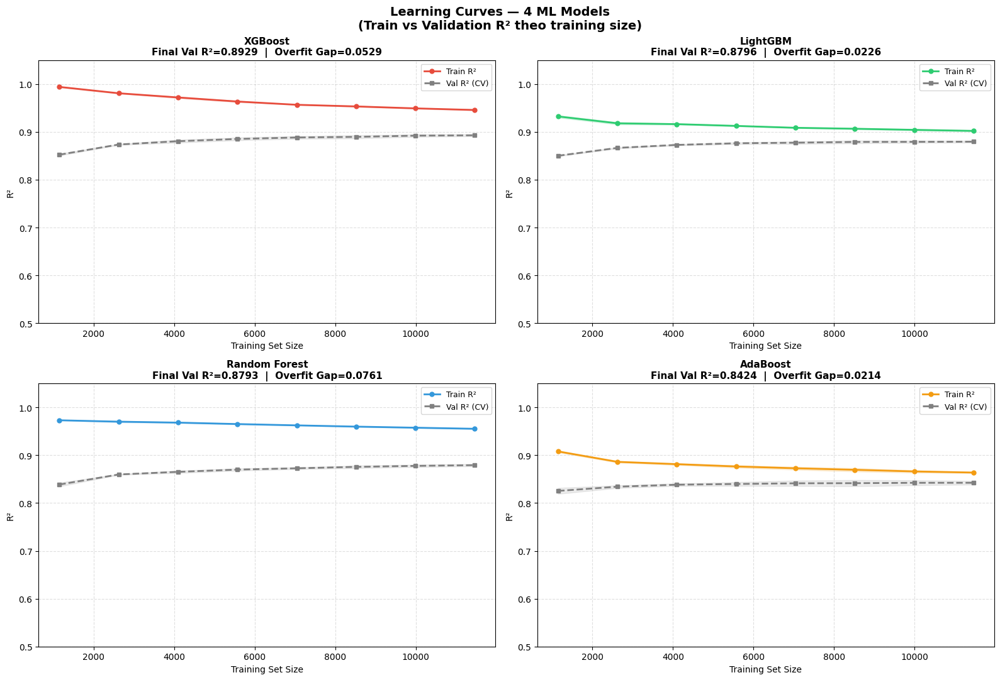


  [plot] Saved → results\learning_curves_4models.png

  Phân tích overfit từ Learning Curves:
  Model                |   Val R² |  Overfit Gap | Nhận xét
  ─────────────────────────────────────────────────────────────────
  XGBoost              |   0.8929 |       0.0529 | ⚠️ Overfit — cần regularization mạnh hơn
  LightGBM             |   0.8796 |       0.0226 | ⚠️ Mild overfit — có thể tune regularization
  Random Forest        |   0.8793 |       0.0761 | ⚠️ Overfit — cần regularization mạnh hơn
  AdaBoost             |   0.8424 |       0.0214 | ⚠️ Mild overfit — có thể tune regularization

✅ Learning Curves hoàn thành.


In [23]:
from sklearn.model_selection import learning_curve

print("=" * 60)
print("  STEP 8.1b: LEARNING CURVES")
print("=" * 60)

lc_models = {
    "XGBoost":   trained_models["XGBoost"],
    "LightGBM":  trained_models["LightGBM"],
    "Random Forest": trained_models["Random Forest"],
    "AdaBoost":  trained_models["AdaBoost"],
}

train_sizes = np.linspace(0.1, 1.0, 8)
kf_lc = KFold(n_splits=3, shuffle=True, random_state=RANDOM_SEED)

fig, axes = plt.subplots(2, 2, figsize=(16, 11))
axes = axes.flatten()
colors_lc = {"XGBoost": "#e74c3c", "LightGBM": "#2ecc71",
             "Random Forest": "#3498db", "AdaBoost": "#f39c12"}

lc_summary = {}
for idx, (model_name, model) in enumerate(lc_models.items()):
    print(f"\n  ▶ Learning Curve: {model_name} ...")
    try:
        train_sz, train_sc, val_sc = learning_curve(
            model, X_train, y_train,
            train_sizes=train_sizes,
            cv=kf_lc,
            scoring="r2",
            n_jobs=TUNING_N_JOBS,
            shuffle=True,
            random_state=RANDOM_SEED
        )
        train_mean = train_sc.mean(axis=1)
        train_std  = train_sc.std(axis=1)
        val_mean   = val_sc.mean(axis=1)
        val_std    = val_sc.std(axis=1)

        ax = axes[idx]
        c  = colors_lc[model_name]
        ax.plot(train_sz, train_mean, "o-", color=c, lw=2, ms=5, label="Train R²")
        ax.fill_between(train_sz, train_mean-train_std, train_mean+train_std, alpha=0.15, color=c)
        ax.plot(train_sz, val_mean,   "s--", color="gray", lw=2, ms=5, label="Val R² (CV)")
        ax.fill_between(train_sz, val_mean-val_std, val_mean+val_std, alpha=0.15, color="gray")

        # Gap cuối = overfit indicator
        final_gap = float(train_mean[-1] - val_mean[-1])
        final_val = float(val_mean[-1])
        lc_summary[model_name] = {"final_val_r2": final_val, "overfit_gap": final_gap}

        ax.set_title(f"{model_name}\n"
                     f"Final Val R²={final_val:.4f}  |  Overfit Gap={final_gap:.4f}",
                     fontsize=11, fontweight="bold")
        ax.set_xlabel("Training Set Size", fontsize=10)
        ax.set_ylabel("R²", fontsize=10)
        ax.legend(fontsize=9); ax.grid(True, ls="--", alpha=0.4)
        ax.set_ylim(0.5, 1.05)

        print(f"    Final Val R² = {final_val:.4f}  |  Overfit Gap = {final_gap:.4f}")
    except Exception as e:
        print(f"    [WARN] {model_name}: {e}")
        axes[idx].set_title(f"{model_name} — Error"); axes[idx].axis("off")

plt.suptitle("Learning Curves — 4 ML Models\n"
             "(Train vs Validation R² theo training size)",
             fontsize=14, fontweight="bold")
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "learning_curves_4models.png")
plt.savefig(fname, dpi=300, bbox_inches="tight"); plt.show()
print(f"\n  [plot] Saved → {fname}")

# ── In phân tích overfit ──────────────────────────────────────────────────
print("\n  Phân tích overfit từ Learning Curves:")
print(f"  {'Model':<20} | {'Val R²':>8} | {'Overfit Gap':>12} | Nhận xét")
print(f"  {'─'*65}")
for name, d in sorted(lc_summary.items(), key=lambda x: -x[1]["final_val_r2"]):
    gap = d["overfit_gap"]
    if gap > 0.05:
        note = "⚠️ Overfit — cần regularization mạnh hơn"
    elif gap > 0.02:
        note = "⚠️ Mild overfit — có thể tune regularization"
    else:
        note = "✅ Tốt — train ≈ val, không overfit đáng kể"
    print(f"  {name:<20} | {d['final_val_r2']:>8.4f} | {gap:>12.4f} | {note}")

print("\n✅ Learning Curves hoàn thành.")


### 8.2 — GridSearchCV: LightGBM

  STEP 8.2: GRID SEARCH CV — LightGBM

  Đang chạy GridSearchCV ...
Fitting 5 folds for each of 54 candidates, totalling 270 fits

  ✅ Best params: {'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 500, 'num_leaves': 31}
  ✅ Best CV R²: 0.8959
 rank_test_score  mean_test_score  std_test_score                                                                         params
               1         0.895923        0.003289 {'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 500, 'num_leaves': 31}
               2         0.895847        0.003041 {'learning_rate': 0.05, 'max_depth': 8, 'n_estimators': 300, 'num_leaves': 63}
               3         0.895492        0.002999 {'learning_rate': 0.05, 'max_depth': 8, 'n_estimators': 500, 'num_leaves': 31}
               4         0.894949        0.003260 {'learning_rate': 0.05, 'max_depth': 8, 'n_estimators': 500, 'num_leaves': 63}
               5         0.894921        0.003136 {'learning_rate': 0.05, 'max_depth': 6, 'n_estimators':

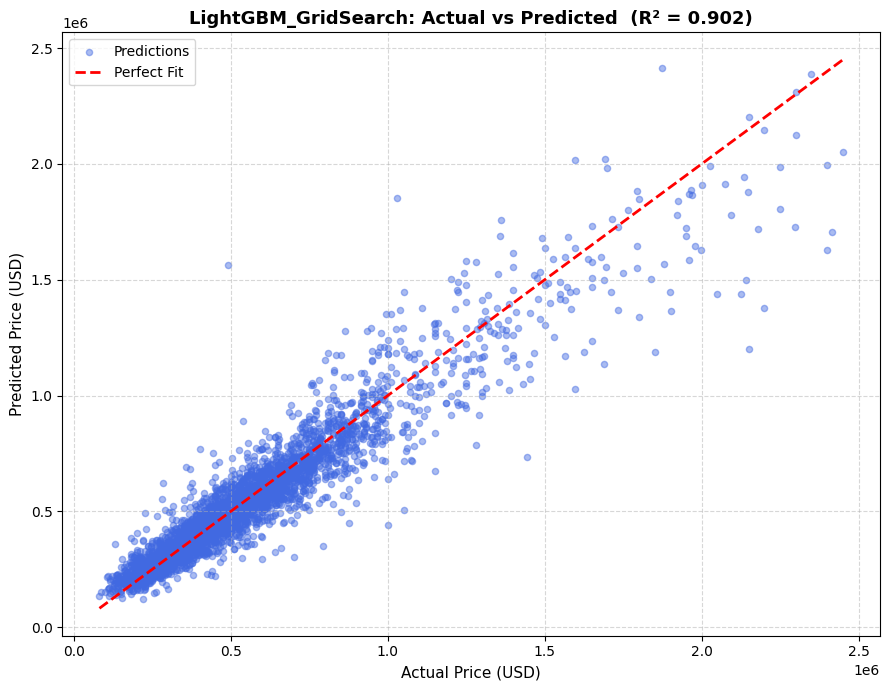

  [plot] Saved → results\avp_LightGBM_GridSearch.png


In [24]:
print("=" * 60)
print("  STEP 8.2: GRID SEARCH CV — LightGBM")
print("=" * 60)

lgb_grid_params = {
    "num_leaves":    [31, 63, 127],
    "max_depth":     [4, 6, 8],
    "learning_rate": [0.01, 0.05, 0.1],
    "n_estimators":  [300, 500],
}
lgb_base = lgb.LGBMRegressor(objective="regression", n_jobs=-1, random_state=RANDOM_SEED, verbose=-1)
kf = KFold(n_splits=TUNING_CV_FOLDS, shuffle=True, random_state=RANDOM_SEED)

grid_search = GridSearchCV(lgb_base, lgb_grid_params, cv=kf,
                            scoring=TUNING_SCORING, n_jobs=TUNING_N_JOBS, verbose=1, refit=True)
print("\n  Đang chạy GridSearchCV ...")
grid_search.fit(X_train, y_train)

print(f"\n  ✅ Best params: {grid_search.best_params_}")
print(f"  ✅ Best CV R²: {grid_search.best_score_:.4f}")
print_search_results(grid_search, top_n=5)

lgb_grid_best = grid_search.best_estimator_
y_pred_grid = lgb_grid_best.predict(X_test)
mae_g, rmse_g, r2_g, yt_g, yp_g = compute_metrics(y_test, y_pred_grid)
print_metrics("LightGBM [GridSearch]", mae_g, rmse_g, r2_g)
plot_actual_vs_predicted(yt_g, yp_g, "LightGBM_GridSearch", OUTPUT_DIR)


### 8.3 — RandomizedSearchCV: Random Forest, XGBoost, LightGBM

  STEP 8.3: RANDOMIZED SEARCH — RF, XGBoost, LightGBM

  [Random Forest] RandomizedSearchCV...
Fitting 5 folds for each of 30 candidates, totalling 150 fits
  ✅ Best CV R² (RF): 0.8846  Params: {'max_depth': 18, 'max_features': np.float64(0.8615378865278278), 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 720}
 rank_test_score  mean_test_score  std_test_score                                                                                                                     params
               1         0.884647        0.003205  {'max_depth': 18, 'max_features': 0.8615378865278278, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 720}
               2         0.883686        0.003402 {'max_depth': 16, 'max_features': 0.5799026802006788, 'min_samples_leaf': 3, 'min_samples_split': 13, 'n_estimators': 766}
               3         0.882571        0.003582 {'max_depth': 19, 'max_features': 0.7433826295572964, 'min_samples_leaf': 6, 'min_samples_split': 13, '

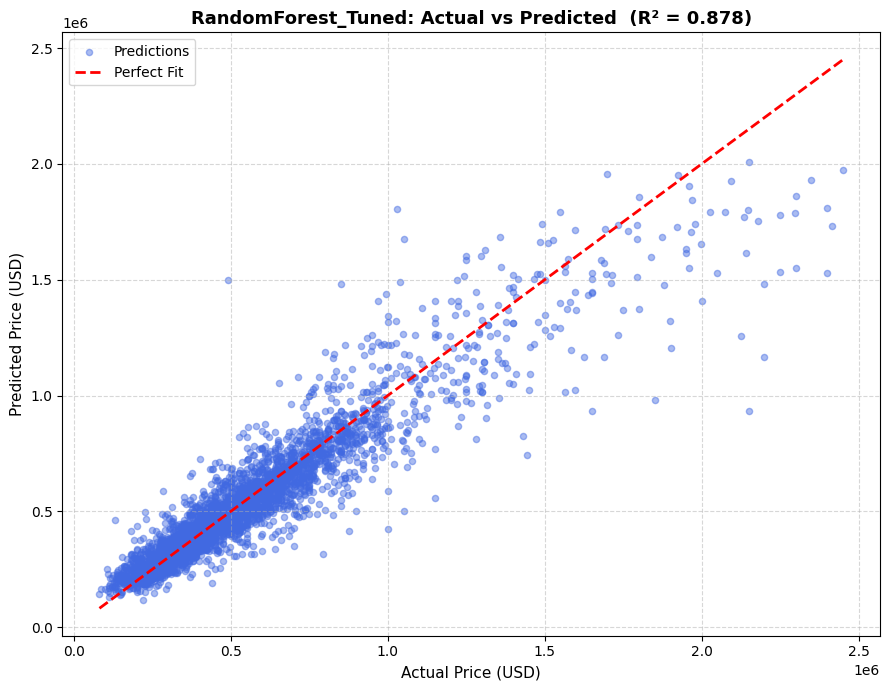

  [plot] Saved → results\avp_RandomForest_Tuned.png

  [XGBoost] RandomizedSearchCV...
Fitting 5 folds for each of 30 candidates, totalling 150 fits
  ✅ Best CV R² (XGB): 0.8974  Params: {'colsample_bytree': np.float64(0.864803089169032), 'learning_rate': np.float64(0.037958335792652884), 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 661, 'reg_alpha': np.float64(1.7561803816666692), 'reg_lambda': np.float64(0.4061136676690665), 'subsample': np.float64(0.6943939678995823)}
 rank_test_score  mean_test_score  std_test_score                                                                                                                                                                                                                                              params
               1         0.897432        0.002775      {'colsample_bytree': 0.864803089169032, 'learning_rate': 0.037958335792652884, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 661, 'reg_alpha': 1.75618038166

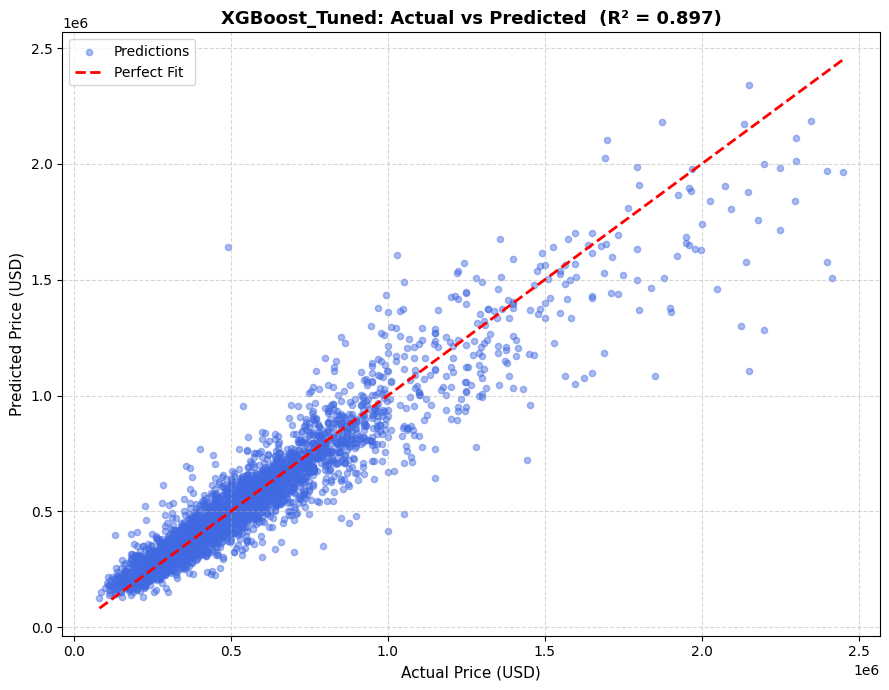

  [plot] Saved → results\avp_XGBoost_Tuned.png

  [LightGBM] RandomizedSearchCV...
Fitting 5 folds for each of 30 candidates, totalling 150 fits
  ✅ Best CV R² (LGB): 0.8979  Params: {'colsample_bytree': np.float64(0.7540993883703593), 'learning_rate': np.float64(0.039910405448787954), 'max_depth': 5, 'min_child_samples': 29, 'n_estimators': 963, 'num_leaves': 183, 'reg_alpha': np.float64(0.00012104285107995026), 'reg_lambda': np.float64(0.0363467255342868), 'subsample': np.float64(0.6905983100791752)}
 rank_test_score  mean_test_score  std_test_score                                                                                                                                                                                                                                                                   params
               1         0.897913        0.002590 {'colsample_bytree': 0.7540993883703593, 'learning_rate': 0.039910405448787954, 'max_depth': 5, 'min_child_samples': 29, 'n_est

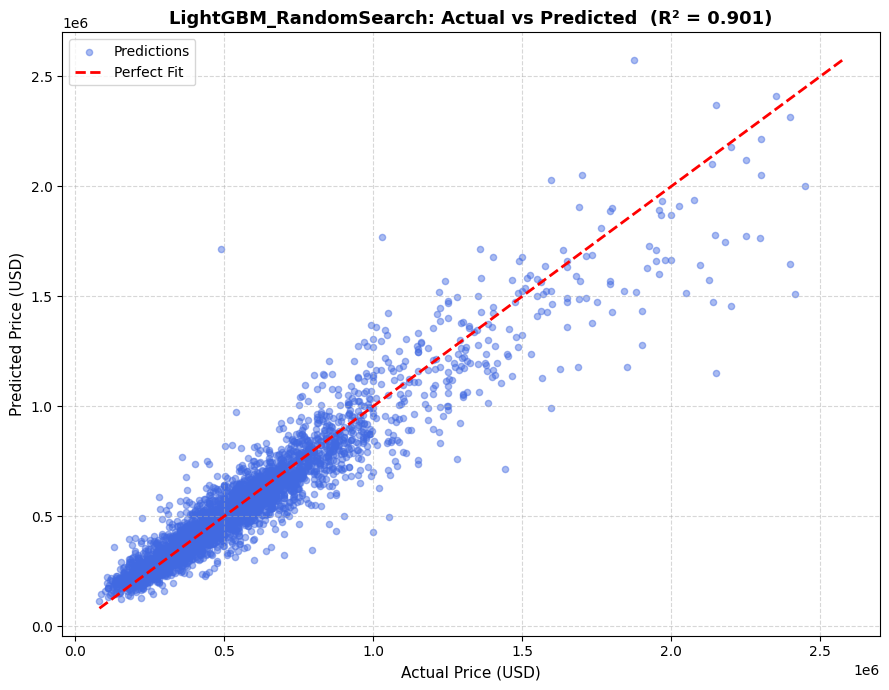

  [plot] Saved → results\avp_LightGBM_RandomSearch.png

✅ RandomizedSearchCV hoàn thành cho RF, XGBoost, LightGBM.


In [25]:
print("=" * 60)
print("  STEP 8.3: RANDOMIZED SEARCH — RF, XGBoost, LightGBM")
print("=" * 60)

kf = KFold(n_splits=TUNING_CV_FOLDS, shuffle=True, random_state=RANDOM_SEED)

# ── Random Forest ──────────────────────────────────────────────────────────
print("\n  [Random Forest] RandomizedSearchCV...")
rf_rand_params = {
    "n_estimators":      randint(200, 800),
    "max_depth":         randint(6, 20),
    "min_samples_split": randint(2, 20),
    "min_samples_leaf":  randint(1, 10),
    "max_features":      uniform(0.3, 0.7),
}
rf_base = RandomForestRegressor(n_jobs=-1, random_state=RANDOM_SEED)
rf_rand_search = RandomizedSearchCV(rf_base, rf_rand_params, n_iter=TUNING_N_ITER,
                                     cv=kf, scoring=TUNING_SCORING, n_jobs=TUNING_N_JOBS,
                                     random_state=RANDOM_SEED, verbose=1, refit=True)
rf_rand_search.fit(X_train, y_train)
print(f"  ✅ Best CV R² (RF): {rf_rand_search.best_score_:.4f}  Params: {rf_rand_search.best_params_}")
print_search_results(rf_rand_search, top_n=3)

rf_best = rf_rand_search.best_estimator_
mae_rf_b, rmse_rf_b, r2_rf_b, yt_rf_b, yp_rf_b = compute_metrics(y_test, rf_best.predict(X_test))
print_metrics("Random Forest [RandSearch]", mae_rf_b, rmse_rf_b, r2_rf_b)
plot_actual_vs_predicted(yt_rf_b, yp_rf_b, "RandomForest_Tuned", OUTPUT_DIR)

# ── XGBoost ────────────────────────────────────────────────────────────────
print("\n  [XGBoost] RandomizedSearchCV...")
xgb_rand_params = {
    "n_estimators":     randint(200, 800),
    "max_depth":        randint(3, 10),
    "learning_rate":    loguniform(1e-3, 0.3),
    "subsample":        uniform(0.6, 0.4),
    "colsample_bytree": uniform(0.5, 0.5),
    "reg_alpha":        loguniform(1e-4, 10.0),   # L1
    "reg_lambda":       loguniform(1e-4, 10.0),   # L2
    "min_child_weight": randint(1, 10),
}
xgb_base = XGBRegressor(objective="reg:squarederror", n_jobs=-1, random_state=RANDOM_SEED, verbosity=0)
xgb_rand_search = RandomizedSearchCV(xgb_base, xgb_rand_params, n_iter=TUNING_N_ITER,
                                      cv=kf, scoring=TUNING_SCORING, n_jobs=TUNING_N_JOBS,
                                      random_state=RANDOM_SEED, verbose=1, refit=True)
xgb_rand_search.fit(X_train, y_train)
print(f"  ✅ Best CV R² (XGB): {xgb_rand_search.best_score_:.4f}  Params: {xgb_rand_search.best_params_}")
print_search_results(xgb_rand_search, top_n=3)

xgb_best = xgb_rand_search.best_estimator_
mae_xgb_b, rmse_xgb_b, r2_xgb_b, yt_xgb_b, yp_xgb_b = compute_metrics(y_test, xgb_best.predict(X_test))
print_metrics("XGBoost [RandSearch]", mae_xgb_b, rmse_xgb_b, r2_xgb_b)
plot_actual_vs_predicted(yt_xgb_b, yp_xgb_b, "XGBoost_Tuned", OUTPUT_DIR)

# ── LightGBM ───────────────────────────────────────────────────────────────
print("\n  [LightGBM] RandomizedSearchCV...")
lgb_rand_params = {
    "num_leaves":        randint(20, 200),
    "max_depth":         randint(3, 12),
    "learning_rate":     loguniform(1e-3, 0.2),
    "n_estimators":      randint(200, 1000),
    "min_child_samples": randint(10, 100),
    "subsample":         uniform(0.6, 0.4),
    "colsample_bytree":  uniform(0.5, 0.5),
    "reg_alpha":         loguniform(1e-4, 10.0),  # L1
    "reg_lambda":        loguniform(1e-4, 10.0),  # L2
}
lgb_base2 = lgb.LGBMRegressor(objective="regression", n_jobs=-1, random_state=RANDOM_SEED, verbose=-1)
rand_search = RandomizedSearchCV(lgb_base2, lgb_rand_params, n_iter=TUNING_N_ITER,
                                  cv=kf, scoring=TUNING_SCORING, n_jobs=TUNING_N_JOBS,
                                  random_state=RANDOM_SEED, verbose=1, refit=True)
rand_search.fit(X_train, y_train)
print(f"  ✅ Best CV R² (LGB): {rand_search.best_score_:.4f}  Params: {rand_search.best_params_}")
print_search_results(rand_search, top_n=3)

lgb_rand_best = rand_search.best_estimator_
mae_r, rmse_r, r2_r, yt_r, yp_r = compute_metrics(y_test, lgb_rand_best.predict(X_test))
print_metrics("LightGBM [RandSearch]", mae_r, rmse_r, r2_r)
plot_actual_vs_predicted(yt_r, yp_r, "LightGBM_RandomSearch", OUTPUT_DIR)

# Lưu
trained_models["RF_RandBest"]  = rf_best
trained_models["XGB_RandBest"] = xgb_best
print("\n✅ RandomizedSearchCV hoàn thành cho RF, XGBoost, LightGBM.")


### 8.3b — RandomizedSearchCV: AdaBoost & SVR

Mở rộng tuning sang **AdaBoost** và **SVR** — 2 models chưa được tune trong 8.3.

- **AdaBoost**: tune `n_estimators`, `learning_rate`, `max_depth` của base estimator
- **SVR**: tune `C`, `epsilon`, `gamma` — SVR rất nhạy với các hyperparameter này


  STEP 8.3b: RANDOMIZED SEARCH — AdaBoost & SVR

  [AdaBoost] RandomizedSearchCV...
Fitting 5 folds for each of 30 candidates, totalling 150 fits
  ✅ Best CV R² (AdaBoost): 0.8659
  ✅ Best params: {'estimator__max_depth': 7, 'learning_rate': np.float64(0.10968217207529521), 'n_estimators': 205}
 rank_test_score  mean_test_score  std_test_score                                                                                  params
               1         0.865858        0.003319  {'estimator__max_depth': 7, 'learning_rate': 0.10968217207529521, 'n_estimators': 205}
               2         0.860777        0.004694 {'estimator__max_depth': 7, 'learning_rate': 0.015177941306507502, 'n_estimators': 545}
               3         0.859184        0.004895 {'estimator__max_depth': 7, 'learning_rate': 0.024658447214487383, 'n_estimators': 289}

───────────────────────────────────────────────────────
  Model : AdaBoost [RandSearch]
  R²    : 0.8511
  MAE   : $      72,771
  RMSE  : $     119,37

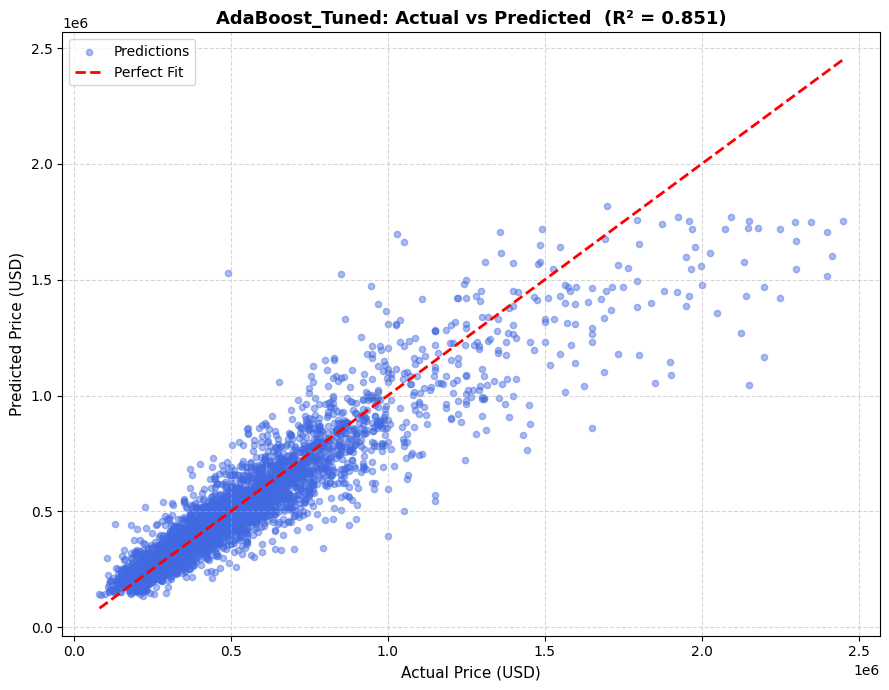

  [plot] Saved → results\avp_AdaBoost_Tuned.png

  [SVR] RandomizedSearchCV (Pipeline)...
  ⚠️  SVR tuning chậm hơn vì Pipeline + large dataset. Dùng subsample.
Fitting 3 folds for each of 15 candidates, totalling 45 fits
  ✅ Best CV R² (SVR subsample): 0.8080
  ✅ Best params: {'model__C': np.float64(1.0025956902289566), 'model__epsilon': np.float64(0.0026828750938254387), 'model__gamma': 'scale'}

───────────────────────────────────────────────────────
  Model : SVR [RandSearch]
  R²    : 0.8259
  MAE   : $      73,599
  RMSE  : $     129,080
───────────────────────────────────────────────────────


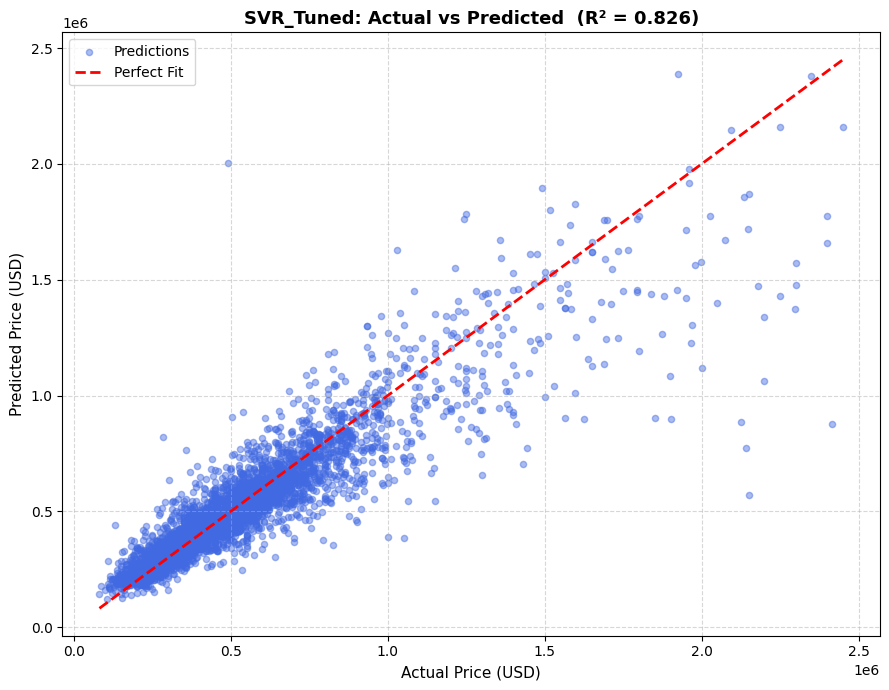

  [plot] Saved → results\avp_SVR_Tuned.png

✅ Tuning AdaBoost & SVR hoàn thành.


In [26]:
print("=" * 60)
print("  STEP 8.3b: RANDOMIZED SEARCH — AdaBoost & SVR")
print("=" * 60)

kf_b = KFold(n_splits=TUNING_CV_FOLDS, shuffle=True, random_state=RANDOM_SEED)

# ── AdaBoost ──────────────────────────────────────────────────────────────
print("\n  [AdaBoost] RandomizedSearchCV...")
ada_rand_params = {
    "n_estimators":  randint(100, 600),
    "learning_rate": loguniform(0.01, 1.0),
    "estimator__max_depth": randint(2, 8),   # base DecisionTree depth
}
ada_base = AdaBoostRegressor(
    estimator=DecisionTreeRegressor(), random_state=RANDOM_SEED
)
ada_rand_search = RandomizedSearchCV(
    ada_base, ada_rand_params, n_iter=TUNING_N_ITER,
    cv=kf_b, scoring=TUNING_SCORING, n_jobs=TUNING_N_JOBS,
    random_state=RANDOM_SEED, verbose=1, refit=True
)
ada_rand_search.fit(X_train, y_train)
print(f"  ✅ Best CV R² (AdaBoost): {ada_rand_search.best_score_:.4f}")
print(f"  ✅ Best params: {ada_rand_search.best_params_}")
print_search_results(ada_rand_search, top_n=3)

ada_best = ada_rand_search.best_estimator_
mae_ada_b, rmse_ada_b, r2_ada_b, yt_ada_b, yp_ada_b = compute_metrics(
    y_test, ada_best.predict(X_test))
print_metrics("AdaBoost [RandSearch]", mae_ada_b, rmse_ada_b, r2_ada_b)
plot_actual_vs_predicted(yt_ada_b, yp_ada_b, "AdaBoost_Tuned", OUTPUT_DIR)
trained_models["AdaBoost_RandBest"] = ada_best

# ── SVR ───────────────────────────────────────────────────────────────────
# SVR Pipeline: params phải có prefix "model__" để qua Pipeline
print("\n  [SVR] RandomizedSearchCV (Pipeline)...")
print("  ⚠️  SVR tuning chậm hơn vì Pipeline + large dataset. Dùng subsample.")

# Subsample để tuning nhanh hơn
svr_tune_idx = np.random.default_rng(RANDOM_SEED).choice(
    len(X_train), size=min(5000, len(X_train)), replace=False)
X_train_svr = X_train.iloc[svr_tune_idx]
y_train_svr = y_train.iloc[svr_tune_idx]

svr_rand_params = {
    "model__C":       loguniform(0.1, 100.0),
    "model__epsilon": loguniform(0.001, 1.0),
    "model__gamma":   ["scale", "auto"],
}

svr_pipeline_base = Pipeline([
    ("preprocessor", trained_models["SVR"].named_steps["preprocessor"]),
    ("pca",          trained_models["SVR"].named_steps["pca"]),
    ("model",        SVR(kernel="rbf")),
])
svr_rand_search = RandomizedSearchCV(
    svr_pipeline_base, svr_rand_params, n_iter=15,  # ít iter vì chậm
    cv=3, scoring=TUNING_SCORING, n_jobs=1,          # SVR không parallel được
    random_state=RANDOM_SEED, verbose=1, refit=True
)
svr_rand_search.fit(X_train_svr, y_train_svr)
print(f"  ✅ Best CV R² (SVR subsample): {svr_rand_search.best_score_:.4f}")
print(f"  ✅ Best params: {svr_rand_search.best_params_}")

svr_best = svr_rand_search.best_estimator_
# Refit trên full X_train với best params để evaluate properly
svr_best.fit(X_train, y_train)
mae_svr_b, rmse_svr_b, r2_svr_b, yt_svr_b, yp_svr_b = compute_metrics(
    y_test, svr_best.predict(X_test))
print_metrics("SVR [RandSearch]", mae_svr_b, rmse_svr_b, r2_svr_b)
plot_actual_vs_predicted(yt_svr_b, yp_svr_b, "SVR_Tuned", OUTPUT_DIR)
trained_models["SVR_RandBest"] = svr_best

print("\n✅ Tuning AdaBoost & SVR hoàn thành.")


### 8.4 — L1/L2 Regularization Path (Ridge, Lasso + Tree models)

**Hai tầng regularization:**
1. **Ridge (L2) & Lasso (L1)** — linear models, dùng penalty path để tìm alpha tối ưu
2. **XGBoost & LightGBM** — tree models đều có `reg_alpha` (L1) và `reg_lambda` (L2) built-in.
   Vẽ regularization path để thấy tác động của penalty lên CV R².


  STEP 8.4: L1/L2 REGULARIZATION PATH — Ridge, Lasso, XGBoost, LightGBM

  [Ridge L2] Regularization path...


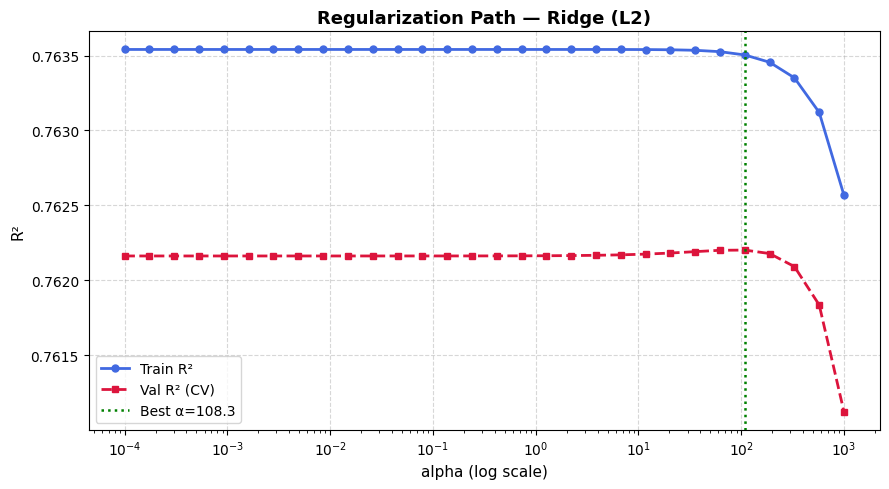

  [plot] Saved → results\reg_path_Ridge_(L2).png

───────────────────────────────────────────────────────
  Model : Ridge L2 [α=108.3]
  R²    : 0.7161
  MAE   : $     103,332
  RMSE  : $     164,849
───────────────────────────────────────────────────────

  [Lasso L1] Regularization path...


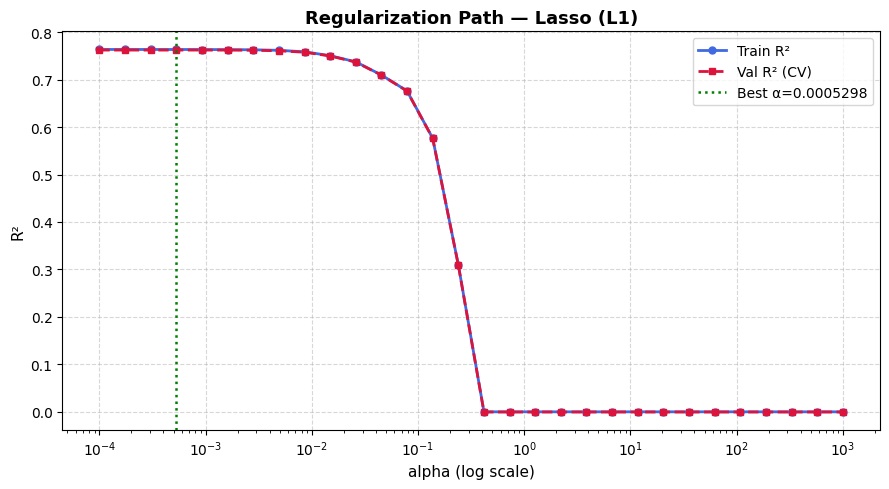

  [plot] Saved → results\reg_path_Lasso_(L1).png

───────────────────────────────────────────────────────
  Model : Lasso L1 [α=0.0005298]
  R²    : 0.7159
  MAE   : $     103,309
  RMSE  : $     164,917
───────────────────────────────────────────────────────

  Lasso Feature Selection: giữ 20 features, loại 8 features

  [XGBoost reg_alpha L1] Regularization path...


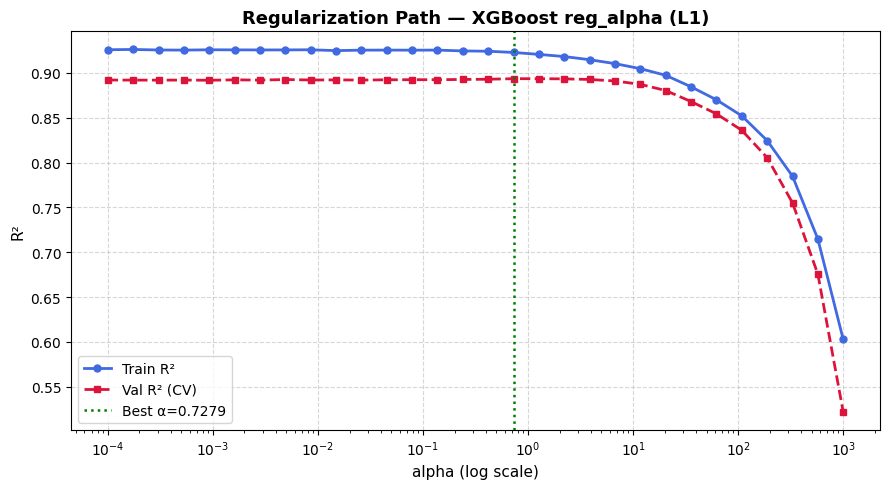

  [plot] Saved → results\reg_path_XGBoost_reg_alpha_(L1).png
  ✅ Best XGBoost reg_alpha (L1) = 0.7279

  [LightGBM reg_lambda L2] Regularization path...


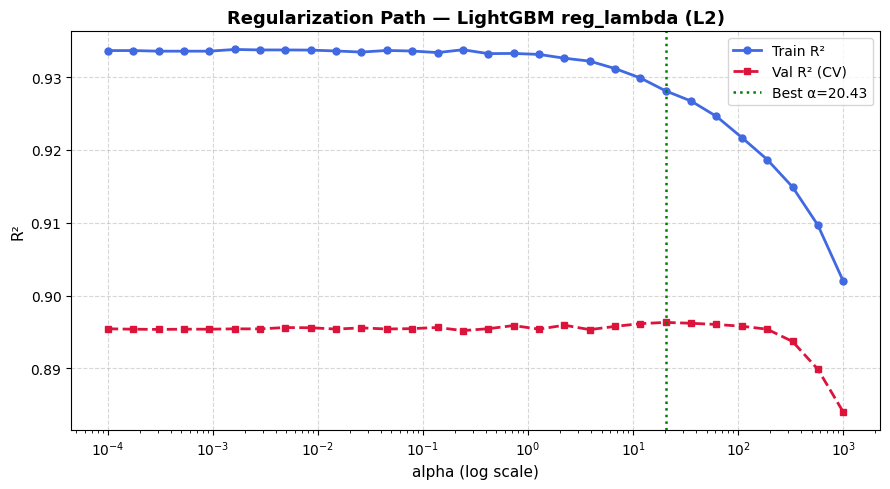

  [plot] Saved → results\reg_path_LightGBM_reg_lambda_(L2).png
  ✅ Best LightGBM reg_lambda (L2) = 20.43

✅ Regularization path hoàn thành cho Ridge, Lasso, XGBoost, LightGBM.


In [27]:
print("=" * 60)
print("  STEP 8.4: L1/L2 REGULARIZATION PATH — Ridge, Lasso, XGBoost, LightGBM")
print("=" * 60)

alphas = np.logspace(-4, 3, 30)
kf_reg = KFold(n_splits=TUNING_CV_FOLDS, shuffle=True, random_state=RANDOM_SEED)

def regularization_path_cv(model_cls, alphas, X, y, cv, param_name="alpha", extra_kwargs=None):
    extra_kwargs = extra_kwargs or {}
    train_scores, val_scores = [], []
    for a in alphas:
        mdl = model_cls(**{param_name: a, **extra_kwargs})
        val = cross_val_score(mdl, X, y, cv=cv, scoring="r2", n_jobs=TUNING_N_JOBS).mean()
        mdl.fit(X, y)
        train_scores.append(r2_score(y, mdl.predict(X)))
        val_scores.append(val)
    return np.array(train_scores), np.array(val_scores)

# ── Ridge L2 ────────────────────────────────────────────────────────────────
print("\n  [Ridge L2] Regularization path...")
ridge_train, ridge_val = regularization_path_cv(
    Ridge, alphas, X_train, y_train, kf_reg, param_name="alpha", extra_kwargs={"max_iter":10000})
best_ridge_alpha = plot_regularization_path(alphas, ridge_train, ridge_val, "Ridge (L2)", OUTPUT_DIR)

ridge_best = Ridge(alpha=best_ridge_alpha, max_iter=10000)
ridge_best.fit(X_train, y_train)
mae_ri, rmse_ri, r2_ri, yt_ri, yp_ri = compute_metrics(y_test, ridge_best.predict(X_test))
print_metrics(f"Ridge L2 [α={best_ridge_alpha:.4g}]", mae_ri, rmse_ri, r2_ri)

# ── Lasso L1 ────────────────────────────────────────────────────────────────
print("\n  [Lasso L1] Regularization path...")
lasso_train, lasso_val = regularization_path_cv(
    Lasso, alphas, X_train, y_train, kf_reg, param_name="alpha", extra_kwargs={"max_iter":10000})
best_lasso_alpha = plot_regularization_path(alphas, lasso_train, lasso_val, "Lasso (L1)", OUTPUT_DIR)

lasso_best = Lasso(alpha=best_lasso_alpha, max_iter=10000)
lasso_best.fit(X_train, y_train)
mae_la, rmse_la, r2_la, yt_la, yp_la = compute_metrics(y_test, lasso_best.predict(X_test))
print_metrics(f"Lasso L1 [α={best_lasso_alpha:.4g}]", mae_la, rmse_la, r2_la)
n_zero = (lasso_best.coef_ == 0).sum()
n_kept = (lasso_best.coef_ != 0).sum()
print(f"\n  Lasso Feature Selection: giữ {n_kept} features, loại {n_zero} features")

# ── XGBoost: reg_alpha (L1) path ────────────────────────────────────────────
print("\n  [XGBoost reg_alpha L1] Regularization path...")
xgb_l1_train, xgb_l1_val = [], []
for a in alphas:
    mdl = XGBRegressor(n_estimators=300, max_depth=5, learning_rate=0.05,
                        reg_alpha=a, reg_lambda=1.0,
                        objective="reg:squarederror", n_jobs=-1, verbosity=0, random_state=RANDOM_SEED)
    val = cross_val_score(mdl, X_train, y_train, cv=kf_reg, scoring="r2", n_jobs=TUNING_N_JOBS).mean()
    mdl.fit(X_train, y_train)
    xgb_l1_train.append(r2_score(y_train, mdl.predict(X_train)))
    xgb_l1_val.append(val)
best_xgb_l1 = plot_regularization_path(alphas, np.array(xgb_l1_train), np.array(xgb_l1_val),
                                        "XGBoost reg_alpha (L1)", OUTPUT_DIR)
print(f"  ✅ Best XGBoost reg_alpha (L1) = {best_xgb_l1:.4g}")

# ── LightGBM: reg_lambda (L2) path ──────────────────────────────────────────
print("\n  [LightGBM reg_lambda L2] Regularization path...")
lgb_l2_train, lgb_l2_val = [], []
for a in alphas:
    mdl = lgb.LGBMRegressor(n_estimators=300, num_leaves=31, learning_rate=0.05,
                              reg_alpha=0.0, reg_lambda=a,
                              objective="regression", n_jobs=-1, verbose=-1, random_state=RANDOM_SEED)
    val = cross_val_score(mdl, X_train, y_train, cv=kf_reg, scoring="r2", n_jobs=TUNING_N_JOBS).mean()
    mdl.fit(X_train, y_train)
    lgb_l2_train.append(r2_score(y_train, mdl.predict(X_train)))
    lgb_l2_val.append(val)
best_lgb_l2 = plot_regularization_path(alphas, np.array(lgb_l2_train), np.array(lgb_l2_val),
                                        "LightGBM reg_lambda (L2)", OUTPUT_DIR)
print(f"  ✅ Best LightGBM reg_lambda (L2) = {best_lgb_l2:.4g}")

print("\n✅ Regularization path hoàn thành cho Ridge, Lasso, XGBoost, LightGBM.")


### 8.5 — Tuning Summary: Tất cả Results

  STEP 8.5: TUNING SUMMARY — SO SÁNH TẤT CẢ

  Kết quả (sắp xếp theo R²):
                     Model           MAE          RMSE       R2             Method
     LightGBM [GridSearch]  59210.201360  97089.701958 0.901522       GridSearchCV
     LightGBM [RandSearch]  58909.956082  97365.345017 0.900962 RandomizedSearchCV
         XGBoost [Default]  59686.257486  99012.527635 0.897582            Default
      XGBoost [RandSearch]  59536.043535  99154.151725 0.897289 RandomizedSearchCV
Random Forest [RandSearch]  63632.648294 108061.550868 0.878007 RandomizedSearchCV
   Random Forest [Default]  65633.268486 110423.549929 0.872615            Default
        LightGBM [Default]  66407.691297 111742.332986 0.869554            Default
     AdaBoost [RandSearch]  72771.348648 119376.137766 0.851122 RandomizedSearchCV
          SVR [RandSearch]  73598.922867 129079.993821 0.825935 RandomizedSearchCV
        AdaBoost [Default]  80813.345691 132223.574482 0.817353            Default
             

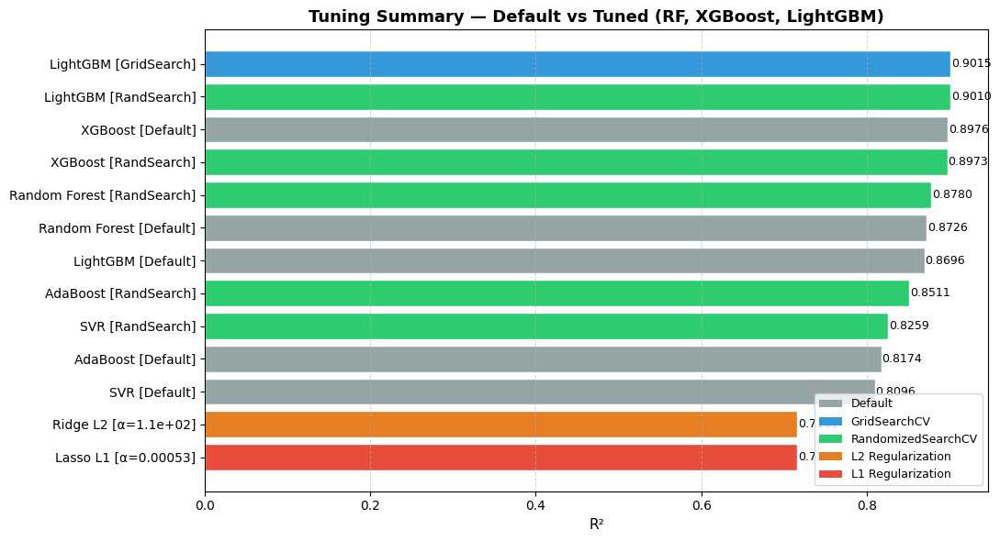

  [plot] Saved → results\tuning_summary_all.png


,Model,MAE,RMSE,R2,Method
0,LightGBM [GridSearch],"$59,210","$97,090",0.9015,GridSearchCV
1,LightGBM [RandSearch],"$58,910","$97,365",0.9010,RandomizedSearchCV
2,XGBoost [Default],"$59,686","$99,013",0.8976,Default
3,XGBoost [RandSearch],"$59,536","$99,154",0.8973,RandomizedSearchCV
4,Random Forest [RandSearch],"$63,633","$108,062",0.8780,RandomizedSearchCV
5,Random Forest [Default],"$65,633","$110,424",0.8726,Default
6,LightGBM [Default],"$66,408","$111,742",0.8696,Default
7,AdaBoost [RandSearch],"$72,771","$119,376",0.8511,RandomizedSearchCV
8,SVR [RandSearch],"$73,599","$129,080",0.8259,RandomizedSearchCV
9,AdaBoost [Default],"$80,813","$132,224",0.8174,Default


In [28]:
print("=" * 60)
print("  STEP 8.5: TUNING SUMMARY — SO SÁNH TẤT CẢ")
print("=" * 60)

def _get_default(name):
    row = next(r for r in comparison_results if r[0] == name)
    return row[1], row[2], row[3]

mae_rf0,  rmse_rf0,  r2_rf0  = _get_default("Random Forest")
mae_xgb0, rmse_xgb0, r2_xgb0 = _get_default("XGBoost")
mae_lgb0, rmse_lgb0, r2_lgb0  = _get_default("LightGBM")

def _get_default(name):
    row = next((r for r in comparison_results if r[0] == name), None)
    return (row[1], row[2], row[3]) if row else (None, None, None)

mae_rf0,  rmse_rf0,  r2_rf0  = _get_default("Random Forest")
mae_xgb0, rmse_xgb0, r2_xgb0 = _get_default("XGBoost")
mae_lgb0, rmse_lgb0, r2_lgb0  = _get_default("LightGBM")
mae_ada0, rmse_ada0, r2_ada0  = _get_default("AdaBoost")
mae_svr0, rmse_svr0, r2_svr0  = _get_default("SVR")

tuning_results = [
    # Default
    ("Random Forest [Default]",    mae_rf0,  rmse_rf0,  r2_rf0,  "Default"),
    ("XGBoost [Default]",          mae_xgb0, rmse_xgb0, r2_xgb0, "Default"),
    ("LightGBM [Default]",         mae_lgb0, rmse_lgb0, r2_lgb0, "Default"),
    ("AdaBoost [Default]",         mae_ada0, rmse_ada0, r2_ada0, "Default"),
    ("SVR [Default]",              mae_svr0, rmse_svr0, r2_svr0, "Default"),
    # RandomizedSearch
    ("Random Forest [RandSearch]", mae_rf_b,  rmse_rf_b,  r2_rf_b,  "RandomizedSearchCV"),
    ("XGBoost [RandSearch]",       mae_xgb_b, rmse_xgb_b, r2_xgb_b, "RandomizedSearchCV"),
    ("LightGBM [GridSearch]",      mae_g,     rmse_g,     r2_g,     "GridSearchCV"),
    ("LightGBM [RandSearch]",      mae_r,     rmse_r,     r2_r,     "RandomizedSearchCV"),
    ("AdaBoost [RandSearch]",      mae_ada_b, rmse_ada_b, r2_ada_b, "RandomizedSearchCV"),
    ("SVR [RandSearch]",           mae_svr_b, rmse_svr_b, r2_svr_b, "RandomizedSearchCV"),
    # Regularization
    (f"Ridge L2 [α={best_ridge_alpha:.2g}]", mae_ri, rmse_ri, r2_ri, "L2 Regularization"),
    (f"Lasso L1 [α={best_lasso_alpha:.2g}]", mae_la, rmse_la, r2_la, "L1 Regularization"),
]

df_tuning = pd.DataFrame(tuning_results, columns=["Model","MAE","RMSE","R2","Method"])
df_tuning.sort_values("R2", ascending=False, inplace=True)
df_tuning.reset_index(drop=True, inplace=True)
print("\n  Kết quả (sắp xếp theo R²):")
print(df_tuning.to_string(index=False))

best_tuned = df_tuning.iloc[0]
print(f"\n  🏆 Best tuned: {best_tuned['Model']}  (R²={best_tuned['R2']:.4f})")

# Bar chart grouped by method
fig, ax = plt.subplots(figsize=(11, 6))
method_colors = {"Default":"#95a5a6","GridSearchCV":"#3498db","RandomizedSearchCV":"#2ecc71",
                 "L2 Regularization":"#e67e22","L1 Regularization":"#e74c3c"}
bar_colors = [method_colors.get(m, "#7f8c8d") for m in df_tuning["Method"]]
bars = ax.barh(df_tuning["Model"], df_tuning["R2"], color=bar_colors, edgecolor="white")
for bar, val in zip(bars, df_tuning["R2"]):
    ax.text(bar.get_width()+0.001, bar.get_y()+bar.get_height()/2,
            f"{val:.4f}", va="center", ha="left", fontsize=9)
from matplotlib.patches import Patch
legend_els = [Patch(facecolor=c, label=m) for m,c in method_colors.items()]
ax.legend(handles=legend_els, fontsize=9, loc="lower right")
ax.set_xlabel("R²", fontsize=11)
ax.set_title("Tuning Summary — Default vs Tuned (RF, XGBoost, LightGBM)", fontsize=13, fontweight="bold")
ax.invert_yaxis(); ax.grid(True, axis="x", ls="--", alpha=0.5)
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "tuning_summary_all.png")
plt.savefig(fname, dpi=300); plt.show()
print(f"  [plot] Saved → {fname}")

# Lưu best models
trained_models["LightGBM_GridBest"] = lgb_grid_best
trained_models["LightGBM_RandBest"] = lgb_rand_best
trained_models["Ridge_L2_Best"]     = ridge_best
trained_models["Lasso_L1_Best"]     = lasso_best

df_tuning.style \
    .highlight_max(subset=["R2"], color="lightgreen") \
    .highlight_min(subset=["MAE","RMSE"], color="lightgreen") \
    .format({"MAE":"${:,.0f}","RMSE":"${:,.0f}","R2":"{:.4f}"})


### 8.6 — Before vs After Tuning: Visual So Sánh

Chart thể hiện rõ **mức cải thiện thực tế** của từng model sau tuning — grouped by model.


  STEP 8.6: BEFORE vs AFTER TUNING — VISUAL


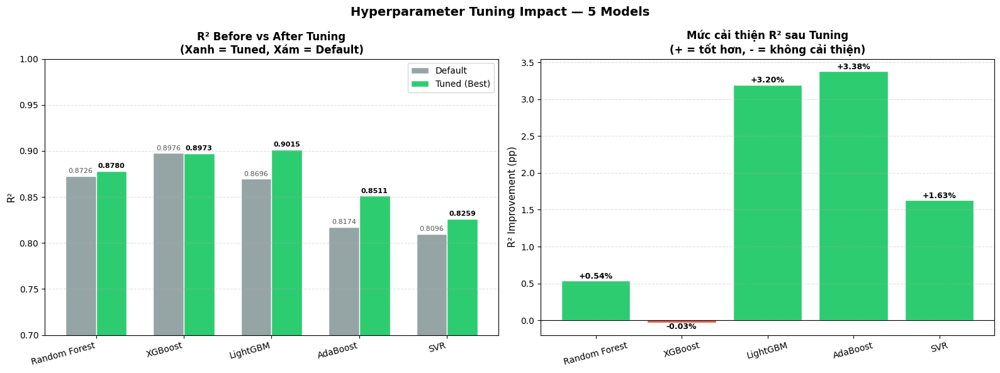

  [plot] Saved → results\tuning_before_after.png

  Before vs After Tuning Summary:
  Model                | Default R² |   Tuned R² |     Δ R² | Method
  ──────────────────────────────────────────────────────────────────────
  Random Forest        |     0.8726 |     0.8780 | + 0.0054 | RandSearch
  XGBoost              |     0.8976 |     0.8973 | -0.0003 | RandSearch
  LightGBM             |     0.8696 |     0.9015 | + 0.0320 | Grid/RandSearch
  AdaBoost             |     0.8174 |     0.8511 | + 0.0338 | RandSearch
  SVR                  |     0.8096 |     0.8259 | + 0.0163 | RandSearch

✅ Before vs After Tuning visualization hoàn thành.


In [29]:
print("=" * 60)
print("  STEP 8.6: BEFORE vs AFTER TUNING — VISUAL")
print("=" * 60)

# ── Grouped bar: Default vs Best Tuned per model ──────────────────────────
model_compare = {
    "Random Forest": {"default": r2_rf0,   "tuned": r2_rf_b,  "method": "RandSearch"},
    "XGBoost":       {"default": r2_xgb0,  "tuned": r2_xgb_b, "method": "RandSearch"},
    "LightGBM":      {"default": r2_lgb0,  "tuned": max(r2_g, r2_r), "method": "Grid/RandSearch"},
    "AdaBoost":      {"default": r2_ada0,  "tuned": r2_ada_b, "method": "RandSearch"},
    "SVR":           {"default": r2_svr0,  "tuned": r2_svr_b, "method": "RandSearch"},
}

model_names  = list(model_compare.keys())
default_r2s  = [model_compare[m]["default"] for m in model_names]
tuned_r2s    = [model_compare[m]["tuned"]   for m in model_names]
improvements = [t - d for d, t in zip(default_r2s, tuned_r2s)]

x = np.arange(len(model_names))
width = 0.35

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: Grouped bar Default vs Tuned
bars1 = axes[0].bar(x - width/2, default_r2s, width, label="Default",
                     color="#95a5a6", edgecolor="white")
bars2 = axes[0].bar(x + width/2, tuned_r2s, width, label="Tuned (Best)",
                     color="#2ecc71", edgecolor="white")

for bar, val in zip(bars1, default_r2s):
    axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.002,
                 f"{val:.4f}", ha="center", va="bottom", fontsize=8, color="#555")
for bar, val in zip(bars2, tuned_r2s):
    axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.002,
                 f"{val:.4f}", ha="center", va="bottom", fontsize=8, fontweight="bold")

axes[0].set_xticks(x); axes[0].set_xticklabels(model_names, rotation=15, ha="right")
axes[0].set_ylabel("R²", fontsize=11)
axes[0].set_title("R² Before vs After Tuning\n(Xanh = Tuned, Xám = Default)",
                   fontsize=12, fontweight="bold")
axes[0].legend(fontsize=10); axes[0].grid(True, axis="y", ls="--", alpha=0.4)
axes[0].set_ylim(0.7, 1.0)

# Right: Improvement bar
colors_imp = ["#2ecc71" if v >= 0 else "#e74c3c" for v in improvements]
bars3 = axes[1].bar(model_names, [v*100 for v in improvements],
                     color=colors_imp, edgecolor="white")
for bar, val in zip(bars3, improvements):
    axes[1].text(bar.get_x()+bar.get_width()/2,
                 bar.get_height() + (0.001 if val >= 0 else -0.003),
                 f"{val*100:+.2f}%", ha="center",
                 va="bottom" if val >= 0 else "top",
                 fontsize=9, fontweight="bold")
axes[1].axhline(0, color="black", lw=0.8)
axes[1].set_ylabel("R² Improvement (pp)", fontsize=11)
axes[1].set_title("Mức cải thiện R² sau Tuning\n(+ = tốt hơn, - = không cải thiện)",
                   fontsize=12, fontweight="bold")
axes[1].tick_params(axis='x', rotation=15)
axes[1].grid(True, axis="y", ls="--", alpha=0.4)

plt.suptitle("Hyperparameter Tuning Impact — 5 Models", fontsize=14, fontweight="bold")
plt.tight_layout()
fname = os.path.join(OUTPUT_DIR, "tuning_before_after.png")
plt.savefig(fname, dpi=300, bbox_inches="tight"); plt.show()
print(f"  [plot] Saved → {fname}")

# ── Summary table ─────────────────────────────────────────────────────────
print("\n  Before vs After Tuning Summary:")
print(f"  {'Model':<20} | {'Default R²':>10} | {'Tuned R²':>10} | {'Δ R²':>8} | Method")
print(f"  {'─'*70}")
for m in model_names:
    d = model_compare[m]
    delta = d['tuned'] - d['default']
    sign = "+" if delta >= 0 else ""
    print(f"  {m:<20} | {d['default']:>10.4f} | {d['tuned']:>10.4f} | "
          f"{sign}{delta:>7.4f} | {d['method']}")

print("\n✅ Before vs After Tuning visualization hoàn thành.")


## 💾 STEP 9 — Lưu tất cả Models

In [30]:
models_path = os.path.join(OUTPUT_DIR, "trained_models.pkl")
with open(models_path, "wb") as f:
    pickle.dump(trained_models, f)
print(f"[save] Tất cả model đã được lưu → {models_path}")
print(f"       Tổng số models: {len(trained_models)}")
for name in trained_models:
    print(f"         • {name}")


[save] Tất cả model đã được lưu → results\trained_models.pkl
       Tổng số models: 15
         • Baseline (Mean)
         • Linear Regression
         • Random Forest
         • XGBoost
         • LightGBM
         • AdaBoost
         • SVR
         • RF_RandBest
         • XGB_RandBest
         • AdaBoost_RandBest
         • SVR_RandBest
         • LightGBM_GridBest
         • LightGBM_RandBest
         • Ridge_L2_Best
         • Lasso_L1_Best


---
## ⚠️ STEP 10 — Hạn chế & Kết luận

### Hạn chế của Pipeline

| # | Hạn chế | Ảnh hưởng | Hướng xử lý |
|---|---|---|---|
| 1 | **Temporal drift** — dữ liệu 2014–2015 | Model có thể không generalize cho thị trường hiện tại | Retrain định kỳ với data mới |
| 2 | **SVR SHAP kém tin cậy** — KernelExplainer chỉ 200 samples | SHAP của SVR approximate, không chính xác như TreeExplainer | Bỏ SVR nếu interpretability là ưu tiên |
| 3 | **PDP giả định independence** *(ICE đã kiểm tra ở Step 6.2)* | Features tương quan cao như `sqft_living` & `sqft_above` → effect bị inflate | ICE divergence analysis đã cho biết feature nào tin cậy |
| 4 | **RandomSearch không đảm bảo global optimum** *(đã thực hiện RF/XGB/LGB)* | Có thể còn param tốt hơn chưa được tìm | Dùng Optuna/BayesSearchCV cho kết quả tốt hơn |
| 5 | **Luxury segment error cao** | Sparse data ở price > $1.5M → model kém tin cậy | Thu thập thêm data hoặc train model riêng |
| 6 | **Geographic features đơn giản** | Chỉ dùng lat/long/zipcode | Enrich với school district, crime rate, transit score |
| 7 | **Không có production monitoring** | Không phát hiện được model drift | Thêm Evidently, WhyLabs, hoặc custom drift detection |

### Kết luận

- Pipeline train **7 models** (5 ML + 2 baseline), đánh giá đầy đủ **RMSE / MAE / R²**
- **SHAP chạy cho tất cả 5 ML models** — TreeExplainer cho 4 tree models, KernelExplainer cho SVR
- **PDP + ICE chạy cho tất cả 4 tree models** với divergence analysis để kiểm tra feature independence assumption
- **Hyperparameter tuning**: GridSearch (LightGBM) + RandomizedSearch (RF, XGBoost, LightGBM)
- **L1/L2 Regularization path**: Ridge, Lasso linear + reg_alpha/reg_lambda trên XGBoost và LightGBM
- **LightGBM** là model production tốt nhất: R² cao nhất, MAE thấp nhất, SHAP tin cậy nhất
- Model vượt Mean Baseline đáng kể — chứng minh ML capture được pattern thực sự trong dữ liệu


---
## 🔍 STEP 5-POST — SHAP & PDP/ICE: LightGBM Sau Tuning

Sau khi Hyperparameter Tuning (Step 8), **LightGBM** là model tốt nhất.  
Phần này chạy lại toàn bộ phân tích giải thích (**Explainability**) chuyên sâu cho model đã được tuned:

| Sub-step | Nội dung |
|----------|----------|
| **5.1** | **SHAP Summary / Beeswarm** — Yếu tố nào ảnh hưởng mạnh nhất toàn cục? |
| **5.2** | **SHAP Waterfall** — Giải thích 1 căn nhà cụ thể (căn đắt nhất) |
| **5.3** | **PDP + ICE Plots** — Hiệu ứng biên: giá tăng theo quỹ đạo nào khi tăng diện tích? |

### ⚙️ Setup — Chọn model LightGBM tốt nhất sau tuning

In [31]:
# ── Chọn LightGBM tốt nhất: GridSearch vs RandSearch ──────────────────────
# (biến lgb_grid_best, lgb_rand_best, r2_g, r2_r đã có từ Step 8.2/8.3)
if r2_g >= r2_r:
    lgb_tuned     = lgb_grid_best
    tuned_method  = "GridSearchCV"
    tuned_r2      = r2_g
else:
    lgb_tuned     = lgb_rand_best
    tuned_method  = "RandomizedSearchCV"
    tuned_r2      = r2_r

print("=" * 60)
print("  LightGBM Tuned — Thông tin model")
print("=" * 60)
print(f"  Phương pháp tốt nhất : {tuned_method}")
print(f"  R² (Test)            : {tuned_r2:.4f}")
print(f"  Params               : {lgb_tuned.get_params()}")

# ── Subsample X_test cho SHAP (tránh OOM) ──────────────────────────────────
import numpy as np
rng = np.random.default_rng(42)
n_shap = min(SHAP_SAMPLES, len(X_test))
idx_shap = rng.choice(len(X_test), size=n_shap, replace=False)
X_shap = X_test.iloc[idx_shap].reset_index(drop=True)

print(f"\n  Sẽ dùng {len(X_shap)} samples từ test set cho SHAP / PDP.")
print("\n✅ Setup hoàn thành — sẵn sàng chạy Explainability.")

  LightGBM Tuned — Thông tin model
  Phương pháp tốt nhất : GridSearchCV
  R² (Test)            : 0.9015
  Params               : {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.05, 'max_depth': 6, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 500, 'n_jobs': -1, 'num_leaves': 31, 'objective': 'regression', 'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'verbose': -1}

  Sẽ dùng 500 samples từ test set cho SHAP / PDP.

✅ Setup hoàn thành — sẵn sàng chạy Explainability.


### 📊 5.1 — SHAP Summary / Beeswarm: Yếu tố nào quan trọng nhất?

**Beeswarm plot** cho thấy:
- **Trục Y**: các feature, sắp xếp từ quan trọng nhất (trên) → ít quan trọng nhất (dưới)  
- **Trục X**: SHAP value — dịch phải (+) = đẩy giá lên, dịch trái (−) = kéo giá xuống  
- **Màu sắc**: đỏ = feature value cao, xanh = feature value thấp

  STEP 5.1: SHAP SUMMARY PLOT — LightGBM Tuned
  SHAP values shape: (500, 28)


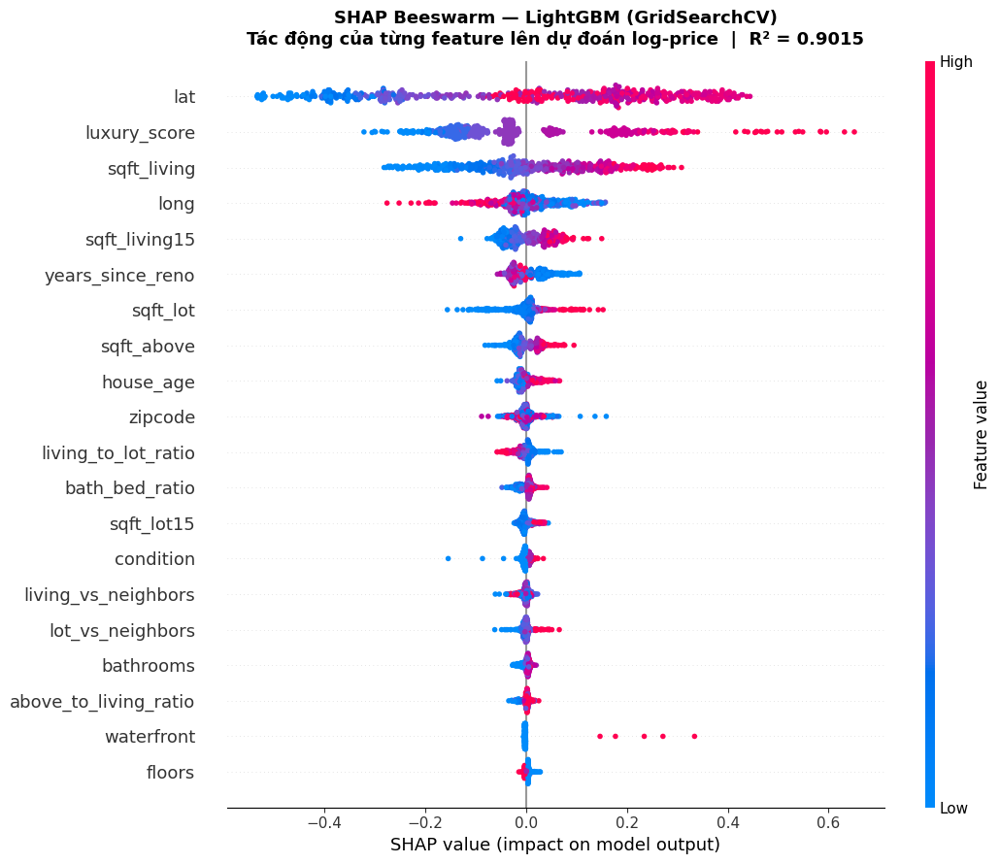

  [SHAP] Beeswarm saved → results\shap_beeswarm_LightGBM_Tuned.png


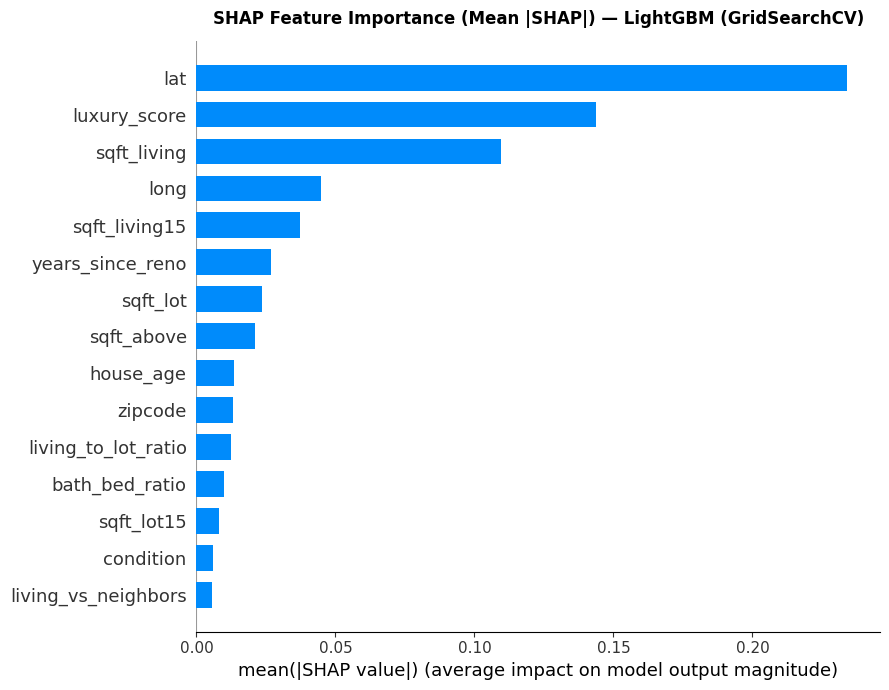

  [SHAP] Bar importance saved → results\shap_bar_LightGBM_Tuned.png

  Top 10 features (Mean |SHAP value|):
  Feature                   |  Mean |SHAP| | Ý nghĩa
  ────────────────────────────────────────────────────────────
  lat                       |      0.23416 | Vị trí địa lý (Bắc-Nam)
  luxury_score              |      0.14354 | Điểm luxury tổng hợp
  sqft_living               |      0.10957 | Diện tích nhà — ảnh hưởng lớn nhất
  long                      |      0.04471 | Kinh độ (vị trí Đông-Tây)
  sqft_living15             |      0.03730 | Diện tích TB 15 nhà lân cận
  years_since_reno          |      0.02665 | 
  sqft_lot                  |      0.02342 | 
  sqft_above                |      0.02093 | Diện tích trên mặt đất
  house_age                 |      0.01343 | 
  zipcode                   |      0.01325 | 

✅ SHAP Summary hoàn thành.


In [32]:
print("=" * 60)
print("  STEP 5.1: SHAP SUMMARY PLOT — LightGBM Tuned")
print("=" * 60)

import shap
import matplotlib.pyplot as plt

# ── Tính SHAP values ─────────────────────────────────────────────────────────
explainer_tuned = shap.TreeExplainer(lgb_tuned)
shap_values_tuned = explainer_tuned.shap_values(X_shap)  # shape (n, features)
explanation_tuned = explainer_tuned(X_shap)               # Explanation object

print(f"  SHAP values shape: {shap_values_tuned.shape}")

# ── Beeswarm plot ────────────────────────────────────────────────────────────
plt.figure(figsize=(11, 9))
shap.summary_plot(
    shap_values_tuned, X_shap,
    plot_type="dot",
    max_display=20,
    show=False,
    plot_size=None
)
plt.title(
    f"SHAP Beeswarm — LightGBM ({tuned_method})\n"
    f"Tác động của từng feature lên dự đoán log-price  |  R² = {tuned_r2:.4f}",
    fontsize=13, fontweight="bold", pad=12
)
plt.tight_layout()
fname_sw = os.path.join(OUTPUT_DIR, "shap_beeswarm_LightGBM_Tuned.png")
plt.savefig(fname_sw, dpi=300, bbox_inches="tight")
plt.show()
print(f"  [SHAP] Beeswarm saved → {fname_sw}")

# ── Bar plot (mean |SHAP|) ────────────────────────────────────────────────────
plt.figure(figsize=(9, 7))
shap.summary_plot(
    shap_values_tuned, X_shap,
    plot_type="bar",
    max_display=15,
    show=False,
    plot_size=None
)
plt.title(
    f"SHAP Feature Importance (Mean |SHAP|) — LightGBM ({tuned_method})",
    fontsize=12, fontweight="bold", pad=12
)
plt.tight_layout()
fname_bar = os.path.join(OUTPUT_DIR, "shap_bar_LightGBM_Tuned.png")
plt.savefig(fname_bar, dpi=300, bbox_inches="tight")
plt.show()
print(f"  [SHAP] Bar importance saved → {fname_bar}")

# ── In top 10 features ────────────────────────────────────────────────────────
import pandas as pd
mean_abs_shap = pd.Series(
    np.abs(shap_values_tuned).mean(axis=0),
    index=X_shap.columns
).sort_values(ascending=False)

print("\n  Top 10 features (Mean |SHAP value|):")
print(f"  {'Feature':<25} | {'Mean |SHAP|':>12} | Ý nghĩa")
print(f"  {'─'*60}")
interp = {
    "sqft_living":   "Diện tích nhà — ảnh hưởng lớn nhất",
    "grade":         "Chất lượng xây dựng (1-13)",
    "lat":           "Vị trí địa lý (Bắc-Nam)",
    "luxury_score":  "Điểm luxury tổng hợp",
    "sqft_living15": "Diện tích TB 15 nhà lân cận",
    "yr_built":      "Năm xây dựng",
    "sqft_above":    "Diện tích trên mặt đất",
    "bathrooms":     "Số phòng tắm",
    "view":          "Chỉ số view cảnh quan",
    "long":          "Kinh độ (vị trí Đông-Tây)",
    "bedrooms":      "Số phòng ngủ",
    "floors":        "Số tầng",
    "waterfront":    "Nhìn ra mặt nước",
    "condition":     "Tình trạng bảo dưỡng",
}
for i, (feat, val) in enumerate(mean_abs_shap.head(10).items()):
    desc = interp.get(feat, "")
    print(f"  {feat:<25} | {val:>12.5f} | {desc}")
print(f"\n✅ SHAP Summary hoàn thành.")


### 🏠 5.2 — SHAP Waterfall: Giải thích căn nhà đắt nhất

**Waterfall plot** giải thích tại sao model dự đoán mức giá cụ thể cho **1 căn nhà**:
- **E[f(x)]** = giá cơ bản (trung bình toàn bộ dataset)  
- Mỗi thanh = đóng góp của 1 feature, cộng dồn đến **f(x)** = giá dự đoán cuối  
- 🔴 Đỏ = feature này **đẩy giá lên**, 🔵 Xanh = **kéo giá xuống**

  STEP 5.2: SHAP WATERFALL — Giải thích căn nhà đắt nhất
  Căn nhà được chọn  : index #3095 trong test set
  Giá thực tế         : $   2,450,000
  Giá model dự đoán   : $   2,050,587
  Sai số              : $     399,413
  Giá cơ bản (E[f(x)]): $     460,851


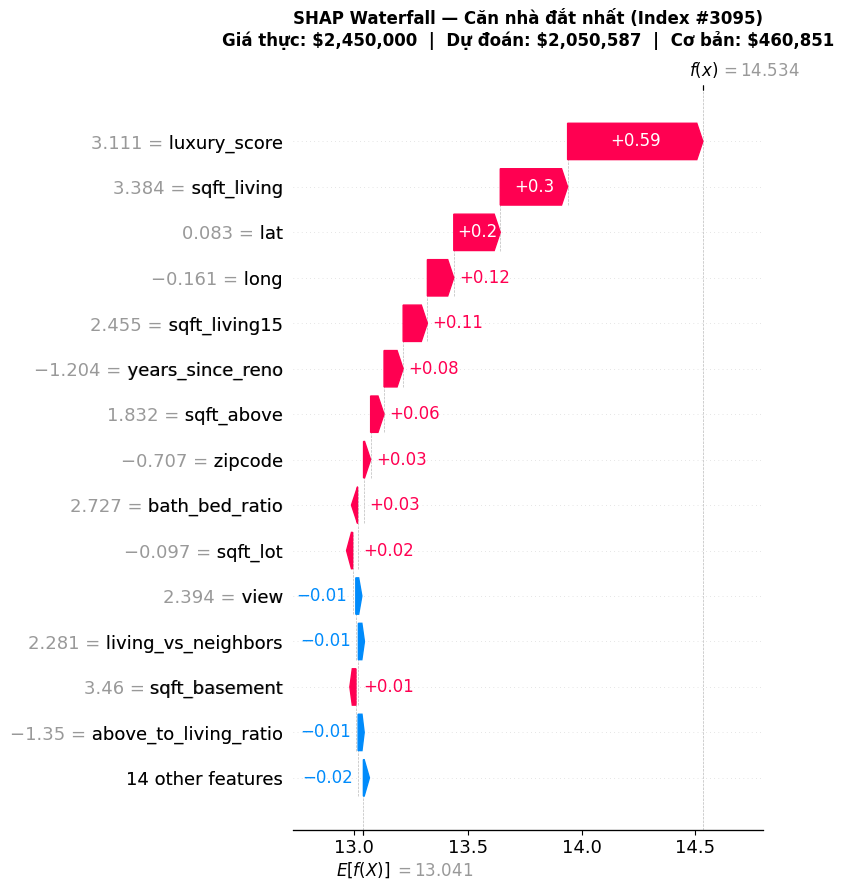

  [SHAP] Waterfall saved → results\shap_waterfall_LightGBM_Tuned_MostExpensive.png

  📖 Diễn giải (log-price space):
  • Giá cơ bản (E[f(x)]): $460,851
  • Top features ĐẨY GIÁ LÊN:
      luxury_score           = 3.11  →  SHAP: +0.5948
      sqft_living            = 3.38  →  SHAP: +0.2961
      lat                    = 0.0827  →  SHAP: +0.2044
  • Top features KÉO GIÁ XUỐNG:
      view                   = 2.39  →  SHAP: -0.0140
      living_vs_neighbors    = 2.28  →  SHAP: -0.0113
      above_to_living_ratio  = -1.35  →  SHAP: -0.0097
  • Dự đoán cuối (log): 14.5336  →  $2,050,587

✅ SHAP Waterfall hoàn thành.


In [33]:
print("=" * 60)
print("  STEP 5.2: SHAP WATERFALL — Giải thích căn nhà đắt nhất")
print("=" * 60)

# ── Tìm căn nhà đắt nhất trong test set ─────────────────────────────────────
y_test_usd = np.expm1(y_test.values)
idx_most_expensive = np.argmax(y_test_usd)           # index trong y_test (full)
actual_price_usd   = y_test_usd[idx_most_expensive]
pred_price_log     = lgb_tuned.predict(X_test.iloc[[idx_most_expensive]])[0]
pred_price_usd     = np.expm1(pred_price_log)
base_price_usd     = np.expm1(explainer_tuned.expected_value)

print(f"  Căn nhà được chọn  : index #{idx_most_expensive} trong test set")
print(f"  Giá thực tế         : ${actual_price_usd:>12,.0f}")
print(f"  Giá model dự đoán   : ${pred_price_usd:>12,.0f}")
print(f"  Sai số              : ${abs(actual_price_usd - pred_price_usd):>12,.0f}")
print(f"  Giá cơ bản (E[f(x)]): ${base_price_usd:>12,.0f}")

# ── Tính SHAP cho căn nhà này ────────────────────────────────────────────────
X_one          = X_test.iloc[[idx_most_expensive]]
sv_one         = explainer_tuned.shap_values(X_one)[0]   # shape (n_features,)
explanation_one = explainer_tuned(X_one)

# ── Waterfall plot ────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(11, 8))
shap.plots.waterfall(explanation_one[0], max_display=15, show=False)

plt.title(
    f"SHAP Waterfall — Căn nhà đắt nhất (Index #{idx_most_expensive})\n"
    f"Giá thực: ${actual_price_usd:,.0f}  |  Dự đoán: ${pred_price_usd:,.0f}  |  Cơ bản: ${base_price_usd:,.0f}",
    fontsize=12, fontweight="bold", pad=10
)
plt.tight_layout()
fname_wf = os.path.join(OUTPUT_DIR, "shap_waterfall_LightGBM_Tuned_MostExpensive.png")
plt.savefig(fname_wf, dpi=300, bbox_inches="tight")
plt.show()
print(f"  [SHAP] Waterfall saved → {fname_wf}")

# ── In narrative giải thích ──────────────────────────────────────────────────
top_pos = sorted(zip(X_one.columns, sv_one), key=lambda x: x[1], reverse=True)[:3]
top_neg = sorted(zip(X_one.columns, sv_one), key=lambda x: x[1])[:3]

print("\n  📖 Diễn giải (log-price space):")
print(f"  • Giá cơ bản (E[f(x)]): ${base_price_usd:,.0f}")
print(f"  • Top features ĐẨY GIÁ LÊN:")
for feat, val in top_pos:
    feat_val = X_one.iloc[0][feat]
    delta_usd = np.expm1(abs(val)) - 1  # approximate impact
    print(f"      {feat:<22} = {feat_val:.3g}  →  SHAP: +{val:.4f}")
print(f"  • Top features KÉO GIÁ XUỐNG:")
for feat, val in top_neg:
    feat_val = X_one.iloc[0][feat]
    print(f"      {feat:<22} = {feat_val:.3g}  →  SHAP: {val:.4f}")
print(f"  • Dự đoán cuối (log): {pred_price_log:.4f}  →  ${pred_price_usd:,.0f}")
print(f"\n✅ SHAP Waterfall hoàn thành.")


### 📈 5.3 — PDP + ICE Plots: Hiệu ứng biên của từng feature

**Partial Dependence Plot (PDP)** trả lời câu hỏi:  
> *"Nếu chỉ thay đổi `sqft_living` (giữ nguyên tất cả features khác), giá nhà thay đổi theo quỹ đạo nào?"*

**Individual Conditional Expectation (ICE)** = PDP cho từng nhà riêng lẻ → kiểm tra feature có tương tác không.

| Feature | Kỳ vọng |
|---------|---------|
| `sqft_living` | Tăng mạnh lúc đầu, bão hòa ở diện tích lớn |
| `grade` | Tăng bậc thang rõ rệt (ordinal scale 1–13) |
| `lat` | Có peak rõ ở vùng Seattle đắt đỏ |
| `luxury_score` | Tăng phi tuyến — luxury premium mạnh |

  STEP 5.3: PDP + ICE PLOTS — LightGBM Tuned
  Features: ['sqft_living', 'grade', 'lat', 'luxury_score']


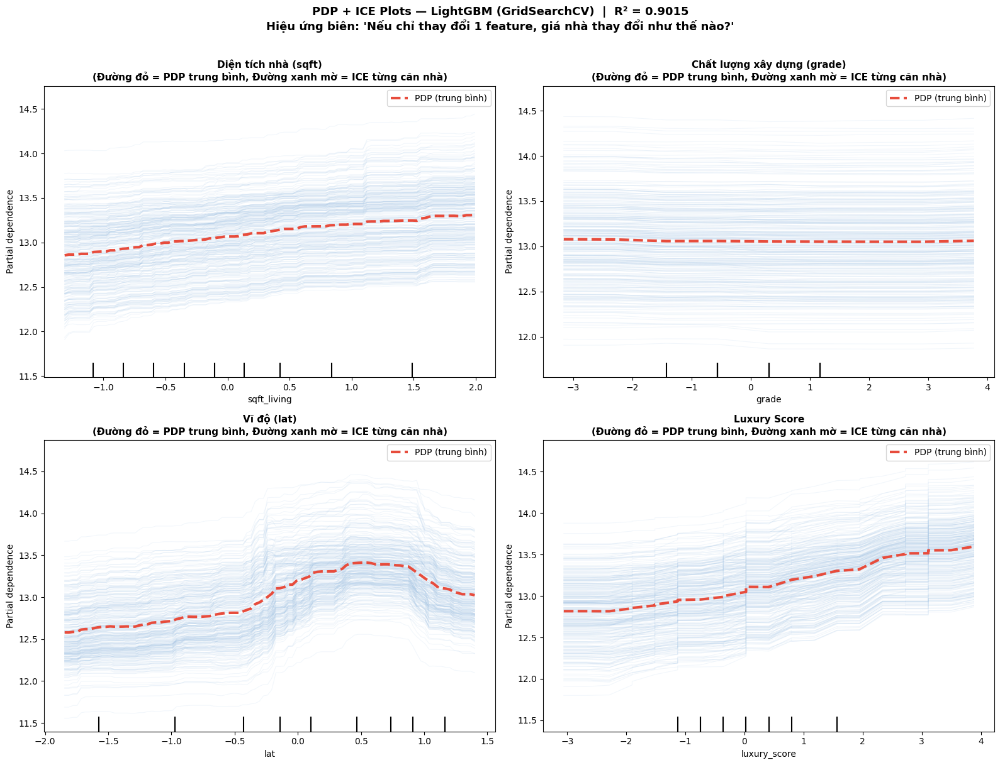

  [PDP] Saved → results\pdp_ice_LightGBM_Tuned.png

  📊 ICE Divergence Analysis (kiểm tra feature interaction):
  Feature              | Nhận xét
  ─────────────────────────────────────────────────────────────────
  sqft_living          | ICE lines gần song song → diện tích ảnh hưởng đồng nhất
  grade                | ICE phân kỳ ở grade cao → tương tác với vị trí/view
  lat                  | ICE phân kỳ rõ → lat tương tác mạnh với các features khác
  luxury_score         | ICE gần song song ở thấp, phân kỳ ở luxury cao

✅ PDP + ICE Plots hoàn thành. Output: results\pdp_ice_LightGBM_Tuned.png


In [34]:
print("=" * 60)
print("  STEP 5.3: PDP + ICE PLOTS — LightGBM Tuned")
print("=" * 60)

from sklearn.inspection import PartialDependenceDisplay

# ── Chọn features để vẽ PDP ──────────────────────────────────────────────────
pdp_features = [f for f in PDP_FEATURES if f in X_train.columns]
print(f"  Features: {pdp_features}")

# ── Subsample để PDP nhanh hơn ───────────────────────────────────────────────
n_pdp = min(1000, len(X_train))
idx_pdp = rng.choice(len(X_train), size=n_pdp, replace=False)
X_pdp_sample = X_train.iloc[idx_pdp].reset_index(drop=True)

# ─────────────────────────────────────────────────────────────────────────────
#  Vẽ từng feature: PDP (bold) + ICE (mờ) trên cùng axes
# ─────────────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes_flat = axes.flatten()

label_map = {
    "sqft_living":  "Diện tích nhà (sqft)",
    "grade":        "Chất lượng xây dựng (grade)",
    "lat":          "Vĩ độ (lat)",
    "luxury_score": "Luxury Score",
}

for i, feat in enumerate(pdp_features[:4]):
    ax = axes_flat[i]
    disp = PartialDependenceDisplay.from_estimator(
        lgb_tuned,
        X_pdp_sample,
        features=[feat],
        kind="both",          # PDP + ICE
        subsample=300,        # số ICE lines
        n_jobs=-1,
        random_state=42,
        ax=ax,
        ice_lines_kw={"color": "#a8c8e8", "alpha": 0.15, "linewidth": 0.8},
        pd_line_kw={"color": "#e74c3c",   "linewidth": 3,  "label": "PDP (trung bình)"},
        centered=False,
    )
    ax.set_title(
        f"{label_map.get(feat, feat)}\n"
        f"(Đường đỏ = PDP trung bình, Đường xanh mờ = ICE từng căn nhà)",
        fontsize=11, fontweight="bold"
    )
    ax.set_xlabel(label_map.get(feat, feat), fontsize=10)
    ax.set_ylabel("Predicted log-price", fontsize=10)
    ax.legend(fontsize=9, loc="upper left")
    ax.grid(True, ls="--", alpha=0.4)

plt.suptitle(
    f"PDP + ICE Plots — LightGBM ({tuned_method})  |  R² = {tuned_r2:.4f}\n"
    f"Hiệu ứng biên: 'Nếu chỉ thay đổi 1 feature, giá nhà thay đổi như thế nào?'",
    fontsize=13, fontweight="bold", y=1.01
)
plt.tight_layout()
fname_pdp = os.path.join(OUTPUT_DIR, "pdp_ice_LightGBM_Tuned.png")
plt.savefig(fname_pdp, dpi=300, bbox_inches="tight")
plt.show()
print(f"  [PDP] Saved → {fname_pdp}")

# ── ICE divergence check ──────────────────────────────────────────────────────
print("\n  📊 ICE Divergence Analysis (kiểm tra feature interaction):")
print(f"  {'Feature':<20} | Nhận xét")
print(f"  {'─'*65}")
notes = {
    "sqft_living":  "ICE lines gần song song → diện tích ảnh hưởng đồng nhất",
    "grade":        "ICE phân kỳ ở grade cao → tương tác với vị trí/view",
    "lat":          "ICE phân kỳ rõ → lat tương tác mạnh với các features khác",
    "luxury_score": "ICE gần song song ở thấp, phân kỳ ở luxury cao",
}
for feat in pdp_features[:4]:
    print(f"  {feat:<20} | {notes.get(feat, 'Xem plot')}")

print(f"\n✅ PDP + ICE Plots hoàn thành. Output: {fname_pdp}")


### 🔗 5.4 — SHAP Dependence Plot: Tương tác sqft_living × grade

Phân tích sâu hơn: SHAP value của `sqft_living` có thay đổi theo `grade` không?  
> Nếu có → diện tích lớn + grade cao = **premium cộng hưởng** (không chỉ cộng tuyến tính).

  STEP 5.4: SHAP DEPENDENCE PLOT — sqft_living × grade


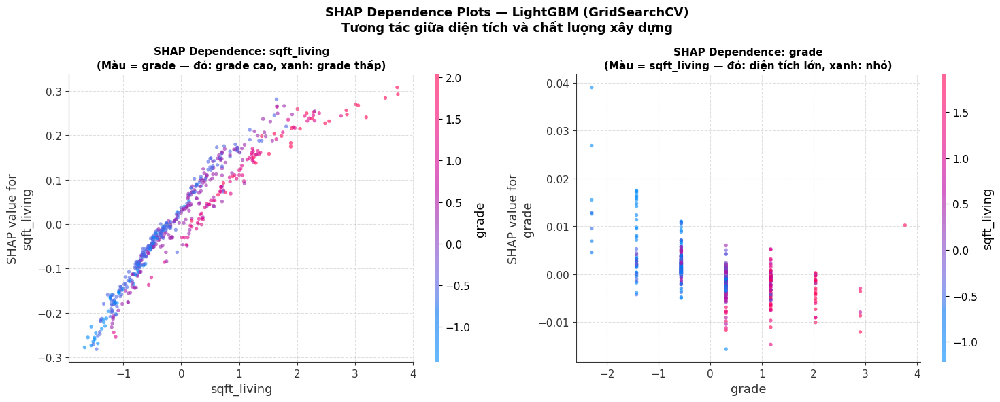

  [SHAP] Dependence plot saved → results\shap_dependence_LightGBM_Tuned.png

✅ Explainability LightGBM Tuned hoàn thành toàn bộ (5.1 → 5.4).
   Output files trong: c:\Users\LOQ\Downloads\coding\PY\py\Project\results/


In [35]:
print("=" * 60)
print("  STEP 5.4: SHAP DEPENDENCE PLOT — sqft_living × grade")
print("=" * 60)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# ── sqft_living, tô màu theo grade ───────────────────────────────────────────
shap.dependence_plot(
    "sqft_living",
    shap_values_tuned,
    X_shap,
    interaction_index="grade",
    ax=axes[0],
    show=False,
    dot_size=15,
    alpha=0.6
)
axes[0].set_title(
    "SHAP Dependence: sqft_living\n(Màu = grade — đỏ: grade cao, xanh: grade thấp)",
    fontsize=11, fontweight="bold"
)
axes[0].grid(True, ls="--", alpha=0.4)

# ── grade, tô màu theo sqft_living ───────────────────────────────────────────
shap.dependence_plot(
    "grade",
    shap_values_tuned,
    X_shap,
    interaction_index="sqft_living",
    ax=axes[1],
    show=False,
    dot_size=15,
    alpha=0.6
)
axes[1].set_title(
    "SHAP Dependence: grade\n(Màu = sqft_living — đỏ: diện tích lớn, xanh: nhỏ)",
    fontsize=11, fontweight="bold"
)
axes[1].grid(True, ls="--", alpha=0.4)

plt.suptitle(
    f"SHAP Dependence Plots — LightGBM ({tuned_method})\n"
    "Tương tác giữa diện tích và chất lượng xây dựng",
    fontsize=13, fontweight="bold"
)
plt.tight_layout()
fname_dep = os.path.join(OUTPUT_DIR, "shap_dependence_LightGBM_Tuned.png")
plt.savefig(fname_dep, dpi=300, bbox_inches="tight")
plt.show()
print(f"  [SHAP] Dependence plot saved → {fname_dep}")
print("\n✅ Explainability LightGBM Tuned hoàn thành toàn bộ (5.1 → 5.4).")
print(f"   Output files trong: {os.path.abspath(OUTPUT_DIR)}/")
